[28.86751346 35.35533906 35.35533906]
[28.86751346  0.          0.        ]


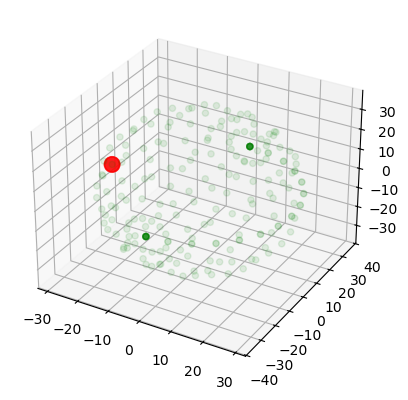

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy.linalg as linalg

# Define dimensions
egg_chamber_length = 28.86751346
egg_chamber_width = 35.35533906
egg_chamber_height = 35.35533906
A = np.array([[3,0,0],[0,2,0],[0,0,2]])
center = [0,0,0]

# find the rotation matrix and radii of the axes
U, s, rotation = linalg.svd(A)
radii = 50.0/np.sqrt(s)
print(radii)
longitudinal_axis_direction = np.dot(rotation,U[:, 0])  # The first column of U
leftmost_origin = center - radii[0] * longitudinal_axis_direction
rightmost_origin = center + radii[0] * longitudinal_axis_direction
print(rightmost_origin)# - leftmost_origin)

# Cell counts
nurse_cells_count = 360
border_cells_count = 6
polar_cells_count = 2
#epithelial_cells_count = 300 - (nurse_cells_count + border_cells_count + polar_cells_count)

# Initialize empty lists to store positions
nurse_cell_positions = []
border_cell_positions = []
polar_cell_position = []
epithelial_cell_positions = []

# Nurse Cells: Clustered but distributed across the posterior half with more spread
nurse_cell_positions = []
while len(nurse_cell_positions) < nurse_cells_count:
    # Generate a random point inside a unit sphere
    u = np.random.uniform(0, 1)
    theta = np.random.uniform(0, 2 * np.pi)
    phi = np.random.uniform(0, np.pi)

    # Convert spherical to Cartesian coordinates
    x = u ** (1/3) * np.cos(theta) * np.sin(phi)
    y = u ** (1/3) * np.sin(theta) * np.sin(phi)
    z = u ** (1/3) * np.cos(phi)

    # Scale by ellipsoid radii to fit within the egg chamber
    point = radii * np.array([x, y, z])

    # Append the scaled point to the positions list
    nurse_cell_positions.append(point)

# Convert list to a numpy array
nurse_cell_positions = np.array(nurse_cell_positions)

# Polar Cells: Position at the anterior pole (or add another at the posterior if needed)
polar_cell_position = np.array([leftmost_origin])  # Polar cell at origin

# Radius for hexagonal packing around the polar cell
radius = 0.1  # Border cells are D distance away from polar cell

# Initialize list for border cell positions
border_cell_positions = []

# Place border cells in hexagonal pattern around polar cell
phi_increment = np.pi * (3 - np.sqrt(5))  # Golden angle for even distribution on sphere

for i in range(border_cells_count):
    z = radius * (1 - (2 * i / (border_cells_count - 1)))  # Uniformly spaced z values
    r = np.sqrt(radius**2 - z**2)  # Radius at this z slice
    theta = i * phi_increment
    x = r * np.cos(theta)
    y = r * np.sin(theta)
    b_pos = polar_cell_position[0] + np.array([x,y,z])
    border_cell_positions.append(b_pos)
border_cell_positions = np.array(border_cell_positions)

e_pos = []
# now carry on with EOL's answer
u = np.linspace(0.0, 2.0 * np.pi, 15)
v = np.linspace(0.0, np.pi, 15)
x = radii[0] * np.outer(np.cos(u), np.sin(v))
y = radii[1] * np.outer(np.sin(u), np.sin(v))
z = radii[2] * np.outer(np.ones_like(u), np.cos(v))
for i in range(len(x)):
    for j in range(len(x)):
        [x[i,j],y[i,j],z[i,j]] = np.dot([x[i,j],y[i,j],z[i,j]], rotation) + center
        e_pos.append([x[i,j],y[i,j],z[i,j]])
# plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
#ax.plot_wireframe(x, y, z,  rstride=4, cstride=4, color='b', alpha=0.2)
ax.scatter3D(x, y, z, color = "green", alpha = 0.1)
ax.scatter(polar_cell_position[:, 0], polar_cell_position[:, 1], polar_cell_position[:, 2], c='r', label='Polar Cells')
ax.scatter(border_cell_positions[:, 0], border_cell_positions[:, 1],border_cell_positions[:, 2], c='r', label='Border Cells', s = 120,alpha = 0.3)
plt.show()

#print(x,y,z)
# Epithelial Cells: Surround the chamber in an outer shell (with larger bounds)
epithelial_cell_positions = np.array(e_pos)
#print(len(e_pos))
#np.random.uniform([-egg_chamber_length * 0.2, -egg_chamber_width * 0.5, -egg_chamber_height * 0.5],[egg_chamber_length * 1.2, egg_chamber_width * 0.5, egg_chamber_height * 0.5],(epithelial_cells_count, 3))

# Combine all cell positions into one array
positions = np.vstack((nurse_cell_positions, border_cell_positions, polar_cell_position, epithelial_cell_positions))
#effective_positions = np.vstack((nurse_cell_positions, border_cell_positions, polar_cell_position))

cell_types = (
    ['Nurse Cell'] * nurse_cells_count +
    ['Border Cell'] * border_cells_count +
    ['Polar Cell'] * polar_cells_count +
    ['Epithelial Cell'] * 225
)

# Combine positions and cell types into a dictionary
cells = dict()
for i in range(len(positions)):
    cell = cell_types[i]
    position = positions[i]
    cells[i] = [position, cell]




In [133]:
D = 0.7 #diameter of each IMC
time_steps = 2 #time over which to track evolution
beta_a = 0.5 #basal level of attraction
M_B = 3.6 #scaling of attractive force for border cell- border cell
M_P = 3.6 #scaling of attractive force for polar cell- polar cell
M_PB = 7.2 #**4 #scaling of attractive force for polar cell- border cell
M_E = 14.4 * 10**(-4) #scaling of attractive force for epithelial cell- epithelial cell
M_N = 144.4 #* 10**(-4) #scaling of attractive force for parts of same nurse cell
C_m = 1.56 #migratory force scalar
C_r = 1.56 #repulsion scalar
C_s = 5 #stochastic force scalar
grad_f = np.array([0.5, 0, 0]) #morphogenetic gradient


In [134]:
def Distance(D,positions,cells,i,j):
    
    d_x = positions[i,0] - positions[j,0]
    d_y = positions[i,1] - positions[j,1]
    d_z = positions[i,2] - positions[j,2]
    #sorted_distances = sorted([d_x, d_y, d_z])
    #d_x, d_y, d_z = sorted_distances
    #print(d_x,d_y,d_z)
    #d = (d_x**2 + d_y**2 + d_z**2)**0.5 #distance between any two cells
    v1 = [-d_y, d_x, 0]
    z1 = v1 #one basis vector
    v2 = [-d_z, 0, d_x] 
    alpha = np.dot(v1,v2)/np.dot(v2,v2)
    #print(alpha)
    z2 = v2 - np.dot(alpha,v1) #second basis vector
    return d_x,d_y,d_z,z1,z2
    
def U_i(positions, i):
    pos = positions[i]
    if np.all(pos == 0):  # Check for zero vector
        #print(f"Warning: Zero vector at index {i}. Setting U_i to 0.")
        return 0
    U_i = np.sqrt(np.sum(pos**2))  # Equivalent to the sum of squares in a cleaner way
    return U_i



def D_i_j(positions,i,j):
    #unit distance vector between two cells
    if (U_i(positions,i) - U_i(positions,j)) != 0:
        d_i_j = (U_i(positions,i) - U_i(positions,j))/abs(U_i(positions,i) - U_i(positions,j))
    else:
        d_i_j = 0
    return d_i_j
    
    
def Heaviside(x):
    if x >0:
        H = 1
    else:
        H = 0
    return H

#Specifying the scalar C_a:
def c_a(cells,i,j):
    
    if cells[i][1] == 'Nurse Cell' and cells[j][1] == 'Nurse Cell':
        C_a = beta_a*M_N
    elif cells[i][1] == 'Border Cell' and cells[j][1] == 'Border Cell':
        C_a = beta_a*M_B
    elif cells[i][1] == 'Polar Cell' and cells[j][1] == 'Polar Cell':
        C_a = beta_a*M_P
    elif cells[i][1] == 'Border Cell' and cells[j][1] == 'Polar Cell':
        C_a = beta_a*M_PB
    elif cells[i][1] == 'Polar Cell' and cells[j][1] == 'Border Cell':
        C_a = - beta_a*M_PB
    elif cells[i][1] == 'Epithelial Cell' and cells[j][1] == 'Epithelial Cell':
        C_a = beta_a*M_E
    else:
        C_a = beta_a

    return C_a


def Sigma(i,j,cells):
    
    
    # Print cell types to confirm
    #print(f"Cell {i} type: {cells[i][1]}, Cell {j} type: {cells[j][1]}")
    
    if cells[i][1] == 'Border Cell' and cells[j][1] == 'Nurse Cell':
        sigma = 1
        #if cells[j][1] == 'Polar Cell':
            #print(f"Sigma set to {sigma} for {i} and {j}")
    elif cells[i][1] == 'Nurse Cell' and cells[j][1] == 'Border Cell':
        sigma = -1
        #if cells[i][1] == 'Polar Cell':
            #print(f"Sigma set to {sigma} for {i} and {j}")
    else:
        sigma = 0
        #print(f"Sigma remains {sigma}")
    return sigma

def Rho(D,positions,i,j):
    #print(f"{i}th position:",positions[i],f"{j}th position:",positions[j])
    dist_vec = positions[i] - positions[j]
    
    distance = np.linalg.norm(dist_vec)
    #print(f"Distance between {i} and {j}: {distance}")
    if distance<=D:
        overlap = (D - distance)
    else:
        overlap = 0
    #if overlap>0:
        #print(overlap)
    H = Heaviside(overlap)
    rho = H*overlap
    return rho, overlap
    
#print(rho(D,positions,1,2))
#Issue: all the values I tested return 0 for rho

#Attractive force between any two cells 
def attraction(i,j,positions):
    #d_x,d_y,d_z,z1,z2 = distance(D,positions,numcells)
    rho,overlap = Rho(D,positions,i,j)
    C_a = c_a(cells,i,j)
    #print("rho:",rho)
    if overlap <= 3*D/2 : 
        F_a = C_a*rho*D_i_j(positions,i,j)
    else:
        F_a = 0
    return F_a
    
#Repulsive force between any two cells
def repulsion(i,j,positions):
    rho,overlap = Rho(D,positions,i,j)
    if overlap ==0 : 
        F_r = C_r*(rho**3)*(-D_i_j(positions,i,j))
    else:
        F_r = 0
    return F_r

#print(attraction(16,21,positions))
# Now we define the migration force:
def migration(grad_f,positions,cells,i,j):
    
    d_x,d_y,d_z,z1,z2 = Distance(D,positions,cells,i,j)
    sigma = Sigma(i,j,cells)
    #print(sigma, "is the sigma")
    #print(z1)
    d_i_j = D_i_j(positions,i,j)
    if np.dot(z1, z1) != 0:
        alpha1 = np.dot(z1, grad_f) / np.dot(z1, z1)
    else:
        alpha1 = 0  # or some other default value

    #alpha1 = np.dot(z1, grad_f) / np.dot(z1, z1)
    #print(alpha1)
    if np.dot(z2, z2) != 0:
        alpha2 = np.dot(z2, grad_f) / np.dot(z2, z2)
    else:
        alpha2 = 0  # or some other default value

    #alpha2 = np.dot(z2, grad_f) / np.dot(z2, z2)
    proj_f = np.dot(alpha1,z1) + np.dot(alpha2,z2)
    #print(proj_f)
    #print(sigma)
    #if np.linalg.norm(positions[i] - positions[j])< 3:
    F_m = C_m*sigma*proj_f
    #else:
    #F_m = 0
    return F_m

#print(cells[15])
#print(cells[22])
#print(migration(grad_f,positions,cells))


def stochastic_force():
    # Generate random x and y components of the force
    force_x = np.random.normal(0, 0.2)  # Mean 0, standard deviation 1
    force_y = np.random.normal(0, 0.2)  # Mean 0, standard deviation 1
    
    # Return the stochastic force as a vector (x, y)
    return np.array([force_x, force_y,0])
    
timesteps = 10
mu = 1

import numpy as np

def calculate_border_centroid(border_positions):
    # Sum up all positions of the border cells
    total_position = np.sum(border_positions, axis=0)
    # Calculate the average to find the centroid
    return total_position / len(border_positions)

# In each timestep:


def centroid_force(i, positions, max_distance, confinement_strength, radius):
    # Compute the centroid of border cells
    #border_centroid = np.mean(border_cell_positions, axis=0)
    border_cell_positions = []
    for j in range(len(positions)):
        if cells[j][1] == 'Border Cell':
            border_cell_positions.append(positions[j])
    border_centroid = calculate_border_centroid(border_cell_positions)
    
    # Calculate vector from polar cell to the centroid
    direction_to_center = border_centroid - positions[i]
    
    # Calculate the distance to the centroid
    distance_to_center = np.linalg.norm(direction_to_center)
    print(f"Polar cell {i} position: {positions[i]}")
    print(f"Border centroid: {border_centroid}")
    print(f"Distance to center: {distance_to_center}")

    # Apply force only if outside the defined radius
    if distance_to_center > radius:
        # Apply a non-linear force scaling (quadratic force based on distance)
        force_magnitude = confinement_strength * (distance_to_center - radius)
        confinement_force = force_magnitude * (direction_to_center / distance_to_center)

        # Print statements for debugging
        print(f"Confinement force applied: {confinement_force}")
        
        # Update polar cell position by applying the confinement force
        #positions[i] += confinement_force  # Update polar cell position in-place
        #print(f"Updated polar cell position: {positions[i]}")
        
    return confinement_force
    
    # If within the acceptable radius, no force is applied
    #print("No confinement force needed; cell is within the radius.")
    #return np.zeros(3)
def hexagonal_spring_force(i,  D, k=5):
    border_cell_positions = []
    polar_cell_position = []
    for i in range(len(positions)):
        if cells[i][1] == 'Border Cell':
            border_cell_positions.append(positions[i])
        elif cells[i][1] == 'Polar Cell':
            polar_cell_position.append(positions[i])
    
    # Force towards the polar cell
    polar_cell_position_flat = np.squeeze(polar_cell_position)
    for e in range(len(border_cell_positions)):
        polar_direction = border_cell_positions[e] - polar_cell_position_flat
    #print(polar_cell_position_flat)
        distance_to_polar = np.linalg.norm(polar_direction)
        force_to_polar = np.zeros(3)
        if distance_to_polar > 0:
            force_to_polar = -k * (distance_to_polar - D) * (polar_direction / distance_to_polar)
#else:
 #       force_to_polar = np.zeros(3)
    
    #print(force_to_polar)

    # Forces towards neighbouring border cells
    neighbour_indices = [(i - 1) % len(border_cell_positions), (i + 1) % len(border_cell_positions)]
    force_to_neighbours = np.zeros(3)
    for neighbour in neighbour_indices:
        
        for neighbour_index in neighbour_indices:
            neighbour_direction = border_cell_positions[neighbour] - border_cell_positions[neighbour_index]
            distance_to_neighbour = np.linalg.norm(neighbour_direction)
            if distance_to_neighbour > 0:
                force_to_neighbours += k * (distance_to_neighbour - D) * (neighbour_direction / distance_to_neighbour)
 
    #print(np.shape(F_hex))
    # Total force to maintain hexagonal packing
    return force_to_polar,force_to_neighbours



def update_cell_position(i, positions, cells, grad_f, D, timesteps):
    for t in range(timesteps):
        # Initialize forces
        F_total = np.zeros(3)  # Assuming 3D space'

        if cells[i][1] == 'Polar Cell' :
            force_to_polar,force_to_neighbours =hexagonal_spring_force(i, D, k=10.0)
            confinement_force = centroid_force(i,positions, max_distance=0.1, confinement_strength=250, radius=0.00005)
            #print(f"F_hex for {i}th cell:",force_to_polar)
            #F_total += force_to_polar + force_to_neighbours
            F_total += confinement_force
        #if  cells[i][1] == 'Border Cell':
            #force_to_polar,force_to_neighbours = hexagonal_spring_force(i, D, k=10)
            #F_total += force_to_neighbours + force_to_polar


        # Sum attractive and repulsive forces from other cells
        for j in range(len(positions)):
            if i != j and np.linalg.norm(positions[i] - positions[j])<=1:  # Ignore self-interaction
                F_a = attraction(i, j, positions)
                F_r = repulsion(i, j, positions)
                F_total += F_a + F_r
                #if cells[i][1] == 'Polar Cell':
                 #   F_total -= 2*F_a
                #if i in range(15,22) or j in range(15,22):
                    #print(f"F_a for {i} and {j}th cell is",F_a,f"and F_r for {i}th and {j}th cell is",F_r)
        #print(f"Current F_total for {i}th cell is:", F_total)
        
        for j in range(len(positions)):
            sigma = Sigma(i,j,cells)
            #if i in range(15,22) and j in range(15,22):
             #   print(f"sigma between {i} and {j}: {sigma}")
              #  print(f"Distance between {i} and {j}: {np.linalg.norm(positions[i] - positions[j])}")

            if sigma != 0: #and np.linalg.norm(positions[i] - positions[j])<=2 :
                F_m = migration(grad_f, positions, cells,i,j)
                #print(f"F_m for {i}th cell and {j}th cell:",F_m)
                F_total += F_m
            
            #if cells[i][1] == 'Polar Cell' and cells[j][1] == 'Border Cell':
                #distance = np.linalg.norm(positions[i] - positions[j])
                #direction = (positions[i] - positions[j])/distance
                #if distance >0.1:
                    #positions[i] += (distance - D)*direction
        #print(f"Current F_total for {i}th cell is:", F_total)
        F_s = stochastic_force()
        F_total += F_s
        #print(f"F_a for {i}th cell:",F_a)
        #print(f"F_r for {i}th cell:",F_r)
        if cells[i][1] == 'Polar Cell':
            print(f"F_total for {i}th cell:",F_total)

        # Add stochastic force
        

        # Calculate the acceleration
        velocity = F_total/mu # Acceleration = Force / Mass ???
        #print(velocity)
        #velocities = []
        #velocities[i] = velocity
        
        positions[i] += velocity * 0.002  # 1 is the timestep size

    return positions


In [135]:
def evolve_system(positions, cells, grad_f, D, mu, timesteps):
    # Create lists to track the positions of Border and Polar cells over time
    border_cell_position = []
    polar_cell_position = []

    # Evolve the system over the given timesteps
    for t in range(timesteps):
        
        # Initialize a list to store updated positions of all cells for this timestep
        new_positions = positions

        # Loop through each cell and update its position
        for i in range(len(positions)):
            # Track Border and Polar cell positions
            if cells[i][1] == 'Border Cell':
                border_cell_position.append(new_positions[i])
                print(f"Position for Border cell {i} is", new_positions[i])
                # Store current position of Border cell
            elif cells[i][1] == 'Polar Cell':
                print(new_positions[i])
                polar_cell_position.append(new_positions[i])  # Store current position of Polar cell

            # Update position for each cell (using the update_cell_position function)
            #if t<5:
            new_positions = update_cell_position(i, new_positions, cells, grad_f, D, 1)  # Single timestep
            #else:
             #   if cells[i][1] == 'Border Cell' or cells[i][1] == 'Polar Cell':
              #      new_positions = update_cell_position(i, new_positions, cells, grad_f, D, 1)  # Single timestep
               # else:
            #new_positions = np.copy(positions)
                    
        # After updating positions of all cells, assign the new positions back to positions
        positions = new_positions
        border_cell_positions = border_cell_position[-1]
        #border_centroid = sum(border_cell_positions) / len(border_cell_positions)
        
        polar_cell_positions = polar_cell_position[-1]
    
    # Return the final positions of cells and history of border and polar cells
    return positions, border_cell_position, polar_cell_position


Processing timestep 1/100
Position for Border cell 360 is [-28.86751346   0.           0.1       ]
Position for Border cell 361 is [-28.92650297   0.05403922   0.06      ]
Position for Border cell 362 is [-2.88589475e+01 -9.76044299e-02  2.00000000e-02]
Position for Border cell 363 is [-2.88078989e+01  7.77566760e-02 -2.00000000e-02]
Position for Border cell 364 is [-2.89462905e+01 -1.39345560e-02 -6.00000000e-02]
Position for Border cell 365 is [-28.86751346   0.          -0.1       ]
[-28.86751346   0.           0.        ]
Polar cell 366 position: [-28.86751346   0.           0.        ]
Border centroid: [-2.86185895e+01  4.68093425e-03 -1.32744468e-04]
Distance to center: 0.24896798460534447
Confinement force applied: [ 6.22184876e+01  1.16999855e+00 -3.31794523e-02]
F_total for 366th cell: [52.90601463 -8.15812154 -9.44892608]
[ 0.         35.35533906  0.        ]
Polar cell 367 position: [ 0.         35.35533906  0.        ]
Border centroid: [-2.86185895e+01  4.68093425e-03 -1.32

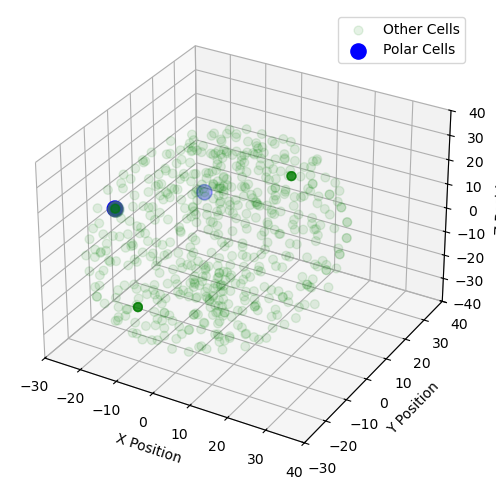

Processing timestep 2/100
Position for Border cell 360 is [-2.86076455e+01  6.64228823e-04  9.99824164e-02]
Position for Border cell 361 is [-28.6621393    0.06060311   0.06494017]
Position for Border cell 362 is [-2.86070299e+01 -1.06688424e-01  1.07393557e-02]
Position for Border cell 363 is [-28.55571697   0.07070654  -0.02921395]
Position for Border cell 364 is [-2.86796135e+01 -5.34676497e-03 -5.37665447e-02]
Position for Border cell 365 is [-2.85993920e+01  8.14692240e-03 -9.34779135e-02]
[-2.87617014e+01 -1.63162431e-02 -1.88978522e-02]
Polar cell 366 position: [-2.87617014e+01 -1.63162431e-02 -1.88978522e-02]
Border centroid: [-2.83586667e+01  9.88083578e-04 -5.06641519e-03]
Distance to center: 0.40364311088610394
Confinement force applied: [100.74620724   4.32554578   3.45743091]
F_total for 366th cell: [94.188907   -2.30347104 -3.03768026]
[-1.43090360e+01  1.76798139e+01 -6.63721612e-05]
Polar cell 367 position: [-1.43090360e+01  1.76798139e+01 -6.63721612e-05]
Border centro

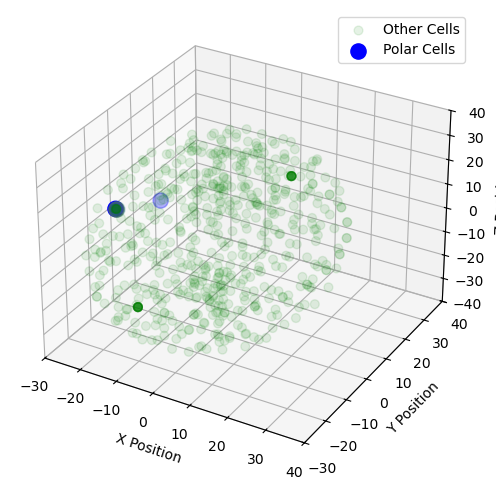

Processing timestep 3/100
Position for Border cell 360 is [-2.83506758e+01 -5.72687762e-03  9.28650648e-02]
Position for Border cell 361 is [-28.40225107   0.05828337   0.06068388]
Position for Border cell 362 is [-2.83467705e+01 -1.11947543e-01  6.16972323e-03]
Position for Border cell 363 is [-28.298083     0.06464529  -0.03747888]
Position for Border cell 364 is [-2.84182630e+01 -6.94274042e-03 -5.70084773e-02]
Position for Border cell 365 is [-2.83359567e+01  7.61700687e-03 -9.56298018e-02]
[-2.85733236e+01 -2.09231851e-02 -2.49732127e-02]
Polar cell 366 position: [-2.85733236e+01 -2.09231851e-02 -2.49732127e-02]
Border centroid: [-2.80943277e+01 -2.46121790e-03 -9.21724190e-03]
Distance to center: 0.479610408273274
Confinement force applied: [119.73648492   4.61501064   3.93858205]
F_total for 366th cell: [114.87014192  -0.35154284  -0.85707378]
[-2.13332376e+01  8.84059400e+00 -2.56638814e-03]
Polar cell 367 position: [-2.13332376e+01  8.84059400e+00 -2.56638814e-03]
Border centr

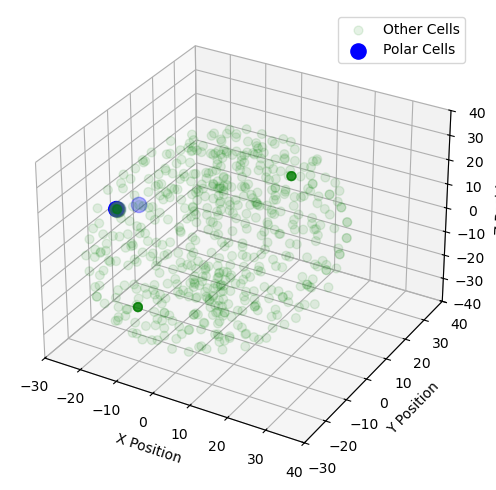

Processing timestep 4/100
Position for Border cell 360 is [-2.80889051e+01 -1.21092046e-02  8.65043483e-02]
Position for Border cell 361 is [-28.13818034   0.05495665   0.05716813]
Position for Border cell 362 is [-2.80820310e+01 -1.16096718e-01  2.40629581e-03]
Position for Border cell 363 is [-28.03665608   0.05964612  -0.04506686]
Position for Border cell 364 is [-2.81526962e+01 -8.66359436e-03 -5.94078501e-02]
Position for Border cell 365 is [-2.80674977e+01  7.49944887e-03 -9.69075097e-02]
[-2.83435833e+01 -2.16262708e-02 -2.66873602e-02]
Polar cell 366 position: [-2.83435833e+01 -2.16262708e-02 -2.66873602e-02]
Border centroid: [-2.78253284e+01 -5.13344114e-03 -1.28515695e-02]
Distance to center: 0.5187018898186205
Confinement force applied: [129.55125183   4.12280997   3.45861425]
F_total for 366th cell: [ 1.25923682e+02 -1.02240224e-01 -3.92339186e-01]
[-2.47140578e+01  4.41868846e+00 -5.89180008e-03]
Polar cell 367 position: [-2.47140578e+01  4.41868846e+00 -5.89180008e-03]
Bo

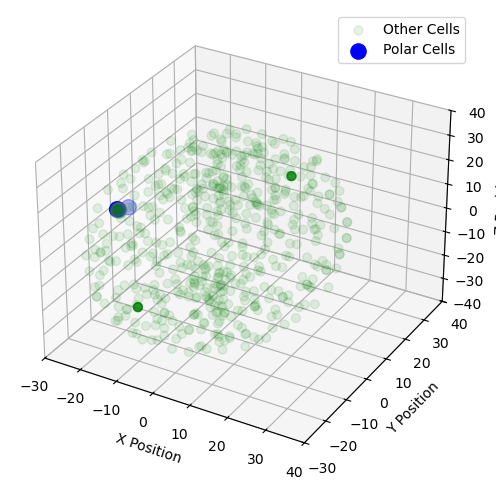

Processing timestep 5/100
Position for Border cell 360 is [-2.78224182e+01 -1.75643737e-02  8.06592687e-02]
Position for Border cell 361 is [-27.86936393   0.0533089    0.05420121]
Position for Border cell 362 is [-2.78129780e+01 -1.19900246e-01 -8.13395081e-04]
Position for Border cell 363 is [-27.77030901   0.05466208  -0.05233548]
Position for Border cell 364 is [-2.78830058e+01 -9.43704990e-03 -6.12141081e-02]
Position for Border cell 365 is [-2.77938953e+01  8.13004268e-03 -9.76069189e-02]
[-2.80917360e+01 -2.18307513e-02 -2.74720386e-02]
Polar cell 366 position: [-2.80917360e+01 -2.18307513e-02 -2.74720386e-02]
Border centroid: [-2.75516302e+01 -8.16160880e-03 -1.61861100e-02]
Distance to center: 0.5403965458534491
Confinement force applied: [135.01394144   3.41696944   2.8212211 ]
F_total for 366th cell: [ 1.31778626e+02 -1.12346259e-01 -4.79070317e-01]
[-2.62698956e+01  2.20691375e+00 -9.37165263e-03]
Polar cell 367 position: [-2.62698956e+01  2.20691375e+00 -9.37165263e-03]
Bo

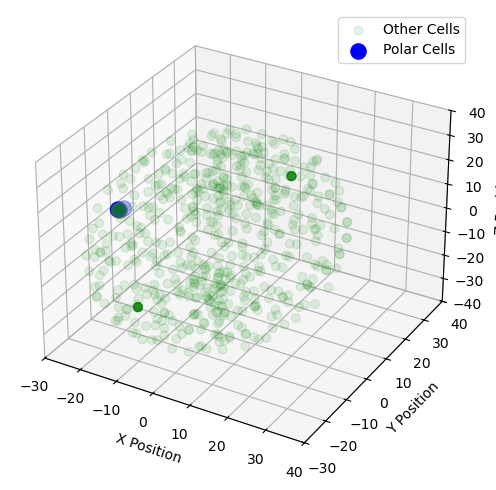

Processing timestep 6/100
Position for Border cell 360 is [-2.75515160e+01 -2.34667755e-02  7.51378423e-02]
Position for Border cell 361 is [-27.59684127   0.05088096   0.0515268 ]
Position for Border cell 362 is [-2.75383949e+01 -1.23950788e-01 -3.67633457e-03]
Position for Border cell 363 is [-27.49881927   0.04902229  -0.05944413]
Position for Border cell 364 is [-2.76079538e+01 -1.01446524e-02 -6.27447848e-02]
Position for Border cell 365 is [-2.75162562e+01  8.68931149e-03 -9.79160613e-02]
[-2.78281787e+01 -2.20554438e-02 -2.84301792e-02]
Polar cell 366 position: [-2.78281787e+01 -2.20554438e-02 -2.84301792e-02]
Border centroid: [-2.72731594e+01 -1.06692402e-02 -1.91617588e-02]
Distance to center: 0.5552135128213977
Confinement force applied: [138.74234563   2.84629456   2.31689643]
F_total for 366th cell: [135.77481439  -0.21204147  -0.66858147]
[-2.69107797e+01  1.09950131e+00 -1.27788147e-02]
Polar cell 367 position: [-2.69107797e+01  1.09950131e+00 -1.27788147e-02]
Border cent

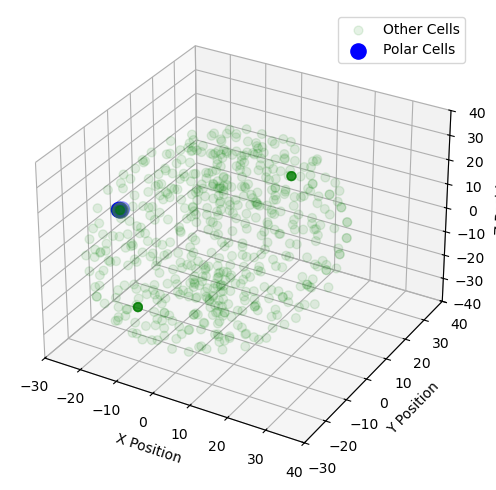

Processing timestep 7/100
Position for Border cell 360 is [-27.27527659  -0.02887734   0.06999188]
Position for Border cell 361 is [-27.31853978   0.0495421    0.04919449]
Position for Border cell 362 is [-2.72594504e+01 -1.27206652e-01 -6.12768353e-03]
Position for Border cell 363 is [-27.22318097   0.04313651  -0.06633073]
Position for Border cell 364 is [-2.73287630e+01 -1.04584101e-02 -6.39177247e-02]
Position for Border cell 365 is [-2.72337453e+01  9.84834351e-03 -9.77807856e-02]
[-2.75566291e+01 -2.24795267e-02 -2.97673422e-02]
Polar cell 366 position: [-2.75566291e+01 -2.24795267e-02 -2.97673422e-02]
Border centroid: [-2.69888241e+01 -1.24763464e-02 -2.09793869e-02]
Distance to center: 0.5679610892415542
Confinement force applied: [141.93875103   2.50057493   2.19679541]
F_total for 366th cell: [ 1.38680011e+02  3.03904210e-02 -5.15999697e-01]
[-2.70919941e+01  5.44442230e-01 -1.59701501e-02]
Polar cell 367 position: [-2.70919941e+01  5.44442230e-01 -1.59701501e-02]
Border cent

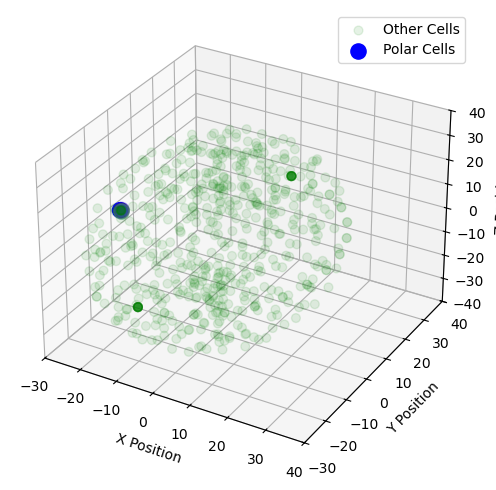

Processing timestep 8/100
Position for Border cell 360 is [-26.99392323  -0.03377853   0.06589552]
Position for Border cell 361 is [-27.03420364   0.04963374   0.0483446 ]
Position for Border cell 362 is [-2.69746474e+01 -1.30978013e-01 -8.13676454e-03]
Position for Border cell 363 is [-26.94171978   0.03872994  -0.07173187]
Position for Border cell 364 is [-2.70434336e+01 -1.02230640e-02 -6.40490356e-02]
Position for Border cell 365 is [-2.69450170e+01  1.17578492e-02 -9.61987783e-02]
[-2.72792691e+01 -2.24187459e-02 -3.07993416e-02]
Polar cell 366 position: [-2.72792691e+01 -2.24187459e-02 -3.07993416e-02]
Border centroid: [-2.67032820e+01 -1.76312891e-02 -2.62154958e-02]
Distance to center: 0.5760251840007348
Confinement force applied: [143.98426321   1.1967603    1.14586196]
F_total for 366th cell: [142.07403615  -0.84247536  -0.79454559]
[-2.70465460e+01  2.59763054e-01 -2.44045272e-02]
Polar cell 367 position: [-2.70465460e+01  2.59763054e-01 -2.44045272e-02]
Border centroid: [-2

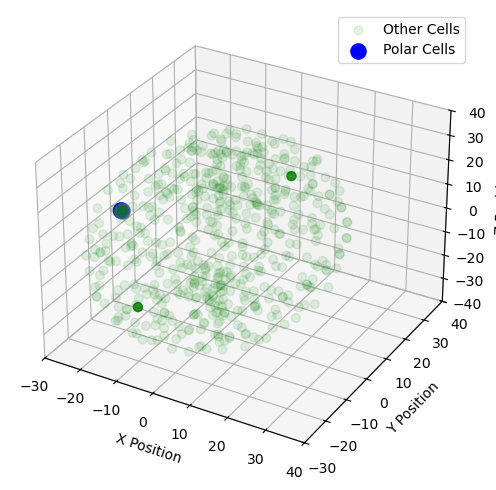

Processing timestep 9/100
Position for Border cell 360 is [-26.71112483  -0.04160122   0.05865597]
Position for Border cell 361 is [-26.74952902   0.04528444   0.04332183]
Position for Border cell 362 is [-2.66875587e+01 -1.36172395e-01 -1.20266886e-02]
Position for Border cell 363 is [-26.65957678   0.0296947   -0.08149128]
Position for Border cell 364 is [-2.67568327e+01 -1.36271876e-02 -6.75440348e-02]
Position for Border cell 365 is [-2.66550701e+01  1.06339248e-02 -9.82087717e-02]
[-2.69951210e+01 -2.41036966e-02 -3.23884328e-02]
Polar cell 366 position: [-2.69951210e+01 -2.41036966e-02 -3.23884328e-02]
Border centroid: [-2.64118825e+01 -2.24568354e-02 -3.08979761e-02]
Distance to center: 0.5832427448693849
Confinement force applied: [145.79712894   0.41168002   0.37258223]
F_total for 366th cell: [143.97723713  -1.25547374  -1.07091916]
[-26.8851465    0.11174871  -0.03470089]
Polar cell 367 position: [-26.8851465    0.11174871  -0.03470089]
Border centroid: [-2.64118825e+01 -2.2

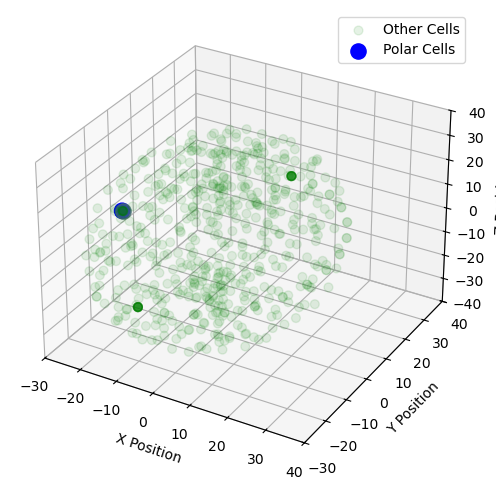

Processing timestep 10/100
Position for Border cell 360 is [-26.42290425  -0.0499867    0.05111142]
Position for Border cell 361 is [-26.46030231   0.0401776    0.03806509]
Position for Border cell 362 is [-2.63955401e+01 -1.41916895e-01 -1.63233078e-02]
Position for Border cell 363 is [-2.63669796e+01  2.55281058e-02 -8.65002359e-02]
Position for Border cell 364 is [-2.64654507e+01 -1.79137645e-02 -7.15626410e-02]
Position for Border cell 365 is [-2.63601180e+01  9.37063457e-03 -1.00178181e-01]
[-2.67071665e+01 -2.66146441e-02 -3.45302711e-02]
Polar cell 366 position: [-2.67071665e+01 -2.66146441e-02 -3.45302711e-02]
Border centroid: [-26.11558895  -0.02664163  -0.0353483 ]
Distance to center: 0.5915781370139744
Confinement force applied: [ 1.47881893e+02 -6.74635139e-03 -2.04490967e-01]
F_total for 366th cell: [146.72314619  -1.16475532  -1.30357459]
[-26.65630128   0.0379728   -0.03977873]
Polar cell 367 position: [-26.65630128   0.0379728   -0.03977873]
Border centroid: [-26.115588

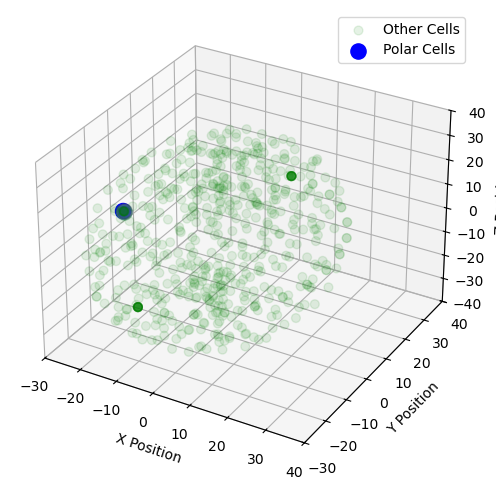

Processing timestep 11/100
Position for Border cell 360 is [-26.13041376  -0.05741019   0.04370738]
Position for Border cell 361 is [-26.16578501   0.03560191   0.03313513]
Position for Border cell 362 is [-2.60994442e+01 -1.48002192e-01 -2.05908361e-02]
Position for Border cell 363 is [-2.60700603e+01  2.23732297e-02 -9.11315258e-02]
Position for Border cell 364 is [-2.61684235e+01 -2.15245496e-02 -7.54404858e-02]
Position for Border cell 365 is [-2.60594070e+01  9.11199392e-03 -1.01769491e-01]
[-26.41372023  -0.02894415  -0.03713742]
Polar cell 366 position: [-26.41372023  -0.02894415  -0.03713742]
Border centroid: [-25.81379812  -0.03020715  -0.03970756]
Distance to center: 0.599928939406574
Confinement force applied: [149.96802628  -0.31572219  -0.64248206]
F_total for 366th cell: [148.85956567  -1.15240853  -1.48315501]
[-2.63910614e+01  1.36619865e-03 -4.23825849e-02]
Polar cell 367 position: [-2.63910614e+01  1.36619865e-03 -4.23825849e-02]
Border centroid: [-25.81379812  -0.030

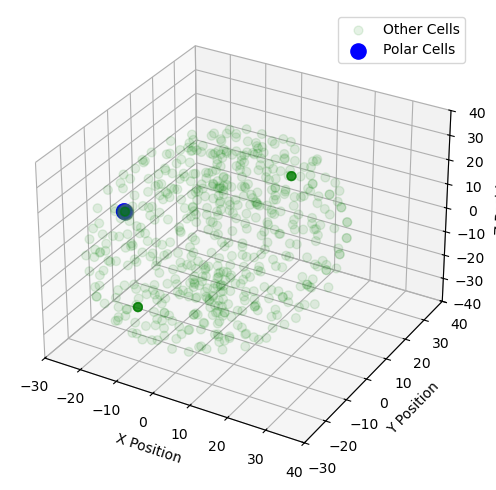

Processing timestep 12/100
Position for Border cell 360 is [-25.83281919  -0.06468535   0.03631693]
Position for Border cell 361 is [-25.86596472   0.03197942   0.02833966]
Position for Border cell 362 is [-2.57976614e+01 -1.53539236e-01 -2.48817236e-02]
Position for Border cell 363 is [-2.57669968e+01  2.00367453e-02 -9.56267576e-02]
Position for Border cell 364 is [-2.58661358e+01 -2.38551402e-02 -7.92422488e-02]
Position for Border cell 365 is [-2.57532108e+01  8.82066199e-03 -1.03151235e-01]
[-26.1160011   -0.03124897  -0.04010373]
Polar cell 366 position: [-26.1160011   -0.03124897  -0.04010373]
Border centroid: [-25.50595578  -0.03362075  -0.04410383]
Distance to center: 0.6100630361104479
Confinement force applied: [152.4988282   -0.59289684  -0.99994212]
F_total for 366th cell: [151.87436417  -1.73854605  -1.58580629]
[-2.61063092e+01 -1.77023783e-02 -4.45185293e-02]
Polar cell 367 position: [-2.61063092e+01 -1.77023783e-02 -4.45185293e-02]
Border centroid: [-25.50595578  -0.03

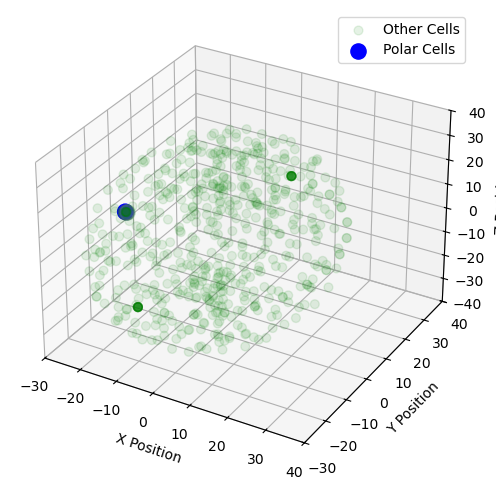

Processing timestep 13/100
Position for Border cell 360 is [-25.52915746  -0.07240508   0.02881855]
Position for Border cell 361 is [-2.55598332e+01  2.81379951e-02  2.35057394e-02]
Position for Border cell 362 is [-25.48938286  -0.15846058  -0.02926453]
Position for Border cell 363 is [-2.54580424e+01  1.75414334e-02 -1.00120363e-01]
Position for Border cell 364 is [-25.558881    -0.02613827  -0.08310511]
Position for Border cell 365 is [-2.54404378e+01  9.59997609e-03 -1.04457249e-01]
[-25.81225237  -0.03472606  -0.04327534]
Polar cell 366 position: [-25.81225237  -0.03472606  -0.04327534]
Border centroid: [-25.19218941  -0.03593131  -0.04791128]
Distance to center: 0.6200814594683187
Confinement force applied: [155.00323987  -0.30128641  -1.1588901 ]
F_total for 366th cell: [154.71935912  -0.70743614  -1.51083649]
[-25.80877348  -0.0277903   -0.04688723]
Polar cell 367 position: [-25.80877348  -0.0277903   -0.04688723]
Border centroid: [-25.19218941  -0.03593131  -0.04791128]
Distan

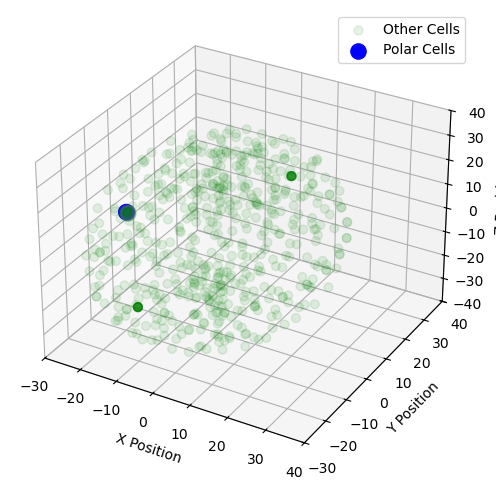

Processing timestep 14/100
Position for Border cell 360 is [-2.52198490e+01 -8.01271251e-02  2.11467750e-02]
Position for Border cell 361 is [-2.52445341e+01  2.92197001e-02  2.27363982e-02]
Position for Border cell 362 is [-25.17605972  -0.16255159  -0.03379438]
Position for Border cell 363 is [-2.51440299e+01  1.53463730e-02 -1.04684887e-01]
Position for Border cell 364 is [-25.24599277  -0.02850098  -0.08714104]
Position for Border cell 365 is [-2.51226710e+01  1.10257787e-02 -1.05730531e-01]
[-25.50281365  -0.03614094  -0.04629702]
Polar cell 366 position: [-25.50281365  -0.03614094  -0.04629702]
Border centroid: [-24.87329064  -0.03875296  -0.05248418]
Distance to center: 0.6295588303249131
Confinement force applied: [157.36825264  -0.65295323  -1.54666752]
F_total for 366th cell: [157.24471421  -0.55135472  -1.71864552]
[-25.50187969  -0.03413395  -0.04932092]
Polar cell 367 position: [-25.50187969  -0.03413395  -0.04932092]
Border centroid: [-24.87329064  -0.03875296  -0.0524841

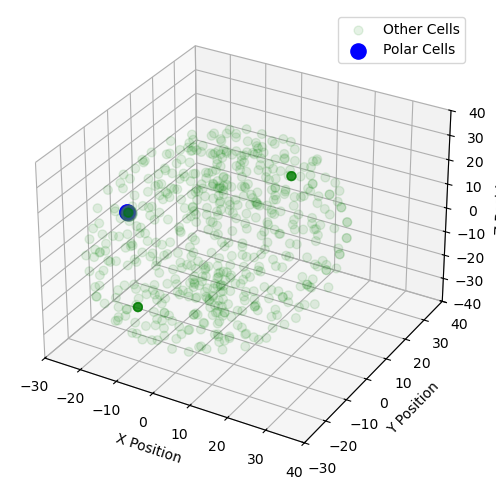

Processing timestep 15/100
Position for Border cell 360 is [-2.49059119e+01 -8.65167362e-02  1.33183628e-02]
Position for Border cell 361 is [-2.49270770e+01  2.63941847e-02  1.77976724e-02]
Position for Border cell 362 is [-24.85709859  -0.16718032  -0.03844949]
Position for Border cell 363 is [-2.48237273e+01  1.30896073e-02 -1.09299465e-01]
Position for Border cell 364 is [-24.9278409   -0.03070791  -0.09132769]
Position for Border cell 365 is [-2.47980882e+01  1.24034348e-02 -1.06944450e-01]
[-25.18832422  -0.03724365  -0.04973431]
Polar cell 366 position: [-25.18832422  -0.03724365  -0.04973431]
Border centroid: [-24.54852148  -0.04097319  -0.05708703]
Distance to center: 0.6398558537127098
Confinement force applied: [159.93818514  -0.93231244  -1.83803709]
F_total for 366th cell: [157.51682296  -3.06753824  -4.34951418]
[-25.18914484  -0.03811232  -0.05239218]
Polar cell 367 position: [-25.18914484  -0.03811232  -0.05239218]
Border centroid: [-24.54852148  -0.04097319  -0.0570870

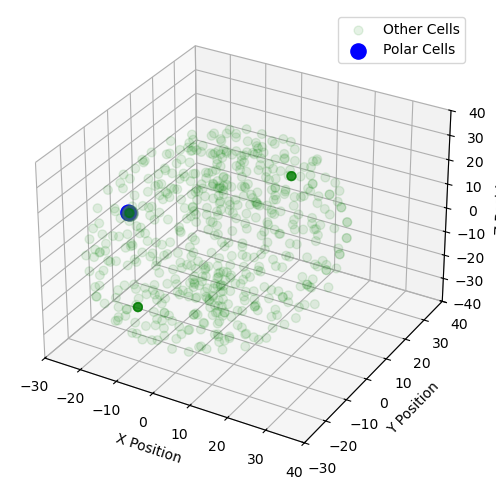

Processing timestep 16/100
Position for Border cell 360 is [-2.45844512e+01 -9.29234077e-02  5.36000611e-03]
Position for Border cell 361 is [-2.46045983e+01  2.48503814e-02  1.28226579e-02]
Position for Border cell 362 is [-24.53147678  -0.17171937  -0.04318262]
Position for Border cell 363 is [-2.44984243e+01  1.11897068e-02 -1.13895847e-01]
Position for Border cell 364 is [-24.60357661  -0.0326023   -0.09562302]
Position for Border cell 365 is [-2.44686017e+01  1.53658711e-02 -1.08003357e-01]
[-24.87329057  -0.04337872  -0.05843334]
Polar cell 366 position: [-24.87329057  -0.04337872  -0.05843334]
Border centroid: [-24.21722698  -0.04212163  -0.06099889]
Distance to center: 0.6560698128438004
Confinement force applied: [164.00339816   0.3142496   -0.64134002]
F_total for 366th cell: [163.93659062   0.79571665  -0.40999939]
[-24.87031323  -0.0413923   -0.05584084]
Polar cell 367 position: [-24.87031323  -0.0413923   -0.05584084]
Border centroid: [-24.21722698  -0.04212163  -0.0609988

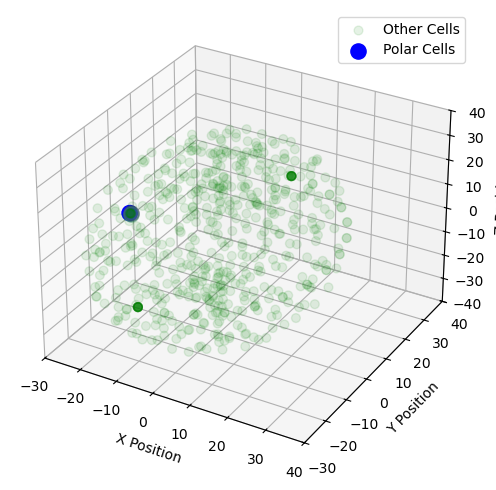

Processing timestep 17/100
Position for Border cell 360 is [-2.42581831e+01 -9.89872502e-02 -2.61855838e-03]
Position for Border cell 361 is [-2.42722788e+01  2.74827221e-02  1.20802269e-02]
Position for Border cell 362 is [-24.19940244  -0.17481531  -0.04799936]
Position for Border cell 363 is [-2.41666496e+01  9.63017848e-03 -1.18514267e-01]
Position for Border cell 364 is [-24.27439788  -0.03419166  -0.09999649]
Position for Border cell 365 is [-2.41324501e+01  1.81515551e-02 -1.08944889e-01]
[-24.54541739  -0.04178729  -0.05925333]
Polar cell 366 position: [-24.54541739  -0.04178729  -0.05925333]
Border centroid: [-23.88068302  -0.0438117   -0.06573943]
Distance to center: 0.664769096029622
Confinement force applied: [166.17109329  -0.50606475  -1.62140127]
F_total for 366th cell: [ 1.66853271e+02 -4.47426996e-02 -1.28258164e+00]
[-24.54451555  -0.04257562  -0.05919605]
Polar cell 367 position: [-24.54451555  -0.04257562  -0.05919605]
Border centroid: [-23.88068302  -0.0438117   -0

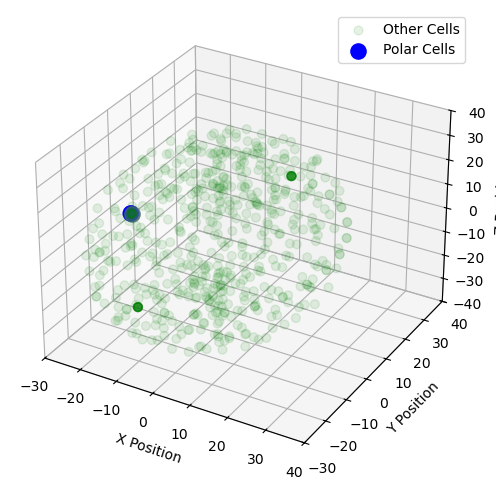

Processing timestep 18/100
Position for Border cell 360 is [-2.39265361e+01 -1.05832517e-01 -1.07737272e-02]
Position for Border cell 361 is [-2.39371888e+01  2.60412814e-02  7.32335945e-03]
Position for Border cell 362 is [-23.8622411   -0.17851332  -0.05310048]
Position for Border cell 363 is [-2.38292921e+01  9.30836135e-03 -1.23347035e-01]
Position for Border cell 364 is [-23.93886983  -0.0350025   -0.10467308]
Position for Border cell 365 is [-2.37899701e+01  2.11284904e-02 -1.09865594e-01]
[-24.21171085  -0.04187677  -0.0618185 ]
Polar cell 366 position: [-24.21171085  -0.04187677  -0.0618185 ]
Border centroid: [-23.53706054  -0.04521144  -0.0704474 ]
Distance to center: 0.6747137285684297
Confinement force applied: [168.65007807  -0.83360367  -2.15706672]
F_total for 366th cell: [166.74029364  -2.72983628  -4.24132913]
[-24.21294012  -0.04350294  -0.06301041]
Polar cell 367 position: [-24.21294012  -0.04350294  -0.06301041]
Border centroid: [-23.53706054  -0.04521144  -0.0704474

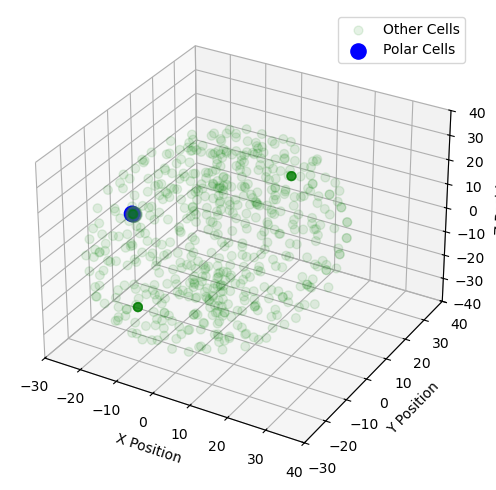

Processing timestep 19/100
Position for Border cell 360 is [-2.35881896e+01 -1.11797647e-01 -1.87620664e-02]
Position for Border cell 361 is [-2.35947642e+01  2.33382250e-02  1.65281531e-03]
Position for Border cell 362 is [-23.51736835  -0.18104345  -0.05732853]
Position for Border cell 363 is [-2.34847438e+01  9.35579289e-03 -1.28207296e-01]
Position for Border cell 364 is [-23.59621862  -0.03544716  -0.10898342]
Position for Border cell 365 is [-23.44107867   0.02432562  -0.11105592]
[-23.87823026  -0.04733645  -0.07030116]
Polar cell 366 position: [-23.87823026  -0.04733645  -0.07030116]
Border centroid: [-23.18727897  -0.04624736  -0.07541328]
Distance to center: 0.6909710655198537
Confinement force applied: [172.72532436   0.27225274  -1.27793837]
F_total for 366th cell: [173.15972288   0.90919401  -0.70802949]
[-23.87541557  -0.04471976  -0.06704371]
Polar cell 367 position: [-23.87541557  -0.04471976  -0.06704371]
Border centroid: [-23.18727897  -0.04624736  -0.07541328]
Distan

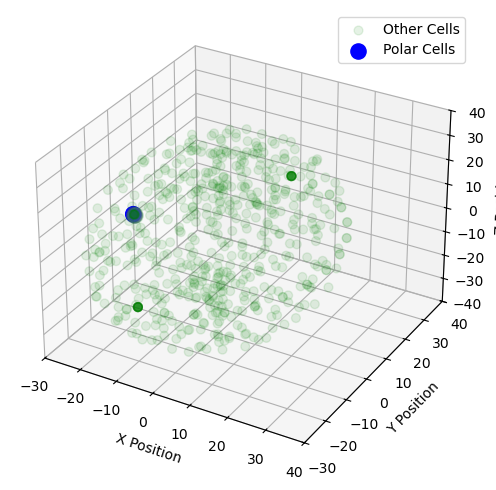

Processing timestep 20/100
Position for Border cell 360 is [-23.24354172  -0.11714238  -0.02725496]
Position for Border cell 361 is [-2.32467406e+01  2.14461873e-02 -4.39284716e-03]
Position for Border cell 362 is [-23.16597852  -0.18278939  -0.06171029]
Position for Border cell 363 is [-2.31340747e+01  8.93716939e-03 -1.33206025e-01]
Position for Border cell 364 is [-23.24759824  -0.03629493  -0.11380486]
Position for Border cell 365 is [-23.08574      0.0283592   -0.11211069]
[-23.53191082  -0.04551806  -0.07171721]
Polar cell 366 position: [-23.53191082  -0.04551806  -0.07171721]
Border centroid: [-22.83094773  -0.04698206  -0.08046377]
Distance to center: 0.7010191824303053
Confinement force applied: [175.22827262  -0.36597456  -2.1864826 ]
F_total for 366th cell: [175.63536064   0.21534962  -1.53199708]
[-23.53144614  -0.04643745  -0.07136972]
Polar cell 367 position: [-23.53144614  -0.04643745  -0.07136972]
Border centroid: [-22.83094773  -0.04698206  -0.08046377]
Distance to cen

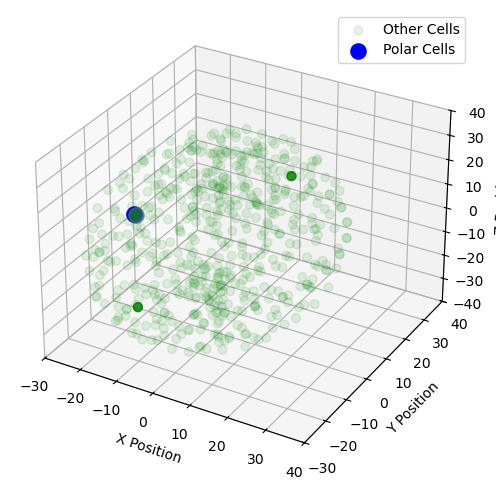

Processing timestep 21/100
Position for Border cell 360 is [-22.89211078  -0.12305882  -0.03595737]
Position for Border cell 361 is [-2.28921208e+01  2.01251049e-02 -1.04230364e-02]
Position for Border cell 362 is [-22.80968626  -0.18443278  -0.06625105]
Position for Border cell 363 is [-2.27761480e+01  9.20526117e-03 -1.38245518e-01]
Position for Border cell 364 is [-22.89289515  -0.0369075   -0.11884714]
Position for Border cell 365 is [-22.72272546   0.03317636  -0.1130585 ]
[-23.1806401   -0.04508736  -0.07478121]
Polar cell 366 position: [-23.1806401   -0.04508736  -0.07478121]
Border centroid: [-22.4670048   -0.04654218  -0.08486435]
Distance to center: 0.7137080143087963
Confinement force applied: [178.39632663  -0.36368054  -2.52060878]
F_total for 366th cell: [176.59878174  -1.95664872  -4.26766106]
[-23.18124467  -0.04613795  -0.07587668]
Polar cell 367 position: [-23.18124467  -0.04613795  -0.07587668]
Border centroid: [-22.4670048   -0.04654218  -0.08486435]
Distance to cen

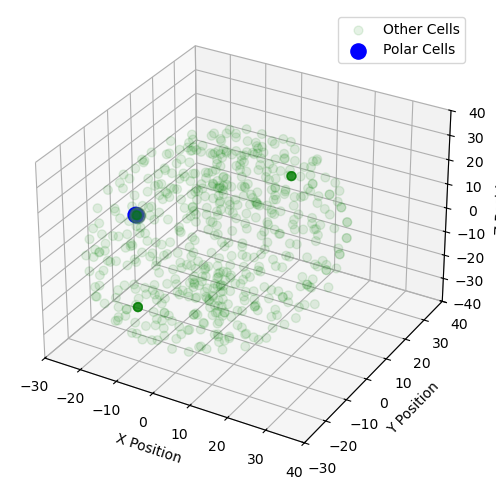

Processing timestep 22/100
Position for Border cell 360 is [-22.52958121  -0.12388033  -0.040764  ]
Position for Border cell 361 is [-2.25310735e+01  1.93668136e-02 -1.64595490e-02]
Position for Border cell 362 is [-22.44569255  -0.18608936  -0.0708627 ]
Position for Border cell 363 is [-2.24113834e+01  9.82496283e-03 -1.43245974e-01]
Position for Border cell 364 is [-22.53071275  -0.0368005   -0.12402552]
Position for Border cell 365 is [-22.35358533   0.03832531  -0.11382836]
[-22.82744253  -0.04900066  -0.08331653]
Polar cell 366 position: [-22.82744253  -0.04900066  -0.08331653]
Border centroid: [-22.09592673  -0.04553387  -0.08918556]
Distance to center: 0.7315475654646952
Confinement force applied: [182.86645237   0.86663847  -1.46715788]
F_total for 366th cell: [183.40248647   1.52881045  -0.5351425 ]
[-22.82325515  -0.04627718  -0.08009074]
Polar cell 367 position: [-22.82325515  -0.04627718  -0.08009074]
Border centroid: [-22.09592673  -0.04553387  -0.08918556]
Distance to cen

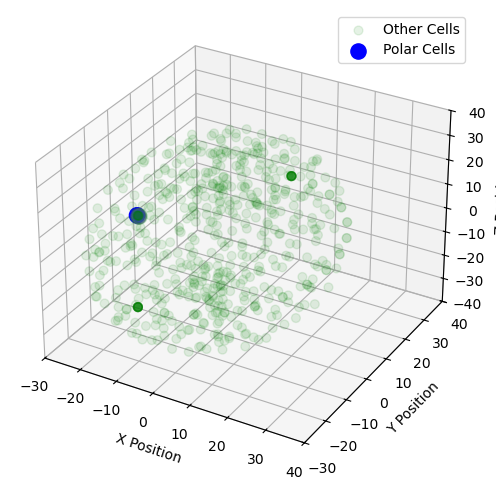

Processing timestep 23/100
Position for Border cell 360 is [-22.16413866  -0.12906249  -0.04952785]
Position for Border cell 361 is [-2.21590477e+01  2.31816879e-02 -1.82939662e-02]
Position for Border cell 362 is [-22.07461561  -0.18702447  -0.07544955]
Position for Border cell 363 is [-2.20393434e+01  1.13233710e-02 -1.48169011e-01]
Position for Border cell 364 is [-22.16167429  -0.03611464  -0.12925817]
Position for Border cell 365 is [-21.97674076   0.04449335  -0.11441484]
[-22.46063756  -0.04594304  -0.08438682]
Polar cell 366 position: [-22.46063756  -0.04594304  -0.08438682]
Border centroid: [-21.71686697  -0.04321715  -0.09283388]
Distance to center: 0.7438235522844153
Confinement force applied: [185.93014892   0.68142456  -2.111623  ]
F_total for 366th cell: [186.72689082   1.67978057  -1.06262112]
[-22.45961137  -0.04508772  -0.08414938]
Polar cell 367 position: [-22.45961137  -0.04508772  -0.08414938]
Border centroid: [-21.71686697  -0.04321715  -0.09283388]
Distance to cen

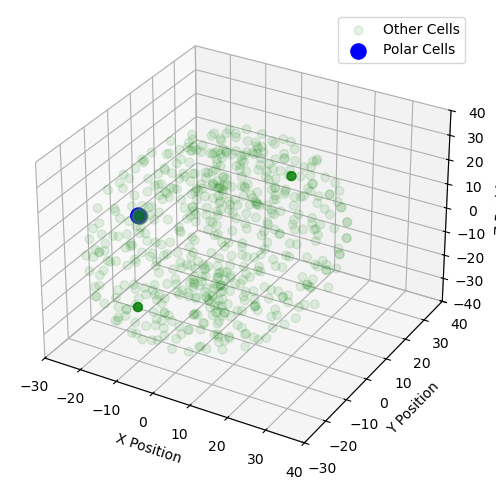

Processing timestep 24/100
Position for Border cell 360 is [-21.78320205  -0.1248832   -0.05023517]
Position for Border cell 361 is [-21.78386358   0.02343467  -0.02423337]
Position for Border cell 362 is [-21.69578037  -0.18798696  -0.08003238]
Position for Border cell 363 is [-2.16599879e+01  1.34287868e-02 -1.53058718e-01]
Position for Border cell 364 is [-21.78637713  -0.0347767   -0.13459009]
Position for Border cell 365 is [-21.59199074   0.05148048  -0.11485353]
[-22.08718378  -0.04258347  -0.08651206]
Polar cell 366 position: [-22.08718378  -0.04258347  -0.08651206]
Border centroid: [-21.33203291  -0.04165251  -0.09781277]
Distance to center: 0.7552359945094853
Confinement force applied: [188.77521861   0.23272472  -2.82499055]
F_total for 366th cell: [187.30144437  -1.44828256  -4.19923342]
[-22.0875155   -0.04299776  -0.08775137]
Polar cell 367 position: [-22.0875155   -0.04299776  -0.08775137]
Border centroid: [-21.33203291  -0.04165251  -0.09781277]
Distance to center: 0.75

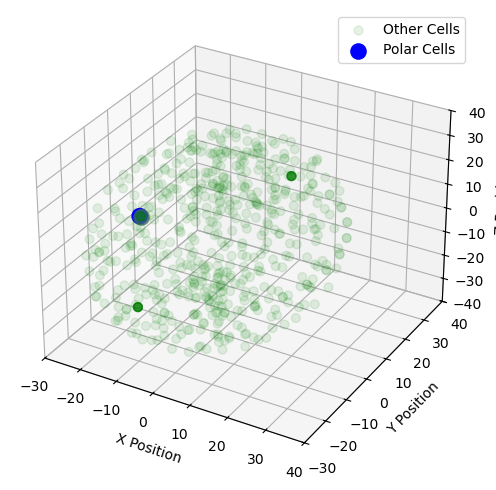

Processing timestep 25/100
Position for Border cell 360 is [-21.40400079  -0.12849225  -0.05896171]
Position for Border cell 361 is [-21.40098523   0.02442413  -0.03023576]
Position for Border cell 362 is [-21.31099055  -0.18784015  -0.08458337]
Position for Border cell 363 is [-2.12742651e+01  1.58886760e-02 -1.57913893e-01]
Position for Border cell 364 is [-21.40261144  -0.03351394  -0.14004613]
Position for Border cell 365 is [-21.19934433   0.05961845  -0.11513574]
[-21.71258089  -0.04548004  -0.09491052]
Polar cell 366 position: [-21.71258089  -0.04548004  -0.09491052]
Border centroid: [-20.93884762  -0.03784855  -0.1013937 ]
Distance to center: 0.7737980613402058
Confinement force applied: [193.42081782   1.90774878  -1.62068874]
F_total for 366th cell: [194.79682453   3.30224275  -0.37140855]
[-21.70930981  -0.04156536  -0.09183763]
Polar cell 367 position: [-21.70930981  -0.04156536  -0.09183763]
Border centroid: [-20.93884762  -0.03784855  -0.1013937 ]
Distance to center: 0.77

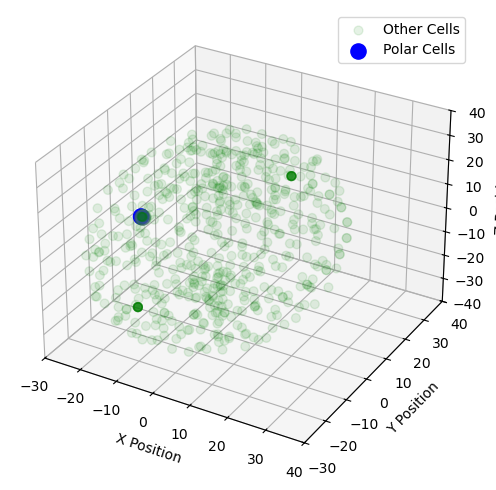

Processing timestep 26/100
Position for Border cell 360 is [-21.00978605  -0.12329589  -0.05966916]
Position for Border cell 361 is [-21.01092542   0.02633532  -0.03620777]
Position for Border cell 362 is [-20.91921553  -0.18671483  -0.0891343 ]
Position for Border cell 363 is [-2.08809222e+01  1.94411311e-02 -1.62682611e-01]
Position for Border cell 364 is [-21.01223253  -0.03148261  -0.1455627 ]
Position for Border cell 365 is [-20.80000406   0.06862557  -0.11510565]
[-21.32298724  -0.03887555  -0.09565334]
Polar cell 366 position: [-21.32298724  -0.03887555  -0.09565334]
Border centroid: [-20.53893713  -0.03470639  -0.10614092]
Distance to center: 0.7841313368666869
Confinement force applied: [196.00002996   1.04222366  -2.62172687]
F_total for 366th cell: [197.04209848   2.07226131  -1.36242559]
[-21.32278523  -0.03858608  -0.09549185]
Polar cell 367 position: [-21.32278523  -0.03858608  -0.09549185]
Border centroid: [-20.53893713  -0.03470639  -0.10614092]
Distance to center: 0.78

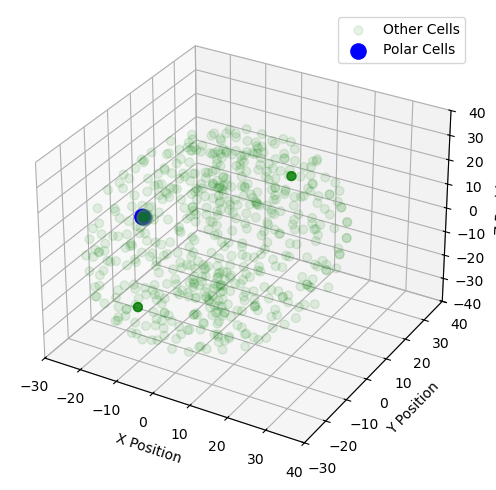

Processing timestep 27/100
Position for Border cell 360 is [-20.6150864   -0.12515217  -0.06827473]
Position for Border cell 361 is [-20.61396197   0.02847724  -0.04208152]
Position for Border cell 362 is [-20.51900713  -0.18497983  -0.09354492]
Position for Border cell 363 is [-20.47924788   0.02338899  -0.16721779]
Position for Border cell 364 is [-20.61450975  -0.02872224  -0.15105666]
Position for Border cell 365 is [-20.39180962   0.07874964  -0.11466989]
[-20.92890304  -0.03473103  -0.09837819]
Polar cell 366 position: [-20.92890304  -0.03473103  -0.09837819]
Border centroid: [-20.13023869  -0.03019399  -0.10923366]
Distance to center: 0.798751005795299
Confinement force applied: [199.65358875   1.13419039  -2.71369707]
F_total for 366th cell: [ 1.98411594e+02 -3.04398203e-02 -3.97085711e+00]
[-20.92941346  -0.03539742  -0.09971413]
Polar cell 367 position: [-20.92941346  -0.03539742  -0.09971413]
Border centroid: [-20.13023869  -0.03019399  -0.10923366]
Distance to center: 0.799

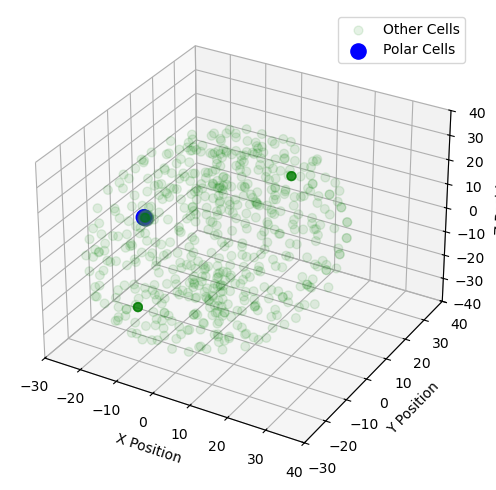

Processing timestep 28/100
Position for Border cell 360 is [-20.20524371  -0.11944541  -0.06860154]
Position for Border cell 361 is [-20.21036435   0.03070149  -0.04771113]
Position for Border cell 362 is [-20.11078381  -0.18244854  -0.09764079]
Position for Border cell 363 is [-20.06973083   0.02774436  -0.17137577]
Position for Border cell 364 is [-20.20952122  -0.02626653  -0.15636838]
Position for Border cell 365 is [-19.97578824   0.08855072  -0.11370436]
[-20.53207986  -0.03479191  -0.10631991]
Polar cell 366 position: [-20.53207986  -0.03479191  -0.10631991]
Border centroid: [-19.71438852  -0.02624393  -0.11262685]
Distance to center: 0.8177603302332566
Confinement force applied: [204.4103337    2.13686584  -1.57663967]
F_total for 366th cell: [205.73665676   3.14231273  -0.32700685]
[-20.52846689  -0.03140068  -0.1033842 ]
Polar cell 367 position: [-20.52846689  -0.03140068  -0.1033842 ]
Border centroid: [-19.71438852  -0.02624393  -0.11262685]
Distance to center: 0.81414716433

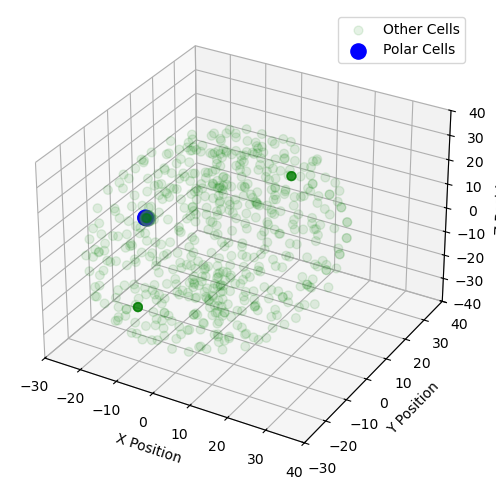

Processing timestep 29/100
Position for Border cell 360 is [-19.7952987   -0.12127875  -0.07655759]
Position for Border cell 361 is [-19.79433799   0.03787768  -0.04891285]
Position for Border cell 362 is [-19.69568393  -0.18098132  -0.10139383]
Position for Border cell 363 is [-19.65294109   0.03198014  -0.1751698 ]
Position for Border cell 364 is [-19.79639864  -0.02385961  -0.16147657]
Position for Border cell 365 is [-19.55167079   0.0987983   -0.11225047]
[-20.12060654  -0.02850729  -0.10697392]
Polar cell 366 position: [-20.12060654  -0.02850729  -0.10697392]
Border centroid: [-19.29129979  -0.02232779  -0.11582196]
Distance to center: 0.8293769700770236
Confinement force applied: [207.3141884    1.54478157  -2.21187582]
F_total for 366th cell: [208.50800398   2.95928777  -0.95290084]
[-20.12042542  -0.02796778  -0.10695363]
Polar cell 367 position: [-20.12042542  -0.02796778  -0.10695363]
Border centroid: [-19.29129979  -0.02232779  -0.11582196]
Distance to center: 0.82919223799

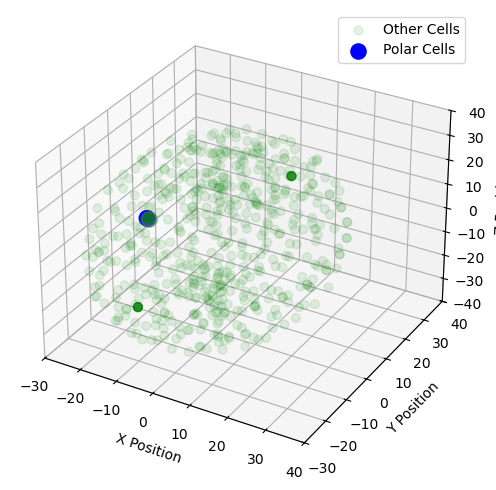

Processing timestep 30/100
Position for Border cell 360 is [-19.37425939  -0.11926241  -0.08045088]
Position for Border cell 361 is [-19.37492151   0.04114451  -0.05400439]
Position for Border cell 362 is [-19.27330779  -0.17926592  -0.10492124]
Position for Border cell 363 is [-19.2286416    0.03658867  -0.17870262]
Position for Border cell 364 is [-19.37613447  -0.02229889  -0.16647073]
Position for Border cell 365 is [-19.12053399   0.10912731  -0.11038189]
[-19.70359053  -0.02258871  -0.10887972]
Polar cell 366 position: [-19.70359053  -0.02258871  -0.10887972]
Border centroid: [-18.86128535  -0.01920386  -0.11938902]
Distance to center: 0.8423775401001048
Confinement force applied: [210.56379625   0.84616302  -2.62716898]
F_total for 366th cell: [209.36521953  -0.44378863  -3.88200485]
[-19.70552879  -0.02409148  -0.11036827]
Polar cell 367 position: [-19.70552879  -0.02409148  -0.11036827]
Border centroid: [-18.86128535  -0.01920386  -0.11938902]
Distance to center: 0.84430577235

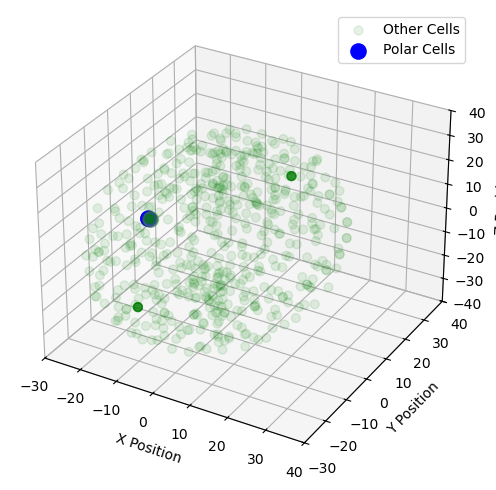

Processing timestep 31/100
Position for Border cell 360 is [-18.94941402  -0.12164848  -0.08797371]
Position for Border cell 361 is [-18.94698959   0.04311074  -0.05892361]
Position for Border cell 362 is [-18.84366187  -0.17772852  -0.10816971]
Position for Border cell 363 is [-18.79648429   0.04141293  -0.1819    ]
Position for Border cell 364 is [-18.94944027  -0.02003499  -0.17132895]
Position for Border cell 365 is [-18.68172209   0.11966517  -0.10803815]
[-19.28486009  -0.02347629  -0.11664373]
Polar cell 366 position: [-19.28486009  -0.02347629  -0.11664373]
Border centroid: [-1.84234648e+01 -1.69229581e-02 -1.21882262e-01]
Distance to center: 0.86143619457629
Confinement force applied: [215.33633519   1.63823734  -1.30955632]
F_total for 366th cell: [ 2.16756278e+02  2.68804057e+00 -5.73675033e-02]
[-19.28283791  -0.02081824  -0.11387296]
Polar cell 367 position: [-19.28283791  -0.02081824  -0.11387296]
Border centroid: [-1.84234648e+01 -1.69229581e-02 -1.21882262e-01]
Distance

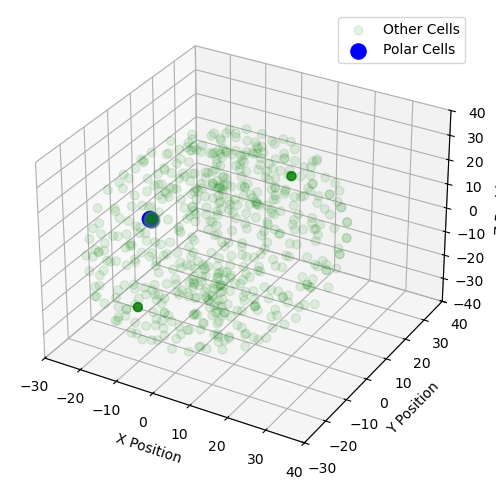

Processing timestep 32/100
Position for Border cell 360 is [-18.51351685  -0.12089752  -0.09133036]
Position for Border cell 361 is [-18.51247319   0.04376852  -0.06348404]
Position for Border cell 362 is [-18.40634446  -0.17749228  -0.11098673]
Position for Border cell 363 is [-18.35797481   0.04412203  -0.1845601 ]
Position for Border cell 364 is [-18.51464458  -0.01946847  -0.17593154]
Position for Border cell 365 is [-18.23583465   0.12842997  -0.1050008 ]
[-1.88513475e+01 -1.81002067e-02 -1.16758467e-01]
Polar cell 366 position: [-1.88513475e+01 -1.81002067e-02 -1.16758467e-01]
Border centroid: [-1.79792233e+01 -1.68189629e-02 -1.23803249e-01]
Distance to center: 0.8721536656534535
Confinement force applied: [218.01856845   0.32029258  -1.76109442]
F_total for 366th cell: [216.88325339  -0.89325259  -3.01913943]
[-1.88524037e+01 -1.78980422e-02 -1.16910808e-01]
Polar cell 367 position: [-1.88524037e+01 -1.78980422e-02 -1.16910808e-01]
Border centroid: [-1.79792233e+01 -1.68189629e

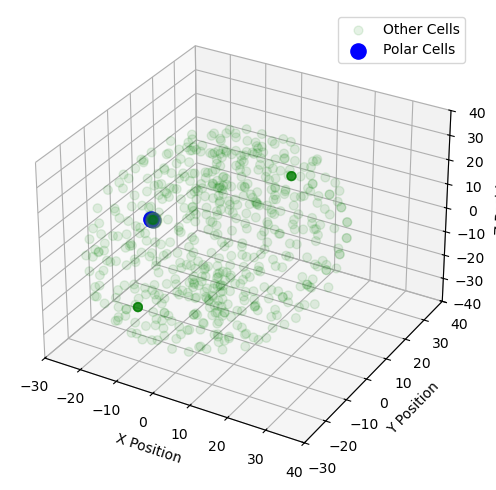

Processing timestep 33/100
Position for Border cell 360 is [-18.07139855  -0.12262535  -0.09415099]
Position for Border cell 361 is [-18.07126929   0.04278308  -0.06757982]
Position for Border cell 362 is [-17.96243921  -0.18054268  -0.11322052]
Position for Border cell 363 is [-17.91300083   0.04469007  -0.18659508]
Position for Border cell 364 is [-18.07378379  -0.02117437  -0.18010874]
Position for Border cell 365 is [-17.78344794   0.13595547  -0.10116434]
[-18.41758103  -0.01988671  -0.12279675]
Polar cell 366 position: [-18.41758103  -0.01988671  -0.12279675]
Border centroid: [-1.75300297e+01 -1.72778908e-02 -1.25087162e-01]
Distance to center: 0.8875580834479654
Confinement force applied: [221.8753236    0.65216852  -0.5725716 ]
F_total for 366th cell: [223.00281958   2.21274381   0.67721231]
[-1.84145263e+01 -1.65164113e-02 -1.19402353e-01]
Polar cell 367 position: [-1.84145263e+01 -1.65164113e-02 -1.19402353e-01]
Border centroid: [-1.75300297e+01 -1.72778908e-02 -1.25087162e-0

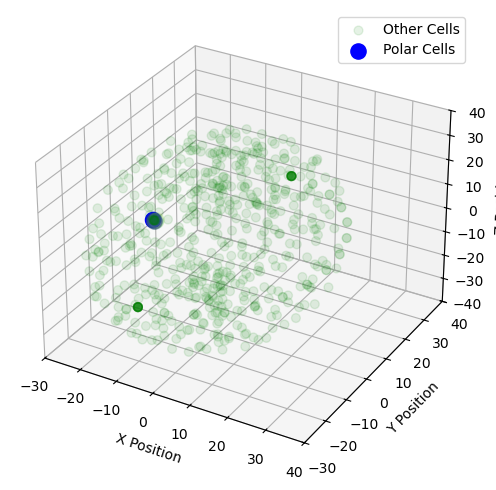

Processing timestep 34/100
Position for Border cell 360 is [-17.62353652  -0.12501138  -0.09636179]
Position for Border cell 361 is [-17.62494286   0.04114338  -0.07105114]
Position for Border cell 362 is [-17.51377823  -0.18339197  -0.11488083]
Position for Border cell 363 is [-17.46407667   0.04458492  -0.18796031]
Position for Border cell 364 is [-17.62772184  -0.0234145   -0.18375768]
Position for Border cell 365 is [-17.32612233   0.14242221  -0.09651123]
[-1.79715754e+01 -1.54612242e-02 -1.21442322e-01]
Polar cell 366 position: [-1.79715754e+01 -1.54612242e-02 -1.21442322e-01]
Border centroid: [-17.07667355  -0.01866657  -0.12679862]
Distance to center: 0.8949236162058487
Confinement force applied: [223.71296191  -0.8012907   -1.33899929]
F_total for 366th cell: [ 2.24746504e+02  6.80689059e-01 -7.93204137e-02]
[-1.79714471e+01 -1.54762210e-02 -1.21319241e-01]
Polar cell 367 position: [-1.79714471e+01 -1.54762210e-02 -1.21319241e-01]
Border centroid: [-17.07667355  -0.01866657  -

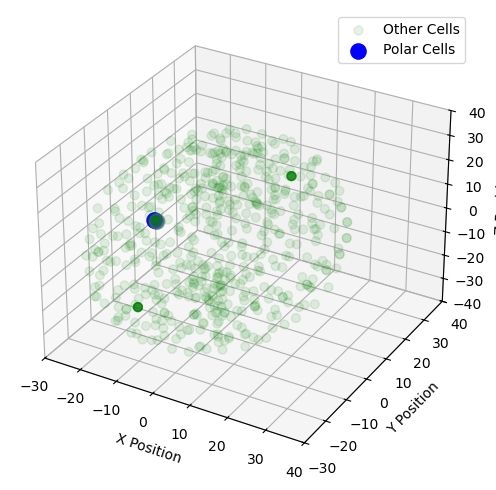

Processing timestep 35/100
Position for Border cell 360 is [-17.1748867   -0.13134428  -0.10214701]
Position for Border cell 361 is [-17.17440832   0.03898094  -0.07421478]
Position for Border cell 362 is [-17.06062175  -0.18670416  -0.11644436]
Position for Border cell 363 is [-17.00919031   0.04448824  -0.18914877]
Position for Border cell 364 is [-17.17729536  -0.02650064  -0.18720222]
Position for Border cell 365 is [-16.86363884   0.14908051  -0.09163456]
[-1.75220824e+01 -1.40998461e-02 -1.21600963e-01]
Polar cell 366 position: [-1.75220824e+01 -1.40998461e-02 -1.21600963e-01]
Border centroid: [-16.61733601  -0.01892846  -0.12829997]
Distance to center: 0.9047840636174849
Confinement force applied: [226.17409518  -1.20708641  -1.67465834]
F_total for 366th cell: [224.86041326  -2.68459733  -2.92971926]
[-1.75228580e+01 -1.62230180e-02 -1.23156497e-01]
Polar cell 367 position: [-1.75228580e+01 -1.62230180e-02 -1.23156497e-01]
Border centroid: [-16.61733601  -0.01892846  -0.1282999

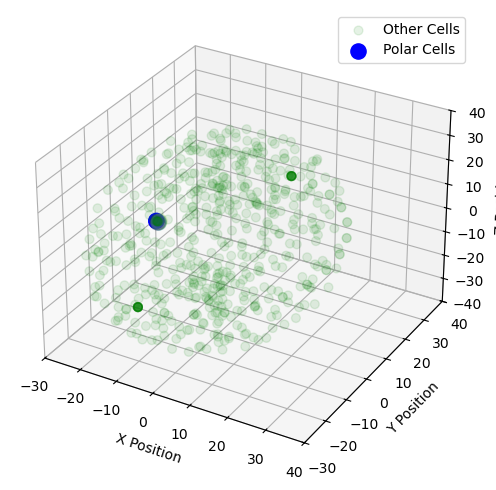

Processing timestep 36/100
Position for Border cell 360 is [-16.71794558  -0.13472648  -0.10454294]
Position for Border cell 361 is [-16.71782835   0.03722101  -0.07770113]
Position for Border cell 362 is [-16.60212935  -0.18960344  -0.11848444]
Position for Border cell 363 is [-16.54947708   0.04466996  -0.19078695]
Position for Border cell 364 is [-16.72208949  -0.02902668  -0.19109644]
Position for Border cell 365 is [-16.39454618   0.15789489  -0.0871879 ]
[-17.07236156  -0.01946904  -0.1274604 ]
Polar cell 366 position: [-17.07236156  -0.01946904  -0.1274604 ]
Border centroid: [-16.15209915  -0.01835896  -0.13047489]
Distance to center: 0.9202680163897142
Confinement force applied: [230.05310248   0.2775063   -0.75358188]
F_total for 366th cell: [231.22481622   1.28018548   0.49885317]
[-17.06998441  -0.01721223  -0.12482999]
Polar cell 367 position: [-17.06998441  -0.01721223  -0.12482999]
Border centroid: [-16.15209915  -0.01835896  -0.13047489]
Distance to center: 0.91790333570

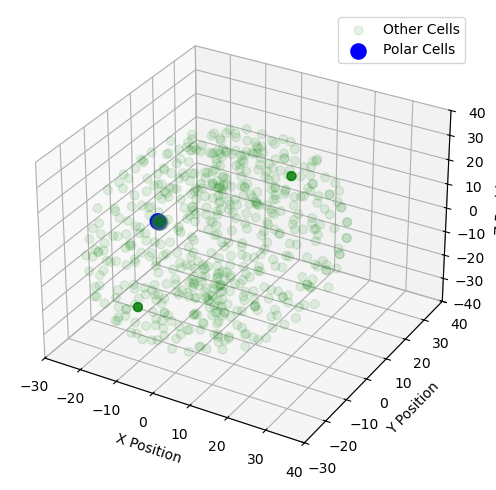

Processing timestep 37/100
Position for Border cell 360 is [-16.25586045  -0.13599866  -0.10758769]
Position for Border cell 361 is [-16.25672877   0.0360528   -0.08186322]
Position for Border cell 362 is [-16.13702015  -0.19094726  -0.12116473]
Position for Border cell 363 is [-16.08261802   0.0459767   -0.19313638]
Position for Border cell 364 is [-16.26062111  -0.03172598  -0.19584498]
Position for Border cell 365 is [-15.91974639   0.16648866  -0.08325235]
[-16.60991193  -0.01690867  -0.12646269]
Polar cell 366 position: [-16.60991193  -0.01690867  -0.12646269]
Border centroid: [-15.68148556  -0.01843459  -0.13390108]
Distance to center: 0.9284574166943478
Confinement force applied: [232.09409186  -0.38145864  -1.8594961 ]
F_total for 366th cell: [230.91880224  -1.61787076  -3.11866101]
[-16.6100823   -0.01662578  -0.12678856]
Polar cell 367 position: [-16.6100823   -0.01662578  -0.12678856]
Border centroid: [-15.68148556  -0.01843459  -0.13390108]
Distance to center: 0.92862573522

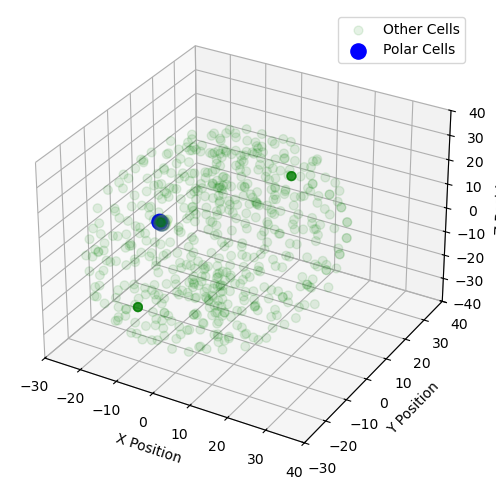

Processing timestep 38/100
Position for Border cell 360 is [-15.78972284  -0.14105632  -0.11508562]
Position for Border cell 361 is [-15.78891418   0.03452943  -0.08675538]
Position for Border cell 362 is [-15.66611725  -0.19259848  -0.12440334]
Position for Border cell 363 is [-15.61024977   0.04755514  -0.19597636]
Position for Border cell 364 is [-15.79409831  -0.03360075  -0.20140686]
Position for Border cell 365 is [-15.43981102   0.17456346  -0.07977892]
[-16.14807432  -0.02014441  -0.13270002]
Polar cell 366 position: [-16.14807432  -0.02014441  -0.13270002]
Border centroid: [-15.2053171   -0.01783758  -0.13704211]
Distance to center: 0.9427700412265674
Confinement force applied: [235.67680511   0.57667655  -1.08546509]
F_total for 366th cell: [2.36740078e+02 1.54302819e+00 1.65528070e-01]
[-16.14520294  -0.01759953  -0.12948804]
Polar cell 367 position: [-16.14520294  -0.01759953  -0.12948804]
Border centroid: [-15.2053171   -0.01783758  -0.13704211]
Distance to center: 0.93991

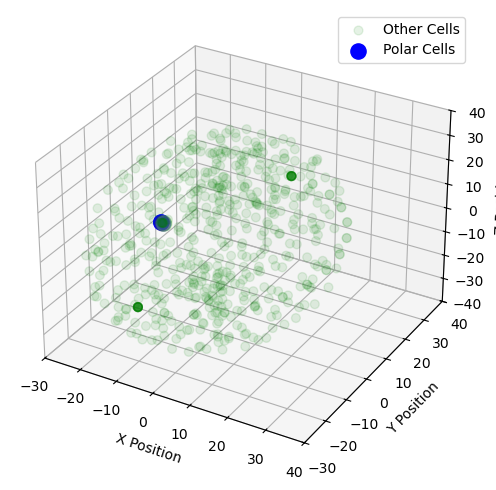

Processing timestep 39/100
Position for Border cell 360 is [-15.31604161  -0.14303383  -0.11929733]
Position for Border cell 361 is [-15.3158627    0.03367454  -0.09201665]
Position for Border cell 362 is [-15.19062163  -0.19404145  -0.12800879]
Position for Border cell 363 is [-15.13299732   0.0488914   -0.1989823 ]
Position for Border cell 364 is [-15.32206579  -0.03586285  -0.20749964]
Position for Border cell 365 is [-14.95431357   0.18334669  -0.07644794]
[-15.67459417  -0.01705835  -0.13236896]
Polar cell 366 position: [-15.67459417  -0.01705835  -0.13236896]
Border centroid: [-14.72325041  -0.01704299  -0.14041532]
Distance to center: 0.951377787028539
Confinement force applied: [ 2.37823440e+02  3.84176383e-03 -2.01148524e+00]
F_total for 366th cell: [239.00555291   1.32555817  -0.75234914]
[-15.67412302  -0.01711709  -0.1324391 ]
Polar cell 367 position: [-15.67412302  -0.01711709  -0.1324391 ]
Border centroid: [-14.72325041  -0.01704299  -0.14041532]
Distance to center: 0.950

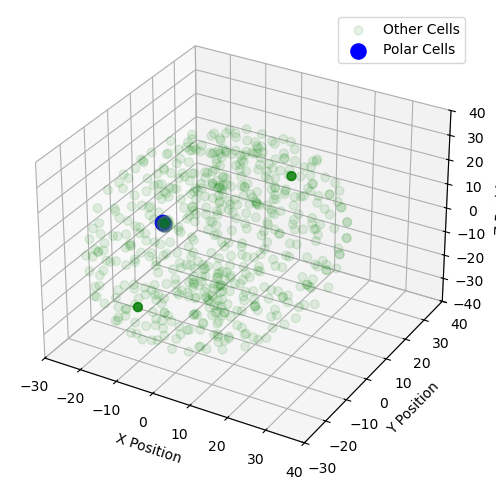

Processing timestep 40/100
Position for Border cell 360 is [-14.8361101   -0.14487909  -0.12386579]
Position for Border cell 361 is [-14.83746611   0.03286548  -0.09747426]
Position for Border cell 362 is [-14.70826769  -0.19538106  -0.13193143]
Position for Border cell 363 is [-14.649658     0.05084949  -0.20212485]
Position for Border cell 364 is [-14.84528367  -0.03806477  -0.21404406]
Position for Border cell 365 is [-14.46271688   0.19235202  -0.07305155]
[-1.51965831e+01 -1.44072386e-02 -1.33873659e-01]
Polar cell 366 position: [-1.51965831e+01 -1.44072386e-02 -1.33873659e-01]
Border centroid: [-14.23465748  -0.01658008  -0.1442911 ]
Distance to center: 0.9619844388524752
Confinement force applied: [240.46889508  -0.54318315  -2.60422596]
F_total for 366th cell: [239.21852933  -1.37223094  -3.858625  ]
[-15.19719687  -0.01690408  -0.13562618]
Polar cell 367 position: [-15.19719687  -0.01690408  -0.13562618]
Border centroid: [-14.23465748  -0.01658008  -0.1442911 ]
Distance to cen

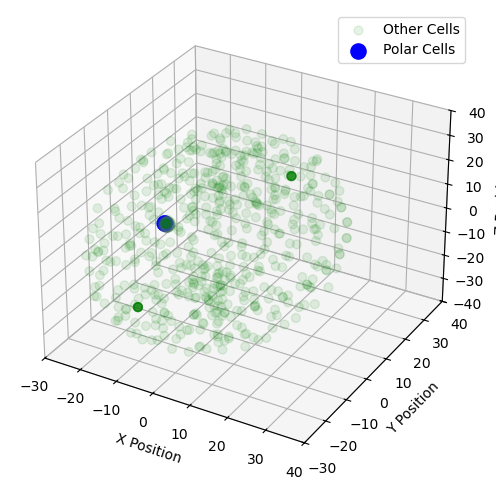

Processing timestep 41/100
Position for Border cell 360 is [-14.35285111  -0.14991529  -0.13214739]
Position for Border cell 361 is [-14.35276807   0.03222252  -0.10269194]
Position for Border cell 362 is [-14.21845144  -0.19576489  -0.13509869]
Position for Border cell 363 is [-14.15902349   0.05306151  -0.20433679]
Position for Border cell 364 is [-14.36059402  -0.03989272  -0.22079522]
Position for Border cell 365 is [-13.96425678   0.20080837  -0.07067659]
[-14.718146    -0.0171517   -0.14159091]
Polar cell 366 position: [-14.718146    -0.0171517   -0.14159091]
Border centroid: [-13.73895678  -0.01511647  -0.14709301]
Distance to center: 0.9792067932690786
Confinement force applied: [244.78480523   0.50878227  -1.37545623]
F_total for 366th cell: [ 2.45983891e+02  1.97563913e+00 -1.22697440e-01]
[-14.7151713   -0.01595139  -0.13916313]
Polar cell 367 position: [-14.7151713   -0.01595139  -0.13916313]
Border centroid: [-13.73895678  -0.01511647  -0.14709301]
Distance to center: 0.97

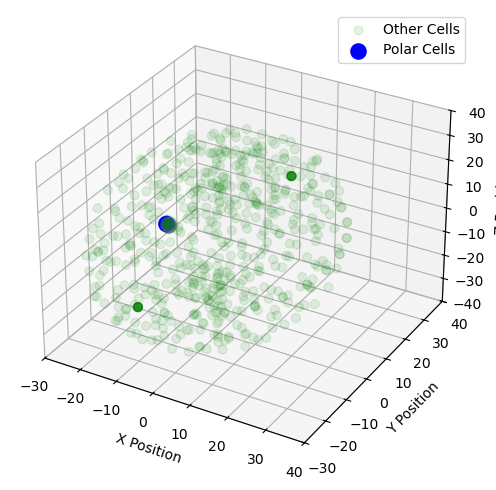

Processing timestep 42/100
Position for Border cell 360 is [-13.85952918  -0.14947922  -0.13568847]
Position for Border cell 361 is [-13.8619189    0.03115031  -0.10824589]
Position for Border cell 362 is [-13.722044    -0.19519137  -0.13757891]
Position for Border cell 363 is [-13.66221121   0.05527258  -0.20658148]
Position for Border cell 364 is [-13.86957038  -0.04125186  -0.22653013]
Position for Border cell 365 is [-13.45846702   0.20880075  -0.06793321]
[-1.42261782e+01 -1.32004222e-02 -1.41836304e-01]
Polar cell 366 position: [-1.42261782e+01 -1.32004222e-02 -1.41836304e-01]
Border centroid: [-13.23675988  -0.014352    -0.15029747]
Distance to center: 0.9894551841152499
Confinement force applied: [247.3420845   -0.28788053  -2.11518542]
F_total for 366th cell: [248.55500917   0.82689138  -0.85853105]
[-14.22566856  -0.01490686  -0.1423683 ]
Polar cell 367 position: [-14.22566856  -0.01490686  -0.1423683 ]
Border centroid: [-13.23675988  -0.014352    -0.15029747]
Distance to cen

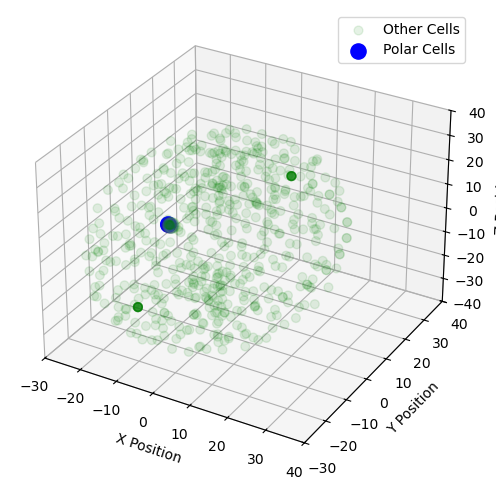

Processing timestep 43/100
Position for Border cell 360 is [-13.36351851  -0.15319689  -0.14288465]
Position for Border cell 361 is [-13.3636739    0.03019846  -0.11353449]
Position for Border cell 362 is [-13.2183445   -0.19524059  -0.13984688]
Position for Border cell 363 is [-13.15812423   0.05734489  -0.20847307]
Position for Border cell 364 is [-13.3717965   -0.04221562  -0.23228364]
Position for Border cell 365 is [-12.94510167   0.21699774  -0.06476212]
[-1.37290682e+01 -1.15466394e-02 -1.43553366e-01]
Polar cell 366 position: [-1.37290682e+01 -1.15466394e-02 -1.43553366e-01]
Border centroid: [-12.72546368  -0.01327228  -0.1524984 ]
Distance to center: 1.0036458681864961
Confinement force applied: [250.8886311   -0.43138906  -2.2361473 ]
F_total for 366th cell: [249.47641621  -1.92105583  -3.4887455 ]
[-13.73082515  -0.01465016  -0.14560049]
Polar cell 367 position: [-13.73082515  -0.01465016  -0.14560049]
Border centroid: [-12.72546368  -0.01327228  -0.1524984 ]
Distance to cen

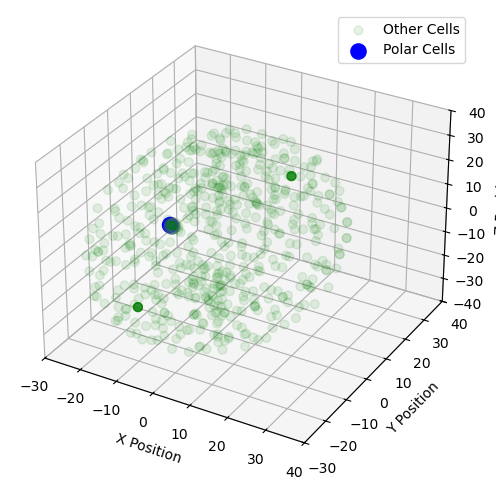

Processing timestep 44/100
Position for Border cell 360 is [-12.85486569  -0.15391094  -0.14611587]
Position for Border cell 361 is [-12.85713246   0.02888091  -0.11844257]
Position for Border cell 362 is [-12.70669197  -0.19574262  -0.14167031]
Position for Border cell 363 is [-12.64522054   0.05973136  -0.20984263]
Position for Border cell 364 is [-12.86615584  -0.04419828  -0.23783324]
Position for Border cell 365 is [-12.42271558   0.22560589  -0.06108578]
[-13.23011537  -0.01538875  -0.15053086]
Polar cell 366 position: [-13.23011537  -0.01538875  -0.15053086]
Border centroid: [-12.20659239  -0.0130448   -0.15472734]
Distance to center: 1.0235342613563798
Confinement force applied: [255.86824379   0.58595931  -1.04907025]
F_total for 366th cell: [2.57320114e+02 2.24541125e+00 2.03087497e-01]
[-13.22699602  -0.0132873   -0.14833192]
Polar cell 367 position: [-13.22699602  -0.0132873   -0.14833192]
Border centroid: [-12.20659239  -0.0130448   -0.15472734]
Distance to center: 1.02042

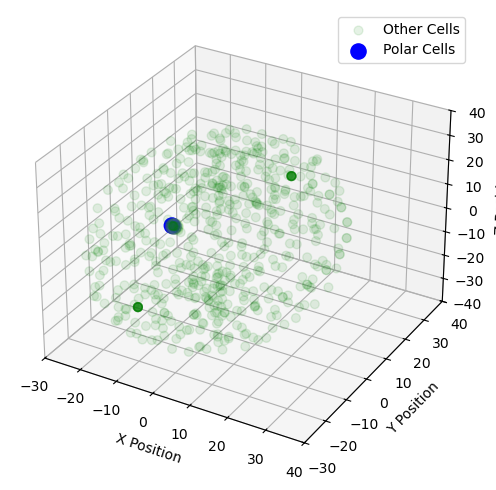

Processing timestep 45/100
Position for Border cell 360 is [-12.34211655  -0.15861737  -0.1524947 ]
Position for Border cell 361 is [-12.34218435   0.02765238  -0.12278219]
Position for Border cell 362 is [-12.18565078  -0.19573674  -0.14281999]
Position for Border cell 363 is [-12.12464734   0.06191688  -0.21049553]
Position for Border cell 364 is [-12.35189573  -0.04713432  -0.24297919]
Position for Border cell 365 is [-11.8930596    0.23365038  -0.05679245]
[-1.27154751e+01 -1.08979286e-02 -1.50124682e-01]
Polar cell 366 position: [-1.27154751e+01 -1.08979286e-02 -1.50124682e-01]
Border centroid: [-11.67895903  -0.01257186  -0.15564777]
Distance to center: 1.0365321762439201
Confinement force applied: [259.11652763  -0.41846188  -1.38070662]
F_total for 366th cell: [257.64821637  -2.01551818  -2.63743008]
[-1.27163867e+01 -1.22961282e-02 -1.50850981e-01]
Polar cell 367 position: [-1.27163867e+01 -1.22961282e-02 -1.50850981e-01]
Border centroid: [-11.67895903  -0.01257186  -0.1556477

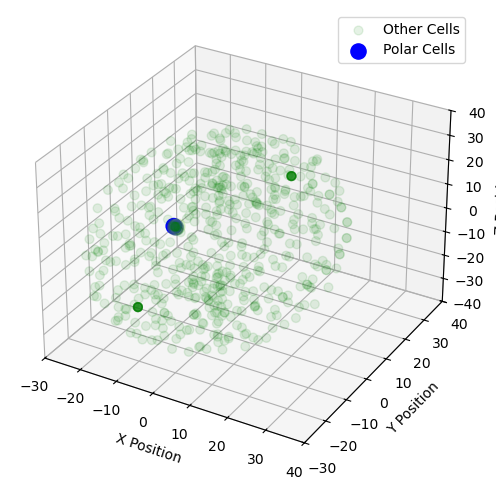

Processing timestep 46/100
Position for Border cell 360 is [-11.81778778  -0.16051588  -0.15456772]
Position for Border cell 361 is [-11.81900509   0.02583626  -0.12646293]
Position for Border cell 362 is [-11.65673334  -0.19644418  -0.14314236]
Position for Border cell 363 is [-11.59517408   0.06377025  -0.21036871]
Position for Border cell 364 is [-11.83001451  -0.0497712   -0.2475695 ]
Position for Border cell 365 is [-11.3550394    0.2416936   -0.05177542]
[-12.20017871  -0.01492896  -0.15539954]
Polar cell 366 position: [-12.20017871  -0.01492896  -0.15539954]
Border centroid: [-11.14280668  -0.01248604  -0.15577005]
Distance to center: 1.0573749124457097
Confinement force applied: [ 2.64330506e+02  6.10701457e-01 -9.26221060e-02]
F_total for 366th cell: [265.59127777   2.15535049   1.15796463]
[-1.21973103e+01 -1.15801807e-02 -1.52587708e-01]
Polar cell 367 position: [-1.21973103e+01 -1.15801807e-02 -1.52587708e-01]
Border centroid: [-11.14280668  -0.01248604  -0.15577005]
Distan

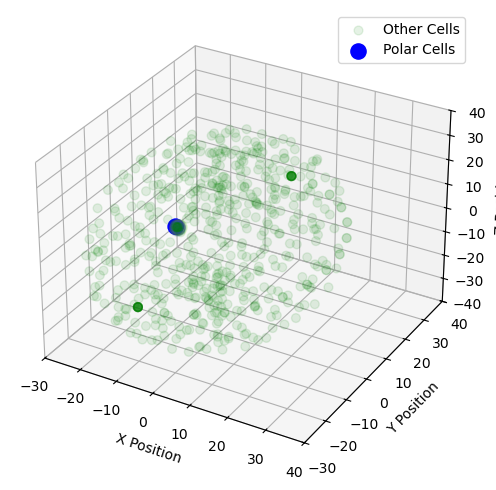

Processing timestep 47/100
Position for Border cell 360 is [-11.28494298  -0.16312286  -0.15583553]
Position for Border cell 361 is [-11.28665316   0.02349408  -0.12933893]
Position for Border cell 362 is [-11.11971673  -0.19764409  -0.14255275]
Position for Border cell 363 is [-11.05690529   0.06576925  -0.20932221]
Position for Border cell 364 is [-11.30014224  -0.05323529  -0.25149526]
Position for Border cell 365 is [-10.8084797    0.24982266  -0.04607561]
[-1.16689962e+01 -1.06182640e-02 -1.53083613e-01]
Polar cell 366 position: [-1.16689962e+01 -1.06182640e-02 -1.53083613e-01]
Border centroid: [-10.59880432  -0.01329737  -0.15580837]
Distance to center: 1.0701986549840479
Confinement force applied: [267.53545831  -0.66974482  -0.68115804]
F_total for 366th cell: [266.47614138  -2.00888876  -1.93844013]
[-11.66933406  -0.01201043  -0.15356074]
Polar cell 367 position: [-11.66933406  -0.01201043  -0.15356074]
Border centroid: [-10.59880432  -0.01329737  -0.15580837]
Distance to cen

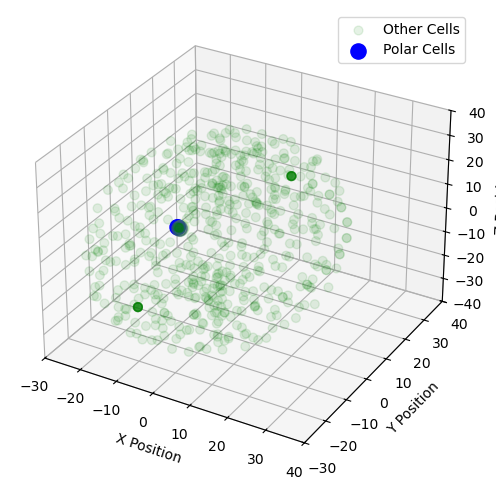

Processing timestep 48/100
Position for Border cell 360 is [-10.74712223  -0.1694366   -0.16003557]
Position for Border cell 361 is [-10.74715244   0.02130357  -0.13148666]
Position for Border cell 362 is [-10.57353442  -0.19917951  -0.14114024]
Position for Border cell 363 is [-10.50946538   0.06774389  -0.20746754]
Position for Border cell 364 is [-10.76231425  -0.05752129  -0.25478565]
Position for Border cell 365 is [-10.2532372    0.25730574  -0.03993458]
[-11.13604387  -0.01463604  -0.15696049]
Polar cell 366 position: [-11.13604387  -0.01463604  -0.15696049]
Border centroid: [-10.04606549  -0.01362526  -0.15469651]
Distance to center: 1.089981195426411
Confinement force applied: [2.72482094e+02 2.52683316e-01 5.65970818e-01]
F_total for 366th cell: [273.93161817   1.41051637   1.81823767]
[-11.13362001  -0.01255991  -0.15408441]
Polar cell 367 position: [-11.13362001  -0.01255991  -0.15408441]
Border centroid: [-10.04606549  -0.01362526  -0.15469651]
Distance to center: 1.087555

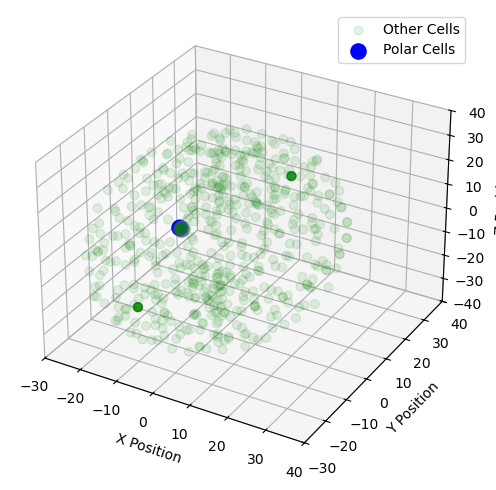

Processing timestep 49/100
Position for Border cell 360 is [-10.19830696  -0.17173994  -0.15999221]
Position for Border cell 361 is [-10.19940292   0.01864923  -0.13304463]
Position for Border cell 362 is [-10.01918578  -0.20059543  -0.13899566]
Position for Border cell 363 is [-9.95344244  0.07012526 -0.20494794]
Position for Border cell 364 is [-10.21536113  -0.06185742  -0.25753575]
Position for Border cell 365 is [-9.69069374  0.26366673 -0.03366285]
[-10.58818063  -0.01181501  -0.15332402]
Polar cell 366 position: [-10.58818063  -0.01181501  -0.15332402]
Border centroid: [-9.48444863 -0.01443991 -0.15327227]
Distance to center: 1.1037351288045003
Confinement force applied: [ 2.75920502e+02 -6.56195673e-01  1.29353106e-02]
F_total for 366th cell: [274.72867178  -2.03515369  -1.24476768]
[-10.58911758  -0.01251536  -0.15383403]
Polar cell 367 position: [-10.58911758  -0.01251536  -0.15383403]
Border centroid: [-9.48444863 -0.01443991 -0.15327227]
Distance to center: 1.10467077231834

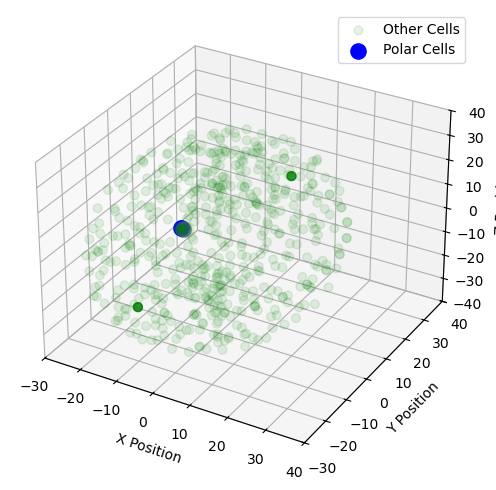

Processing timestep 50/100
Position for Border cell 360 is [-9.63927623 -0.17506735 -0.15953491]
Position for Border cell 361 is [-9.64233949  0.01594631 -0.13421452]
Position for Border cell 362 is [-9.45563521 -0.20195545 -0.13657857]
Position for Border cell 363 is [-9.38937608  0.07141671 -0.20204793]
Position for Border cell 364 is [-9.660164   -0.06679671 -0.25992393]
Position for Border cell 365 is [-9.11990077  0.26981704 -0.0273338 ]
[-10.03872329  -0.01588532  -0.15581355]
Polar cell 366 position: [-10.03872329  -0.01588532  -0.15581355]
Border centroid: [-8.91526947 -0.01699747 -0.15295043]
Distance to center: 1.1234580219913002
Confinement force applied: [ 2.80850956e+02 -2.78026656e-01  7.15749735e-01]
F_total for 366th cell: [282.02381915   1.13265124   1.96633558]
[-10.03579267  -0.01257906  -0.15301463]
Polar cell 367 position: [-10.03579267  -0.01257906  -0.15301463]
Border centroid: [-8.91526947 -0.01699747 -0.15295043]
Distance to center: 1.1205319166402457
Confineme

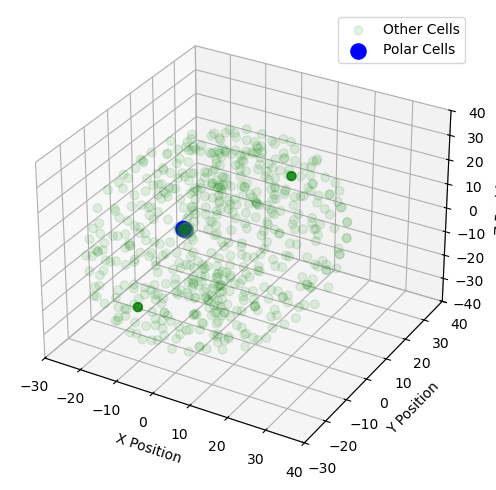

Processing timestep 51/100
Position for Border cell 360 is [-9.07516863 -0.18282244 -0.16340832]
Position for Border cell 361 is [-9.07711186  0.01116602 -0.13615393]
Position for Border cell 362 is [-8.88385824 -0.20488682 -0.13463956]
Position for Border cell 363 is [-8.81692595  0.0720617  -0.19921311]
Position for Border cell 364 is [-9.09732295 -0.07261457 -0.26306323]
Position for Border cell 365 is [-8.54122918  0.27511128 -0.02122441]
[-9.47467565 -0.01362001 -0.15188088]
Polar cell 366 position: [-9.47467565 -0.01362001 -0.15188088]
Border centroid: [-8.33803179 -0.01961426 -0.15183695]
Distance to center: 1.1366596711772132
Confinement force applied: [ 2.84148466e+02 -1.49849607e+00  1.09826902e-02]
F_total for 366th cell: [282.59701049  -2.63369133  -1.24734092]
[-9.47502672 -0.01423816 -0.15248256]
Polar cell 367 position: [-9.47502672 -0.01423816 -0.15248256]
Border centroid: [-8.33803179 -0.01961426 -0.15183695]
Distance to center: 1.1370078269222
Confinement force applie

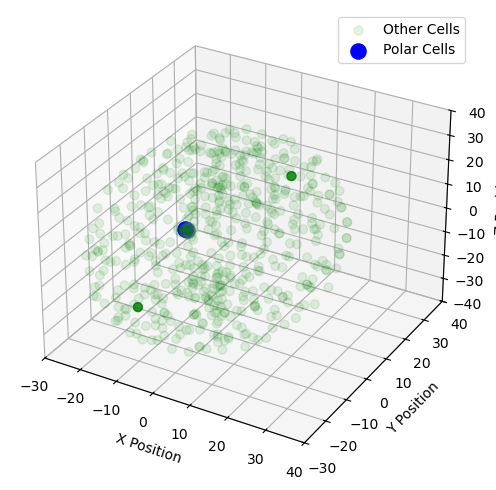

Processing timestep 52/100
Position for Border cell 360 is [-8.50038608 -0.18848608 -0.16347465]
Position for Border cell 361 is [-8.50494924e+00  6.87994545e-03 -1.37832331e-01]
Position for Border cell 362 is [-8.30452789 -0.20872502 -0.13234201]
Position for Border cell 363 is [-8.23664567  0.07249102 -0.19613232]
Position for Border cell 364 is [-8.52660987 -0.0794859  -0.26595985]
Position for Border cell 365 is [-7.95507198  0.27964046 -0.01528055]
[-8.90948163 -0.0188874  -0.15437556]
Polar cell 366 position: [-8.90948163 -0.0188874  -0.15437556]
Border centroid: [-7.75274924 -0.02372869 -0.15130284]
Distance to center: 1.156746600799372
Confinement force applied: [289.17059729  -1.21027032   0.76814792]
F_total for 366th cell: [2.90279764e+02 2.10136701e-01 2.01854601e+00]
[-8.90612956 -0.01573608 -0.15167581]
Polar cell 367 position: [-8.90612956 -0.01573608 -0.15167581]
Border centroid: [-7.75274924 -0.02372869 -0.15130284]
Distance to center: 1.1534080744223256
Confinement f

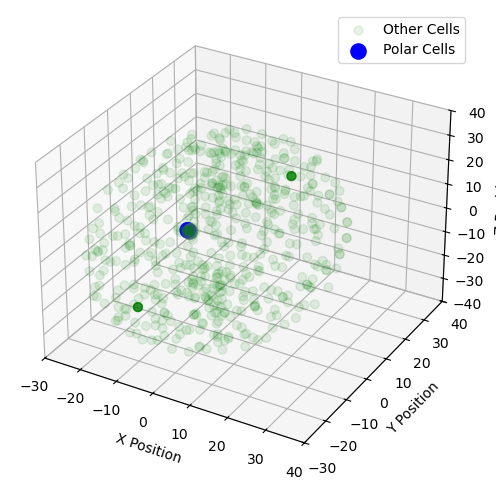

Processing timestep 53/100
Position for Border cell 360 is [-7.92139178 -0.19785946 -0.16690372]
Position for Border cell 361 is [-7.92428104e+00  5.91161513e-04 -1.39454341e-01]
Position for Border cell 362 is [-7.71673656 -0.21358267 -0.12981573]
Position for Border cell 363 is [-7.64695304  0.0720114  -0.19297911]
Position for Border cell 364 is [-7.94771803 -0.08674916 -0.26868394]
Position for Border cell 365 is [-7.359415   0.2832166 -0.0099802]
[-8.3289221  -0.01846712 -0.15033847]
Polar cell 366 position: [-8.3289221  -0.01846712 -0.15033847]
Border centroid: [-7.15868499 -0.02760559 -0.15092976]
Distance to center: 1.1702729417913231
Confinement force applied: [ 2.92546778e+02 -2.28451809e+00 -1.47816668e-01]
F_total for 366th cell: [291.10724904  -3.497428    -1.4051132 ]
[-8.32902326 -0.01978739 -0.15104731]
Polar cell 367 position: [-8.32902326 -0.01978739 -0.15104731]
Border centroid: [-7.15868499 -0.02760559 -0.15092976]
Distance to center: 1.170364386932381
Confinement f

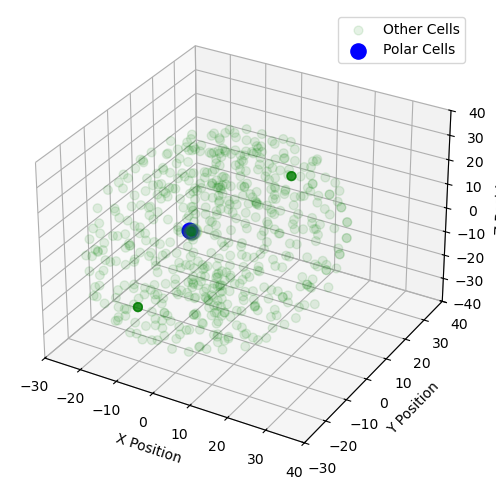

Processing timestep 54/100
Position for Border cell 360 is [-7.33041485 -0.20339174 -0.16698278]
Position for Border cell 361 is [-7.33499801e+00 -5.69944878e-03 -1.41555677e-01]
Position for Border cell 362 is [-7.11996215 -0.21804926 -0.12759814]
Position for Border cell 363 is [-7.0490987   0.07123849 -0.19036224]
Position for Border cell 364 is [-7.36017482 -0.09455542 -0.27173331]
Position for Border cell 365 is [-6.75746142  0.28482387 -0.00734643]
[-7.74670761 -0.02546198 -0.1531487 ]
Polar cell 366 position: [-7.74670761 -0.02546198 -0.1531487 ]
Border centroid: [-6.55705322 -0.03271163 -0.15176353]
Distance to center: 1.1896772837959217
Confinement force applied: [297.4010973   -1.81233581   0.34627732]
F_total for 366th cell: [298.82253736  -0.78849008   1.59788043]
[-7.74310881 -0.02400089 -0.15056499]
Polar cell 367 position: [-7.74310881 -0.02400089 -0.15056499]
Border centroid: [-6.55705322 -0.03271163 -0.15176353]
Distance to center: 1.1860881871139377
Confinement force 

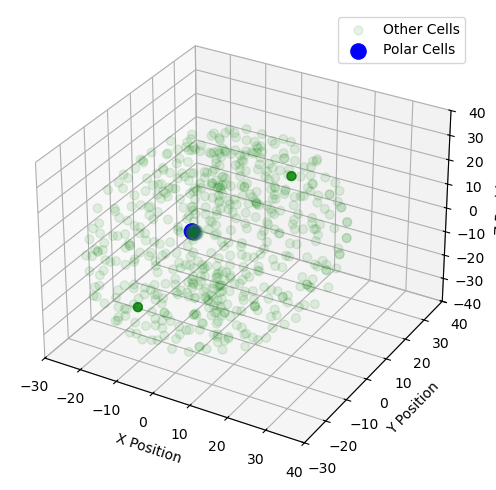

Processing timestep 55/100
Position for Border cell 360 is [-6.73442571 -0.21452174 -0.17132105]
Position for Border cell 361 is [-6.73748938 -0.01231137 -0.14442115]
Position for Border cell 362 is [-6.51467953 -0.22305704 -0.12592153]
Position for Border cell 363 is [-6.44364418  0.07071334 -0.18824497]
Position for Border cell 364 is [-6.76444919 -0.10364659 -0.27556656]
Position for Border cell 365 is [-6.14763131e+00  2.86553639e-01 -5.10593151e-03]
[-7.14906253 -0.02703896 -0.14995294]
Polar cell 366 position: [-7.14906253 -0.02703896 -0.14995294]
Border centroid: [-5.94677249 -0.03790491 -0.15225752]
Distance to center: 1.2023413468135409
Confinement force applied: [300.5600099   -2.71637544  -0.57612141]
F_total for 366th cell: [299.24257976  -3.92298972  -1.83362884]
[-7.14934178 -0.02811174 -0.15078283]
Polar cell 367 position: [-7.14934178 -0.02811174 -0.15078283]
Border centroid: [-5.94677249 -0.03790491 -0.15225752]
Distance to center: 1.2026100607168875
Confinement force 

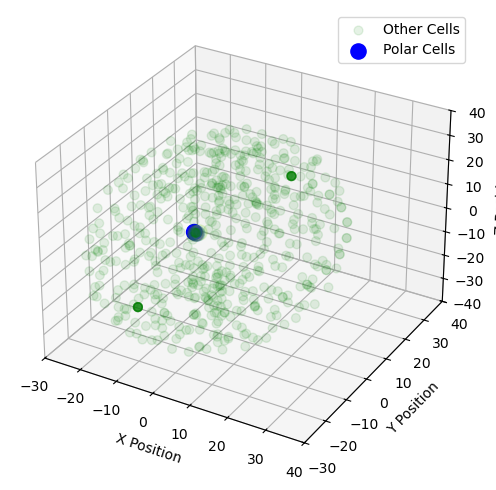

Processing timestep 56/100
Position for Border cell 360 is [-6.1270564  -0.22271551 -0.17252836]
Position for Border cell 361 is [-6.13199189 -0.02011679 -0.14776355]
Position for Border cell 362 is [-5.90162267 -0.22836238 -0.12431773]
Position for Border cell 363 is [-5.83001368  0.07018849 -0.18621504]
Position for Border cell 364 is [-6.16045842 -0.11298889 -0.2798788 ]
Position for Border cell 365 is [-5.52949190e+00  2.86565607e-01 -2.84163111e-03]
[-6.55057737 -0.03488494 -0.15362019]
Polar cell 366 position: [-6.55057737 -0.03488494 -0.15362019]
Border centroid: [-5.32852146 -0.04409123 -0.15312511]
Distance to center: 1.2220906894427477
Confinement force applied: [ 3.05501478e+02 -2.30147879e+00  1.23767272e-01]
F_total for 366th cell: [306.41284936  -1.08501005   1.37534451]
[-6.54776717 -0.03206966 -0.15115586]
Polar cell 367 position: [-6.54776717 -0.03206966 -0.15115586]
Border centroid: [-5.32852146 -0.04409123 -0.15312511]
Distance to center: 1.2193065653128738
Confineme

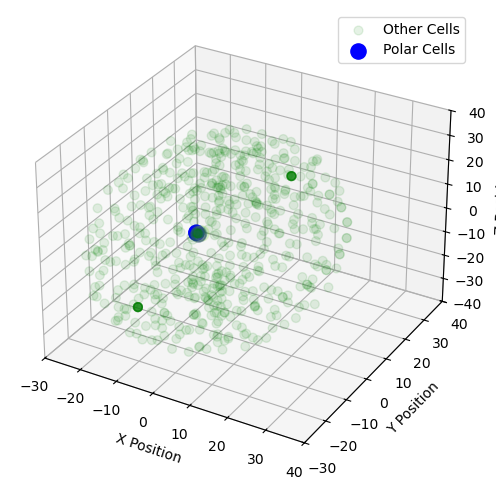

Processing timestep 57/100
Position for Border cell 360 is [-5.51450158 -0.2350893  -0.17704928]
Position for Border cell 361 is [-5.51871899 -0.02879688 -0.15101215]
Position for Border cell 362 is [-5.28009655 -0.23361617 -0.1222442 ]
Position for Border cell 363 is [-5.20673641  0.068588   -0.18397214]
Position for Border cell 364 is [-5.54885641 -0.12343243 -0.28400057]
Position for Border cell 365 is [-4.90221883e+00  2.87799400e-01 -4.72292142e-04]
[-5.93775167 -0.03705496 -0.15086951]
Polar cell 366 position: [-5.93775167 -0.03705496 -0.15086951]
Border centroid: [-4.70067646 -0.04951372 -0.15315743]
Distance to center: 1.2371400674179929
Confinement force applied: [309.25630476  -3.11456433  -0.57195728]
F_total for 366th cell: [310.16431033  -1.79127281   0.68612027]
[-5.93735162 -0.0373443  -0.15181657]
Polar cell 367 position: [-5.93735162 -0.0373443  -0.15181657]
Border centroid: [-4.70067646 -0.04951372 -0.15315743]
Distance to center: 1.2367357700385555
Confinement force 

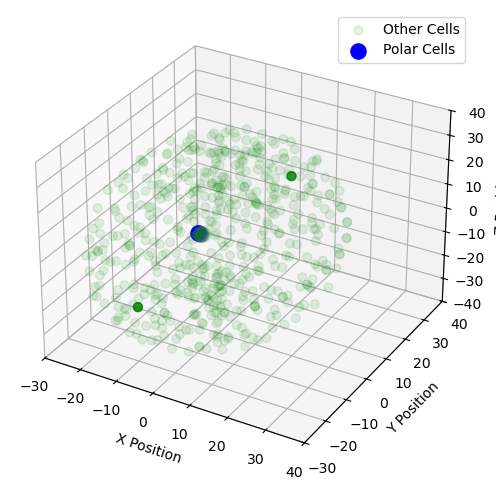

Processing timestep 58/100
Position for Border cell 360 is [-4.88945508 -0.24404975 -0.17769725]
Position for Border cell 361 is [-4.89689126 -0.03659924 -0.15410719]
Position for Border cell 362 is [-4.64934062 -0.23894012 -0.11975061]
Position for Border cell 363 is [-4.57423038  0.06753732 -0.18154908]
Position for Border cell 364 is [-4.92741436 -0.13429091 -0.28787738]
Position for Border cell 365 is [-4.26672703e+00  2.89260375e-01  2.03694142e-03]
[-5.31742305 -0.0406375  -0.14949727]
Polar cell 366 position: [-5.31742305 -0.0406375  -0.14949727]
Border centroid: [-4.06446902 -0.05444371 -0.15360269]
Distance to center: 1.2530368187317982
Confinement force applied: [313.22600853  -3.45141263  -1.02631523]
F_total for 366th cell: [311.99263923  -4.47082722  -2.27897291]
[-5.31874412 -0.04339349 -0.15219876]
Polar cell 367 position: [-5.31874412 -0.04339349 -0.15219876]
Border centroid: [-4.06446902 -0.05444371 -0.15360269]
Distance to center: 1.2543245568277877
Confinement force 

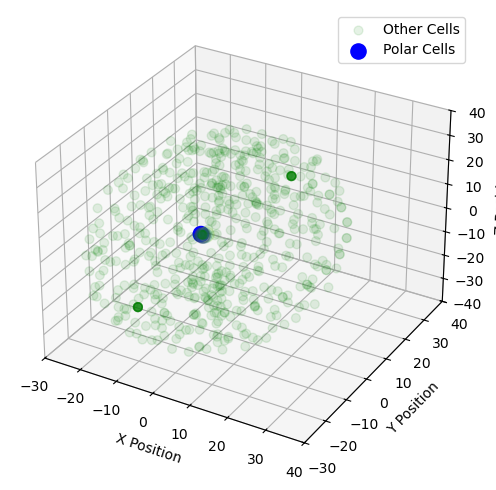

Processing timestep 59/100
Position for Border cell 360 is [-4.25964289 -0.25466353 -0.18179309]
Position for Border cell 361 is [-4.26561023 -0.04416897 -0.1571713 ]
Position for Border cell 362 is [-4.00977293 -0.24274654 -0.11721225]
Position for Border cell 363 is [-3.93267971  0.06719208 -0.17879844]
Position for Border cell 364 is [-4.29707241 -0.14382109 -0.29160872]
Position for Border cell 365 is [-3.62203596  0.29154582  0.00496766]
[-4.69343777 -0.04957916 -0.15405521]
Polar cell 366 position: [-4.69343777 -0.04957916 -0.15405521]
Border centroid: [-3.41813959 -0.05843274 -0.15303679]
Distance to center: 1.2753293189314774
Confinement force applied: [ 3.18812045e+02 -2.21330935e+00  2.54595067e-01]
F_total for 366th cell: [320.25842222  -1.04670205   1.50919963]
[-4.69109096 -0.04837438 -0.15263192]
Polar cell 367 position: [-4.69109096 -0.04837438 -0.15263192]
Border centroid: [-3.41813959 -0.05843274 -0.15303679]
Distance to center: 1.272991169538467
Confinement force appl

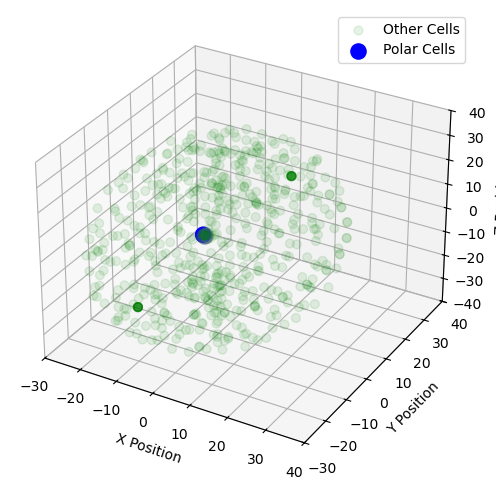

Processing timestep 60/100
Position for Border cell 360 is [-3.61653869 -0.26234387 -0.18144459]
Position for Border cell 361 is [-3.62446508 -0.0515387  -0.15960562]
Position for Border cell 362 is [-3.3605914  -0.24669147 -0.1136652 ]
Position for Border cell 363 is [-3.28262435  0.06762278 -0.1759609 ]
Position for Border cell 364 is [-3.65710247 -0.15246876 -0.29473341]
Position for Border cell 365 is [-2.96751557  0.29482356  0.00718898]
[-4.05292093 -0.05167256 -0.15103681]
Polar cell 366 position: [-4.05292093 -0.05167256 -0.15103681]
Border centroid: [-2.76382637 -0.06002797 -0.15335371]
Distance to center: 1.2891237211973456
Confinement force applied: [322.26114059  -2.08877     -0.57920306]
F_total for 366th cell: [321.18586572  -3.50820109  -1.83440177]
[-4.05428094 -0.05334131 -0.1526118 ]
Polar cell 367 position: [-4.05428094 -0.05334131 -0.1526118 ]
Border centroid: [-2.76382637 -0.06002797 -0.15335371]
Distance to center: 1.2904721123964444
Confinement force applied: [ 3

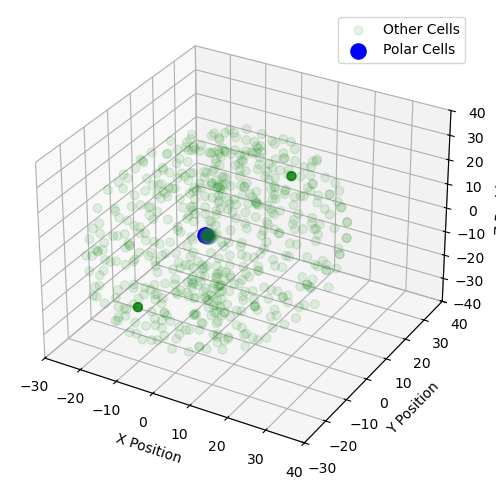

Processing timestep 61/100
Position for Border cell 360 is [-2.96421817 -0.26812194 -0.18201125]
Position for Border cell 361 is [-2.97551623 -0.05774926 -0.16223814]
Position for Border cell 362 is [-2.70237799 -0.24636985 -0.11250232]
Position for Border cell 363 is [-2.62443091  0.07021666 -0.17365707]
Position for Border cell 364 is [-3.00927512 -0.16013863 -0.29827708]
Position for Border cell 365 is [-2.30713979  0.30199521  0.00856358]
[-3.4105492  -0.05868896 -0.15470562]
Polar cell 366 position: [-3.4105492  -0.05868896 -0.15470562]
Border centroid: [-2.10352603 -0.05865084 -0.15541522]
Distance to center: 1.3070233568196354
Confinement force applied: [ 3.26743291e+02  9.53135903e-03 -1.77394050e-01]
F_total for 366th cell: [328.21075235   1.21131388   1.07605996]
[-3.40832782 -0.05654798 -0.15278027]
Polar cell 367 position: [-3.40832782 -0.05654798 -0.15278027]
Border centroid: [-2.10352603 -0.05865084 -0.15541522]
Distance to center: 1.304806141068356
Confinement force appl

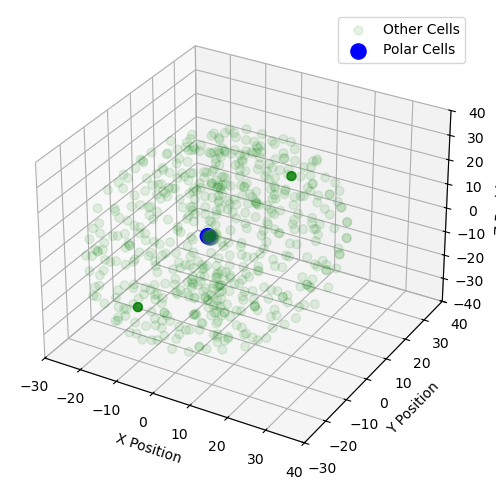

Processing timestep 62/100
Position for Border cell 360 is [-2.30638932 -0.27029298 -0.18460549]
Position for Border cell 361 is [-2.31975346 -0.06038699 -0.16677403]
Position for Border cell 362 is [-2.03921442 -0.24379833 -0.11247107]
Position for Border cell 363 is [-1.96039109  0.07592581 -0.17304893]
Position for Border cell 364 is [-2.35531728 -0.16470771 -0.303076  ]
Position for Border cell 365 is [-1.64009063  0.31135518  0.00748422]
[-2.75412769 -0.05626634 -0.1525535 ]
Polar cell 366 position: [-2.75412769 -0.05626634 -0.1525535 ]
Border centroid: [-1.43598735 -0.05454295 -0.1584904 ]
Distance to center: 1.3181548398209724
Confinement force applied: [329.52258598   0.4308293   -1.48416963]
F_total for 366th cell: [328.08818225  -0.99400546  -2.73939057]
[-2.75608806 -0.0574081  -0.15393281]
Polar cell 367 position: [-2.75608806 -0.0574081  -0.15393281]
Border centroid: [-1.43598735 -0.05454295 -0.1584904 ]
Distance to center: 1.320111691846052
Confinement force applied: [330

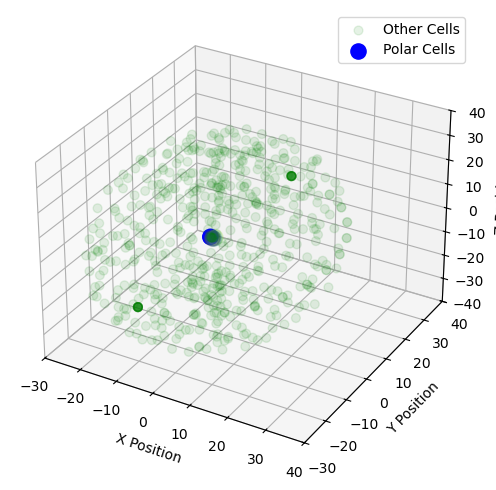

Processing timestep 63/100
Position for Border cell 360 is [-1.64069563 -0.26956059 -0.18790999]
Position for Border cell 361 is [-1.65802318 -0.06010921 -0.17250999]
Position for Border cell 362 is [-1.36875296 -0.23956492 -0.11317181]
Position for Border cell 363 is [-1.2888099   0.08504295 -0.17366371]
Position for Border cell 364 is [-1.69398185 -0.16617909 -0.30901063]
Position for Border cell 365 is [-0.96566058  0.32311313  0.00532373]
[-2.09795133 -0.05825435 -0.15803228]
Polar cell 366 position: [-2.09795133 -0.05825435 -0.15803228]
Border centroid: [-0.76235522 -0.04860851 -0.16233022]
Distance to center: 1.3356378595025333
Confinement force applied: [333.88652866   2.41136865  -1.07444609]
F_total for 366th cell: [3.35000712e+02 3.31302007e+00 1.78489828e-01]
[-2.09538243 -0.05603717 -0.15606086]
Polar cell 367 position: [-2.09538243 -0.05603717 -0.15606086]
Border centroid: [-0.76235522 -0.04860851 -0.16233022]
Distance to center: 1.3330626523784628
Confinement force applie

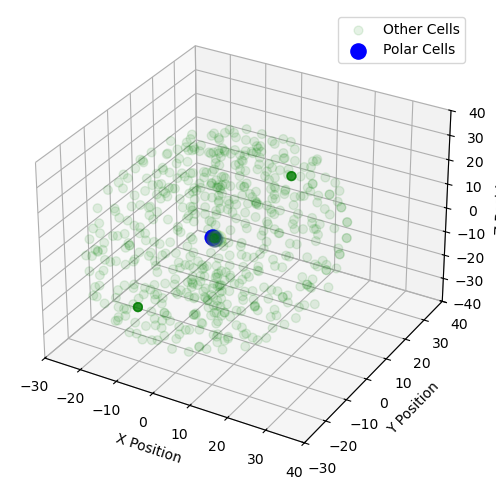

Processing timestep 64/100
Position for Border cell 360 is [-0.96742683 -0.26632649 -0.1918738 ]
Position for Border cell 361 is [-0.98906901 -0.05677433 -0.17912377]
Position for Border cell 362 is [-0.69179955 -0.23229673 -0.11449267]
Position for Border cell 363 is [-0.61180587  0.09506384 -0.17504253]
Position for Border cell 364 is [-1.02711572 -0.16570994 -0.3157672 ]
Position for Border cell 365 is [-0.2869143   0.33439257  0.00231865]
[-1.4279499  -0.05162831 -0.1576753 ]
Polar cell 366 position: [-1.4279499  -0.05162831 -0.1576753 ]
Border centroid: [-0.08209405 -0.04509732 -0.16667983]
Distance to center: 1.3459018271681205
Confinement force applied: [336.45146515   1.63268684  -2.25104963]
F_total for 366th cell: [ 3.35128863e+02  2.90541580e-01 -3.50698020e+00]
[-1.42963958 -0.05216492 -0.15907824]
Polar cell 367 position: [-1.42963958 -0.05216492 -0.15907824]
Border centroid: [-0.08209405 -0.04509732 -0.16667983]
Distance to center: 1.3475855059080428
Confinement force app

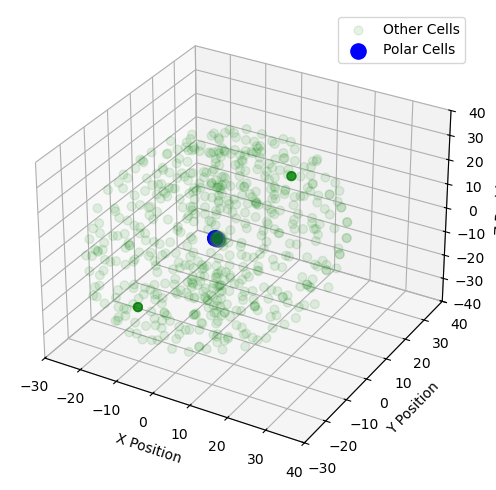

Processing timestep 65/100
Position for Border cell 360 is [-0.28863462 -0.26417382 -0.19633318]
Position for Border cell 361 is [-0.31489908 -0.05489258 -0.18638063]
Position for Border cell 362 is [-0.00623415 -0.22888901 -0.11626091]
Position for Border cell 363 is [ 0.07312834  0.10340064 -0.17709234]
Position for Border cell 364 is [-0.35360824 -0.16509972 -0.32313679]
Position for Border cell 365 is [ 0.39768347  0.33907058 -0.00087513]
[-0.75769218 -0.05104722 -0.16468926]
Polar cell 366 position: [-0.75769218 -0.05104722 -0.16468926]
Border centroid: [ 0.59944408 -0.04606841 -0.17345878]
Distance to center: 1.357173727722398
Confinement force applied: [339.27156588   1.24465737  -2.19230092]
F_total for 366th cell: [340.21338522   2.06399843  -0.93880532]
[-0.75599195 -0.04849496 -0.16277799]
Polar cell 367 position: [-0.75599195 -0.04849496 -0.16277799]
Border centroid: [ 0.59944408 -0.04606841 -0.17345878]
Distance to center: 1.3554802850716297
Confinement force applied: [338

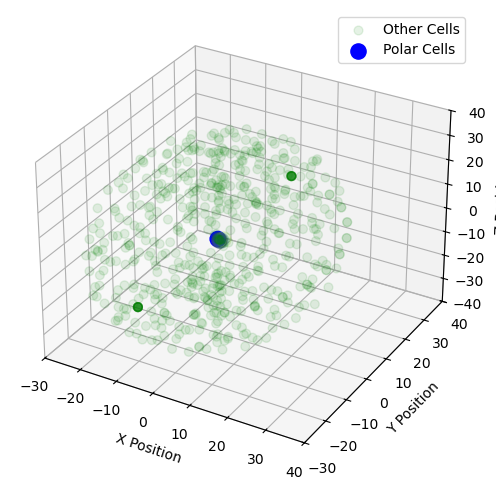

Processing timestep 66/100
Position for Border cell 360 is [ 0.39886093 -0.26169204 -0.20122631]
Position for Border cell 361 is [ 0.3676102  -0.05557335 -0.19417781]
Position for Border cell 362 is [ 0.6752579  -0.22891339 -0.12253159]
Position for Border cell 363 is [ 0.75068238  0.09873086 -0.18569451]
Position for Border cell 364 is [ 0.32915466 -0.16456129 -0.33102278]
Position for Border cell 365 is [ 1.07509843  0.33559874 -0.0060997 ]
[-0.07726541 -0.04691923 -0.16656687]
Polar cell 366 position: [-0.07726541 -0.04691923 -0.16656687]
Border centroid: [ 1.27490859 -0.04436782 -0.17851001]
Distance to center: 1.3522291522549774
Confinement force applied: [338.03100102   0.63782897  -2.98567563]
F_total for 366th cell: [336.51669015  -0.48263839  -4.24189211]
[-0.07855886 -0.04767436 -0.16804165]
Polar cell 367 position: [-0.07855886 -0.04767436 -0.16804165]
Border centroid: [ 1.27490859 -0.04436782 -0.17851001]
Distance to center: 1.3535119742194044
Confinement force applied: [33

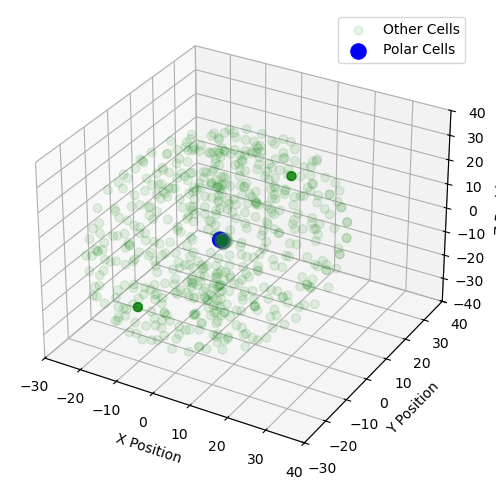

Processing timestep 67/100
Position for Border cell 360 is [ 1.08136956 -0.25423072 -0.20209498]
Position for Border cell 361 is [ 1.04490036 -0.05639569 -0.19970943]
Position for Border cell 362 is [ 1.3475081  -0.22707831 -0.13005793]
Position for Border cell 363 is [ 1.42071782  0.097569   -0.19387117]
Position for Border cell 364 is [ 1.01225525 -0.15914573 -0.33243361]
Position for Border cell 365 is [ 1.74270049  0.33307455 -0.01289295]
[ 0.59576797 -0.0478845  -0.17505065]
Polar cell 366 position: [ 0.59576797 -0.0478845  -0.17505065]
Border centroid: [ 1.94221911 -0.0408375  -0.18462935]
Distance to center: 1.3465036513047899
Confinement force applied: [336.60028538   1.76168613  -2.39458575]
F_total for 366th cell: [335.56964084   0.82768109  -3.64826985]
[ 0.59828903 -0.04611685 -0.17336793]
Polar cell 367 position: [ 0.59828903 -0.04611685 -0.17336793]
Border centroid: [ 1.94221911 -0.0408375  -0.18462935]
Distance to center: 1.3439876290231325
Confinement force applied: [33

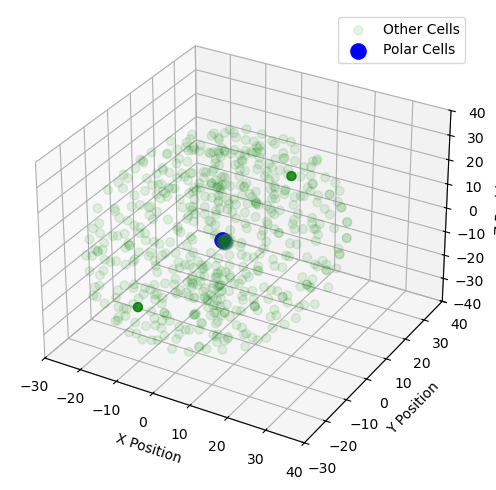

Processing timestep 68/100
Position for Border cell 360 is [ 1.75512949 -0.24421419 -0.20409509]
Position for Border cell 361 is [ 1.71314376 -0.05350748 -0.20631517]
Position for Border cell 362 is [ 2.01222066 -0.22401673 -0.13869083]
Position for Border cell 363 is [ 2.08304354  0.09569858 -0.20310175]
Position for Border cell 364 is [ 1.68510022 -0.15105502 -0.33489323]
Position for Border cell 365 is [ 2.40467701  0.33206985 -0.02068003]
[ 1.26690725 -0.04622914 -0.18234719]
Polar cell 366 position: [ 1.26690725 -0.04622914 -0.18234719]
Border centroid: [ 2.60424692 -0.03606284 -0.19102197]
Distance to center: 1.3374064406356905
Confinement force applied: [334.3224171    2.54148116  -2.16861236]
F_total for 366th cell: [332.5492548    1.07238676  -3.41981868]
[ 1.26961248 -0.04376398 -0.17911119]
Polar cell 367 position: [ 1.26961248 -0.04376398 -0.17911119]
Border centroid: [ 2.60424692 -0.03606284 -0.19102197]
Distance to center: 1.3347098099036847
Confinement force applied: [33

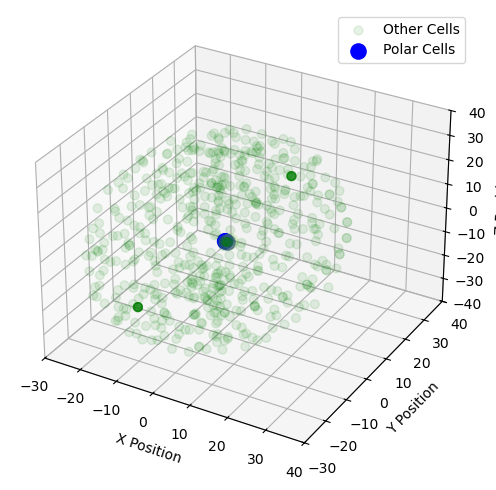

Processing timestep 69/100
Position for Border cell 360 is [ 2.42183844 -0.23496201 -0.20725229]
Position for Border cell 361 is [ 2.3795351  -0.04723265 -0.21014279]
Position for Border cell 362 is [ 2.67069778 -0.21951634 -0.14838135]
Position for Border cell 363 is [ 2.74019446  0.09519182 -0.21318487]
Position for Border cell 364 is [ 2.35109129 -0.14238293 -0.33834723]
Position for Border cell 365 is [ 3.06212444  0.33252508 -0.02882327]
[ 1.93200576 -0.04408437 -0.18918683]
Polar cell 366 position: [ 1.93200576 -0.04408437 -0.18918683]
Border centroid: [ 3.25945993 -0.03005025 -0.19796947]
Distance to center: 1.3275574035836848
Confinement force applied: [331.85104301   3.50839684  -2.19557869]
F_total for 366th cell: [330.60545032   2.46605803  -3.44227219]
[ 1.93631878 -0.03959396 -0.18520146]
Polar cell 367 position: [ 1.93631878 -0.03959396 -0.18520146]
Border centroid: [ 3.25945993 -0.03005025 -0.19796947]
Distance to center: 1.3232371727614443
Confinement force applied: [33

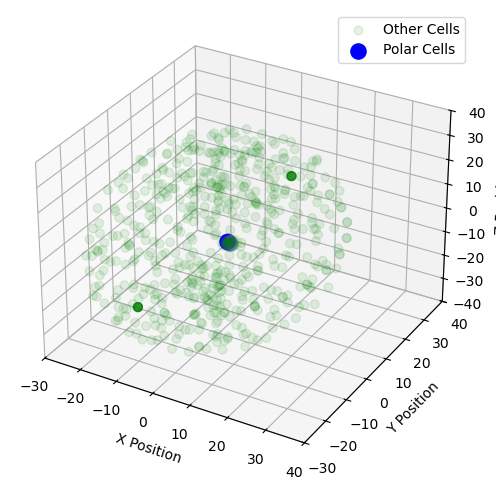

Processing timestep 70/100
Position for Border cell 360 is [ 3.08293803 -0.22449618 -0.2112886 ]
Position for Border cell 361 is [ 3.03926902 -0.04062852 -0.2147756 ]
Position for Border cell 362 is [ 3.32205913 -0.21349167 -0.1587262 ]
Position for Border cell 363 is [ 3.38961384  0.09835036 -0.22313394]
Position for Border cell 364 is [ 3.01260923 -0.13375201 -0.34247424]
Position for Border cell 365 is [ 3.71027035  0.3337165  -0.03741827]
[ 2.59321666 -0.03915225 -0.19607137]
Polar cell 366 position: [ 2.59321666 -0.03915225 -0.19607137]
Border centroid: [ 3.90537145 -0.02226038 -0.20509305]
Distance to center: 1.3122945209849175
Confinement force applied: [328.02619797   4.22280699  -2.25533189]
F_total for 366th cell: [326.51624103   2.93204794  -3.50253858]
[ 2.59763431 -0.03565377 -0.19174007]
Polar cell 367 position: [ 2.59763431 -0.03565377 -0.19174007]
Border centroid: [ 3.90537145 -0.02226038 -0.20509305]
Distance to center: 1.3078738956376599
Confinement force applied: [32

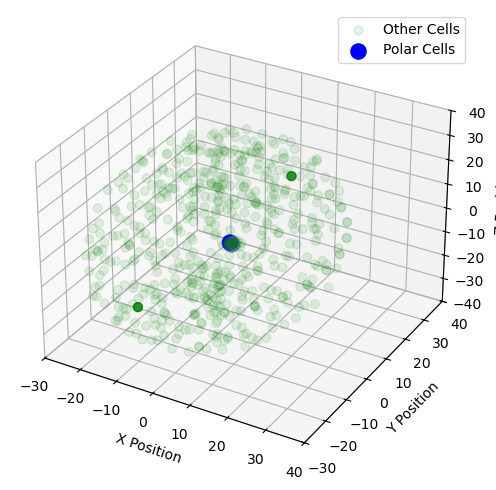

Processing timestep 71/100
Position for Border cell 360 is [ 3.73550337 -0.21119896 -0.21573087]
Position for Border cell 361 is [ 3.69095743 -0.03000502 -0.21884676]
Position for Border cell 362 is [ 3.96410209 -0.20652566 -0.16855065]
Position for Border cell 363 is [ 4.02966954  0.10107533 -0.2339296 ]
Position for Border cell 364 is [ 3.66512271 -0.12245348 -0.34686893]
Position for Border cell 365 is [ 4.34687356  0.33554552 -0.04663147]
[ 3.24624915 -0.03328816 -0.20307645]
Polar cell 366 position: [ 3.24624915 -0.03328816 -0.20307645]
Border centroid: [ 4.54116582 -0.01352088 -0.21164216]
Distance to center: 1.2950958695977663
Confinement force applied: [323.71667046   4.94162762  -2.14134492]
F_total for 366th cell: [322.08239143   3.34460739  -3.38645413]
[ 3.25146049 -0.02867855 -0.19860092]
Polar cell 367 position: [ 3.25146049 -0.02867855 -0.19860092]
Border centroid: [ 4.54116582 -0.01352088 -0.21164216]
Distance to center: 1.2898603340010402
Confinement force applied: [32

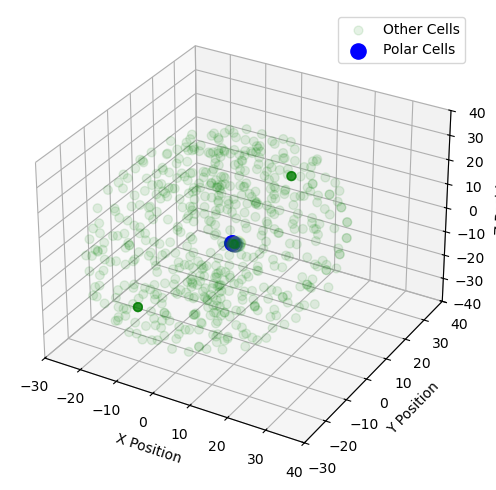

Processing timestep 72/100
Position for Border cell 360 is [ 4.37708206 -0.19785237 -0.21918281]
Position for Border cell 361 is [ 4.33172857 -0.01982991 -0.22337865]
Position for Border cell 362 is [ 4.59675303 -0.19892007 -0.17818011]
Position for Border cell 363 is [ 4.65932514  0.10541558 -0.24397972]
Position for Border cell 364 is [ 4.30801784 -0.10992372 -0.35015413]
Position for Border cell 365 is [ 4.97408828  0.33998519 -0.05497755]
[ 3.89041393 -0.02659894 -0.20984936]
Polar cell 366 position: [ 3.89041393 -0.02659894 -0.20984936]
Border centroid: [ 5.16658998e+00 -2.60091378e-03 -2.18225082e-01]
Distance to center: 1.2764291467560624
Confinement force applied: [319.03151478   5.99927213  -2.0938488 ]
F_total for 366th cell: [318.03278632   4.5804349   -3.33800672]
[ 3.89617808 -0.02170949 -0.20534069]
Polar cell 367 position: [ 3.89617808 -0.02170949 -0.20534069]
Border centroid: [ 5.16658998e+00 -2.60091378e-03 -2.18225082e-01]
Distance to center: 1.2706209218938047
Confin

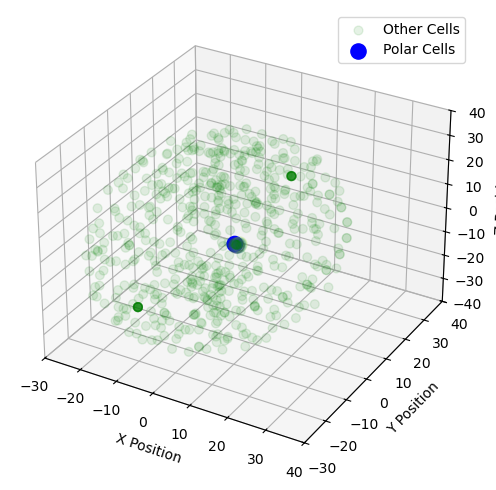

Processing timestep 73/100
Position for Border cell 360 is [ 5.00883936 -0.18252195 -0.22282486]
Position for Border cell 361 is [ 4.96255206 -0.00711969 -0.22774811]
Position for Border cell 362 is [ 5.21923568 -0.18932265 -0.187976  ]
Position for Border cell 363 is [ 5.27916356  0.11212993 -0.25401133]
Position for Border cell 364 is [ 4.94018266 -0.09560408 -0.35357704]
Position for Border cell 365 is [ 5.58956655  0.34683296 -0.06321316]
[ 4.5264795  -0.01743807 -0.21652537]
Polar cell 366 position: [ 4.5264795  -0.01743807 -0.21652537]
Border centroid: [ 5.78132201  0.00945444 -0.2250271 ]
Distance to center: 1.2551594374928758
Confinement force applied: [313.69813086   6.72286016  -2.1253477 ]
F_total for 366th cell: [312.22949719   5.10708409  -3.36991914]
[ 4.53143417 -0.01207706 -0.21203314]
Polar cell 367 position: [ 4.53143417 -0.01207706 -0.21203314]
Border centroid: [ 5.78132201  0.00945444 -0.2250271 ]
Distance to center: 1.250140822950202
Confinement force applied: [312

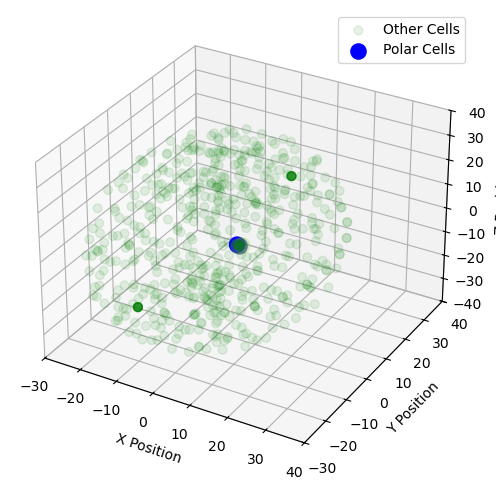

Processing timestep 74/100
Position for Border cell 360 is [ 5.62983608 -0.16566252 -0.22672051]
Position for Border cell 361 is [ 5.58307899  0.00626665 -0.23235949]
Position for Border cell 362 is [ 5.83048468 -0.17888055 -0.1979687 ]
Position for Border cell 363 is [ 5.88798655  0.11986421 -0.26428101]
Position for Border cell 364 is [ 5.56226059 -0.07965037 -0.3573242 ]
Position for Border cell 365 is [ 6.19428519  0.35478922 -0.0715087 ]
[ 5.1509385  -0.0072239  -0.22326521]
Polar cell 366 position: [ 5.1509385  -0.0072239  -0.22326521]
Border centroid: [ 6.38595838  0.02234318 -0.23200561]
Distance to center: 1.2354046799171887
Confinement force applied: [308.74247511   7.39147202  -2.18501202]
F_total for 366th cell: [307.73759259   6.00376397  -3.42827335]
[ 5.15632530e+00 -1.08455386e-03 -2.18819209e-01]
Polar cell 367 position: [ 5.15632530e+00 -1.08455386e-03 -2.18819209e-01]
Border centroid: [ 6.38595838  0.02234318 -0.23200561]
Distance to center: 1.229926925990309
Confine

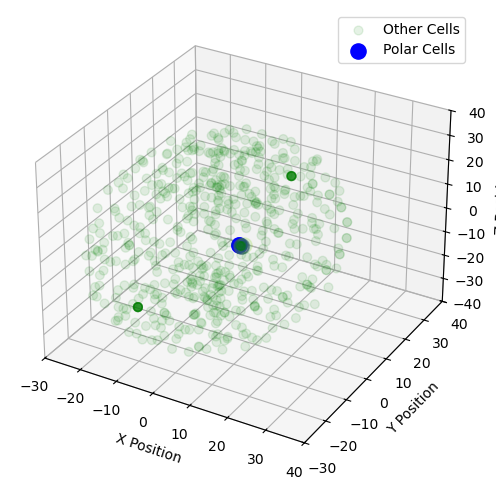

Processing timestep 75/100
Position for Border cell 360 is [ 6.24044915 -0.14807554 -0.23082123]
Position for Border cell 361 is [ 6.19298082  0.02030215 -0.23721965]
Position for Border cell 362 is [ 6.43191068 -0.16594726 -0.20807974]
Position for Border cell 363 is [ 6.48734644  0.12873702 -0.2746875 ]
Position for Border cell 364 is [ 6.17454447 -0.06389373 -0.3614127 ]
Position for Border cell 365 is [ 6.78851873  0.36293644 -0.07981286]
[ 5.76641368e+00  4.78362359e-03 -2.30121758e-01]
Polar cell 366 position: [ 5.76641368e+00  4.78362359e-03 -2.30121758e-01]
Border centroid: [ 6.97904189  0.0358459  -0.23894824]
Distance to center: 1.213058096987498
Confinement force applied: [303.14455683   7.76524961  -2.20652936]
F_total for 366th cell: [302.0643203    6.75655838  -3.45118559]
[ 5.77112566  0.01037116 -0.22573535]
Polar cell 367 position: [ 5.77112566  0.01037116 -0.22573535]
Border centroid: [ 6.97904189  0.0358459  -0.23894824]
Distance to center: 1.2082570733397857
Confine

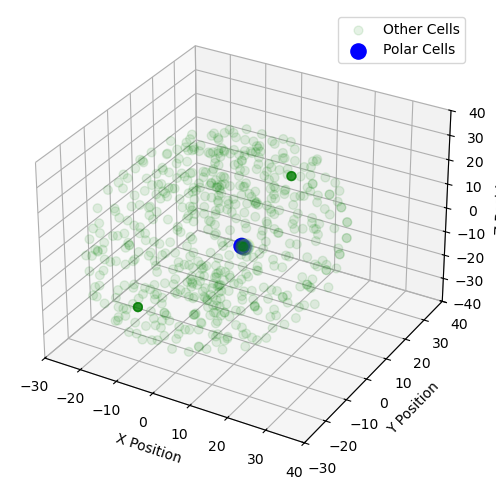

Processing timestep 76/100
Position for Border cell 360 is [ 6.84025401 -0.1301569  -0.23497363]
Position for Border cell 361 is [ 6.79143449  0.03672631 -0.24216991]
Position for Border cell 362 is [ 7.02198583 -0.15365825 -0.21801642]
Position for Border cell 363 is [ 7.07483342  0.1374999  -0.28503946]
Position for Border cell 364 is [ 6.77439224 -0.04665262 -0.36568322]
Position for Border cell 365 is [ 7.37135135  0.37131697 -0.08780679]
[ 6.37054232  0.01829674 -0.23702413]
Polar cell 366 position: [ 6.37054232  0.01829674 -0.23702413]
Border centroid: [ 7.56053127  0.04832498 -0.24591334]
Distance to center: 1.1904009481354645
Confinement force applied: [297.48474212   7.50674524  -2.22220953]
F_total for 366th cell: [296.36493581   6.33400278  -3.4697955 ]
[ 6.37387812  0.02251159 -0.23270305]
Polar cell 367 position: [ 6.37387812  0.02251159 -0.23270305]
Border centroid: [ 7.56053127  0.04832498 -0.24591334]
Distance to center: 1.1870073899165203
Confinement force applied: [29

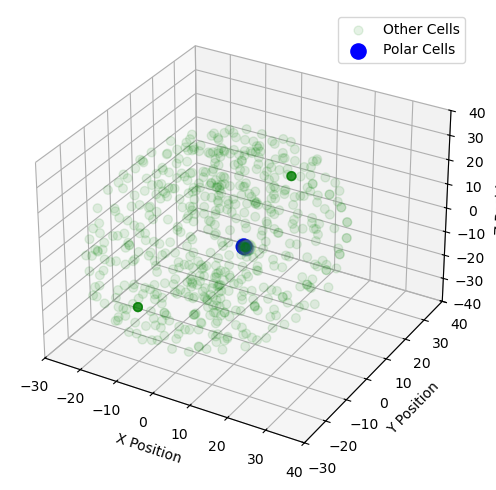

Processing timestep 77/100
Position for Border cell 360 is [ 7.42813426 -0.11284323 -0.23892669]
Position for Border cell 361 is [ 7.37813183  0.05193422 -0.24694971]
Position for Border cell 362 is [ 7.60087672 -0.14133729 -0.22747649]
Position for Border cell 363 is [ 7.65068757  0.14578738 -0.29487606]
Position for Border cell 364 is [ 7.3631666  -0.02936047 -0.36976769]
Position for Border cell 365 is [ 7.94219067  0.37576929 -0.0974834 ]
[ 6.96327219  0.03096475 -0.24396372]
Polar cell 366 position: [ 6.96327219  0.03096475 -0.24396372]
Border centroid: [ 8.13220223  0.05976816 -0.25208074]
Distance to center: 1.169313025718003
Confinement force applied: [292.22001313   7.20054582  -2.02916751]
F_total for 366th cell: [291.19854954   5.65578594  -3.27625183]
[ 6.96642645  0.03580253 -0.23970549]
Polar cell 367 position: [ 6.96642645  0.03580253 -0.23970549]
Border centroid: [ 8.13220223  0.05976816 -0.25208074]
Distance to center: 1.166087762622637
Confinement force applied: [291.

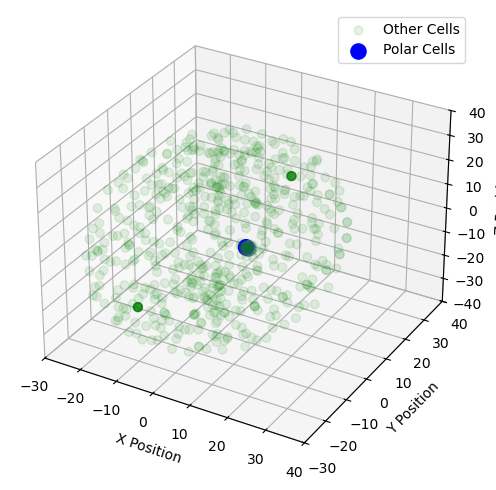

Processing timestep 78/100
Position for Border cell 360 is [ 8.00531393 -0.0965568  -0.24224392]
Position for Border cell 361 is [ 7.95495841  0.06557485 -0.25110792]
Position for Border cell 362 is [ 8.16998951 -0.13037374 -0.23606831]
Position for Border cell 363 is [ 8.21795992  0.15363085 -0.30370548]
Position for Border cell 364 is [ 7.94083818 -0.01365158 -0.3731536 ]
Position for Border cell 365 is [ 8.50415344  0.37998539 -0.1062052 ]
[ 7.54566929  0.04227632 -0.25051622]
Polar cell 366 position: [ 7.54566929  0.04227632 -0.25051622]
Border centroid: [ 8.69446978  0.07043469 -0.25742991]
Distance to center: 1.149166331012757
Confinement force applied: [287.18762624   7.03928559  -1.728347  ]
F_total for 366th cell: [285.92329172   5.82720674  -2.97488427]
[ 7.54841508  0.04783074 -0.24632708]
Polar cell 367 position: [ 7.54841508  0.04783074 -0.24632708]
Border centroid: [ 8.69446978  0.07043469 -0.25742991]
Distance to center: 1.1463313612994153
Confinement force applied: [286

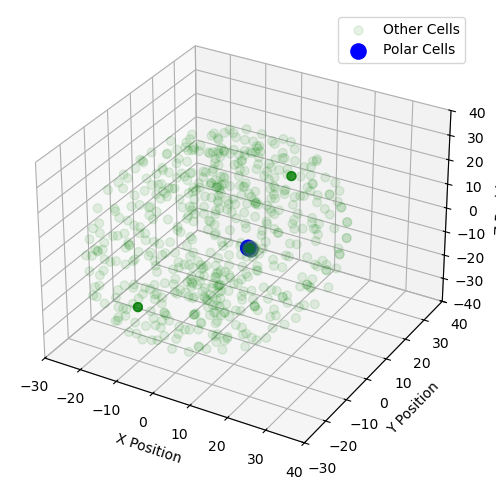

Processing timestep 79/100
Position for Border cell 360 is [ 8.57350238 -0.08103437 -0.24456899]
Position for Border cell 361 is [ 8.52198486  0.07945929 -0.25430621]
Position for Border cell 362 is [ 8.73024314 -0.11968419 -0.24350967]
Position for Border cell 363 is [ 8.77615847  0.16033627 -0.31114848]
Position for Border cell 364 is [ 8.50968326e+00  9.39072240e-04 -3.75419664e-01]
Position for Border cell 365 is [ 9.05524658  0.38259204 -0.11562647]
[ 8.11751588  0.05393073 -0.25646599]
Polar cell 366 position: [ 8.11751588  0.05393073 -0.25646599]
Border centroid: [ 9.24812091  0.08077122 -0.26162123]
Distance to center: 1.1309353330633771
Confinement force applied: [282.63876173   6.70982665  -1.28875144]
F_total for 366th cell: [281.3251738    4.98538012  -2.53519587]
[ 8.12033584  0.059571   -0.25234905]
Polar cell 367 position: [ 8.12033584  0.059571   -0.25234905]
Border centroid: [ 9.24812091  0.08077122 -0.26162123]
Distance to center: 1.1280224211453267
Confinement force 

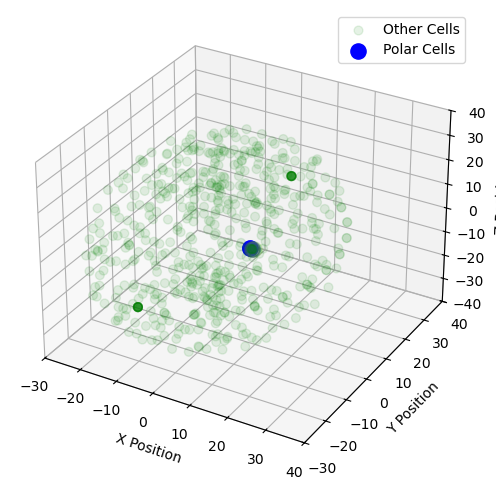

Processing timestep 80/100
Position for Border cell 360 is [ 9.13263083 -0.06574062 -0.24585326]
Position for Border cell 361 is [ 9.08036242  0.09196003 -0.25643392]
Position for Border cell 362 is [ 9.28200278 -0.10948571 -0.24972763]
Position for Border cell 363 is [ 9.32648039  0.16682868 -0.31716893]
Position for Border cell 364 is [ 9.06940822  0.01567331 -0.37639009]
Position for Border cell 365 is [ 9.59784081  0.38539165 -0.12415352]
[ 8.68016622  0.06390149 -0.26153638]
Polar cell 366 position: [ 8.68016622  0.06390149 -0.26153638]
Border centroid: [ 9.79260694  0.09130351 -0.26465459]
Distance to center: 1.1127825243612757
Confinement force applied: [278.09768354   6.85019608  -0.77951561]
F_total for 366th cell: [276.72457493   5.52607445  -2.02564392]
[ 8.68318769  0.06972225 -0.25748921]
Polar cell 367 position: [ 8.68318769  0.06972225 -0.25748921]
Border centroid: [ 9.79260694  0.09130351 -0.26465459]
Distance to center: 1.1096522794523092
Confinement force applied: [27

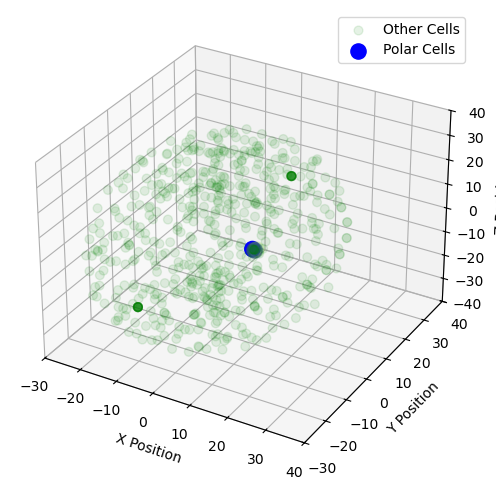

Processing timestep 81/100
Position for Border cell 360 is [ 9.68321218 -0.05088244 -0.24608796]
Position for Border cell 361 is [ 9.62982941  0.10435213 -0.25750117]
Position for Border cell 362 is [ 9.82449776 -0.09842329 -0.2547312 ]
Position for Border cell 363 is [ 9.8669572   0.17439364 -0.32182631]
Position for Border cell 364 is [ 9.61941056  0.03045156 -0.3760298 ]
Position for Border cell 365 is [10.13173454  0.38792946 -0.13175108]
[ 9.23361537  0.07495364 -0.26558767]
Polar cell 366 position: [ 9.23361537  0.07495364 -0.26558767]
Border centroid: [10.32787414  0.10138551 -0.26658186]
Distance to center: 1.094578398392923
Confinement force applied: [ 2.73552194e+02  6.60766595e+00 -2.48536084e-01]
F_total for 366th cell: [272.39527471   5.16196065  -1.49523212]
[ 9.23768978  0.07966583 -0.26160989]
Polar cell 367 position: [ 9.23768978  0.07966583 -0.26160989]
Border centroid: [10.32787414  0.10138551 -0.26658186]
Distance to center: 1.0904120273562117
Confinement force appl

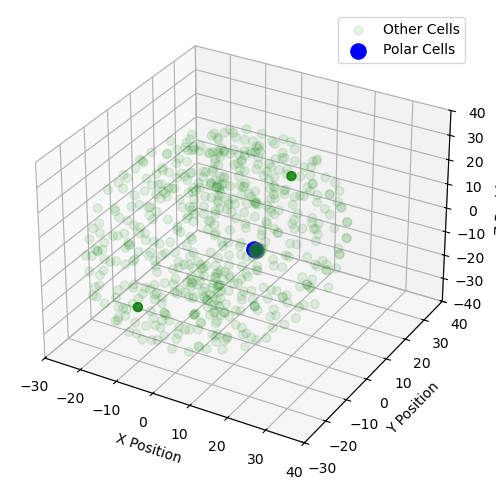

Processing timestep 82/100
Position for Border cell 360 is [10.22402129 -0.03612804 -0.24534286]
Position for Border cell 361 is [10.16987488  0.11688811 -0.25758253]
Position for Border cell 362 is [10.35767436 -0.08780646 -0.25857763]
Position for Border cell 363 is [10.39864176  0.18154277 -0.32520026]
Position for Border cell 364 is [10.16019936  0.04358392 -0.37441103]
Position for Border cell 365 is [10.65683316  0.39023277 -0.13837685]
[ 9.77840592  0.08527756 -0.26857814]
Polar cell 366 position: [ 9.77840592  0.08527756 -0.26857814]
Border centroid: [10.85443438  0.11078215 -0.26749542]
Distance to center: 1.0763312220337926
Confinement force applied: [268.99461813   6.37584997   0.27066687]
F_total for 366th cell: [268.10263518   5.32773572  -0.97546203]
[ 9.7822119   0.09071976 -0.26466892]
Polar cell 367 position: [ 9.7822119   0.09071976 -0.26466892]
Border centroid: [10.85443438  0.11078215 -0.26749542]
Distance to center: 1.0724138825052643
Confinement force applied: [26

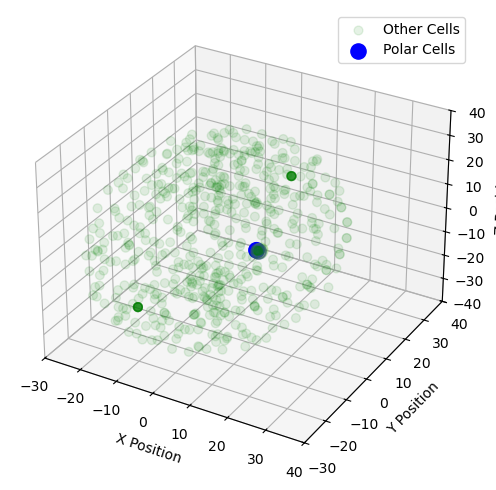

Processing timestep 83/100
Position for Border cell 360 is [10.75565649 -0.02234034 -0.24365515]
Position for Border cell 361 is [10.70082891  0.12871146 -0.25675551]
Position for Border cell 362 is [10.88273081 -0.0781103  -0.26133035]
Position for Border cell 363 is [10.92197586  0.18806836 -0.32749803]
Position for Border cell 364 is [10.69172674  0.05696493 -0.37165543]
Position for Border cell 365 is [11.17368748  0.39139876 -0.14407804]
[10.31461119  0.09593303 -0.27052906]
Polar cell 366 position: [10.31461119  0.09593303 -0.27052906]
Border centroid: [11.37333582  0.11966581 -0.26749264]
Distance to center: 1.0589949479512677
Confinement force applied: [264.66865986   5.93291454   0.75907036]
F_total for 366th cell: [263.31484761   4.6311482   -0.48991501]
[10.31765088  0.09959781 -0.26668526]
Polar cell 367 position: [10.31765088  0.09959781 -0.26668526]
Border centroid: [11.37333582  0.11966581 -0.26749264]
Distance to center: 1.0558759768994166
Confinement force applied: [ 2

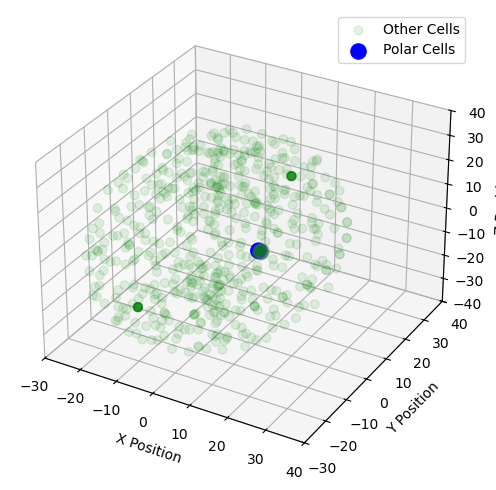

Processing timestep 84/100
Position for Border cell 360 is [ 1.12803676e+01 -8.55501706e-03 -2.40994266e-01]
Position for Border cell 361 is [11.22516737  0.13979835 -0.25501255]
Position for Border cell 362 is [11.4007484  -0.06860136 -0.26299746]
Position for Border cell 363 is [11.43706005  0.19456839 -0.32897376]
Position for Border cell 364 is [11.21457714  0.06944185 -0.36792162]
Position for Border cell 365 is [11.68209436  0.39134266 -0.14905616]
[10.84124089  0.10519533 -0.27150889]
Polar cell 366 position: [10.84124089  0.10519533 -0.27150889]
Border centroid: [11.88484618  0.12763605 -0.26669647]
Distance to center: 1.0438576291802015
Confinement force applied: [260.88882593   5.60991142   1.20304658]
F_total for 366th cell: [ 2.59495238e+02  4.41731433e+00 -4.49151011e-02]
[10.84502426  0.10920632 -0.26772382]
Polar cell 367 position: [10.84502426  0.10920632 -0.26772382]
Border centroid: [11.88484618  0.12763605 -0.26669647]
Distance to center: 1.0399857353754323
Confineme

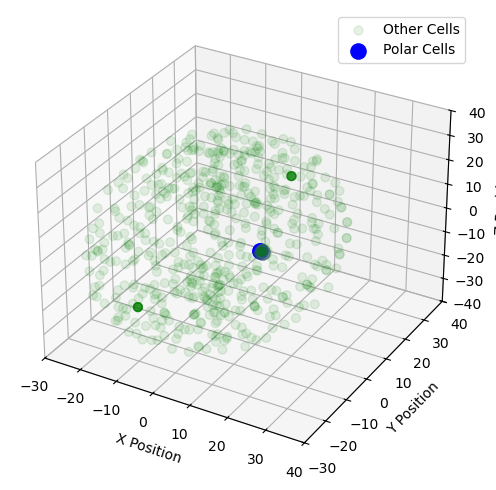

Processing timestep 85/100
Position for Border cell 360 is [ 1.17969750e+01  4.12894634e-03 -2.37422735e-01]
Position for Border cell 361 is [11.74166544  0.1494939  -0.2524039 ]
Position for Border cell 362 is [11.91142565 -0.05925183 -0.26364797]
Position for Border cell 363 is [11.945386    0.20006939 -0.32972806]
Position for Border cell 364 is [11.73012809  0.08029914 -0.36341076]
Position for Border cell 365 is [12.18349686  0.39107675 -0.15356541]
[11.36023137  0.11402996 -0.27159872]
Polar cell 366 position: [11.36023137  0.11402996 -0.27159872]
Border centroid: [12.3886359   0.13539819 -0.26523183]
Distance to center: 1.0286462074797977
Confinement force applied: [257.08863596   5.34179788   1.59164533]
F_total for 366th cell: [255.56940657   4.20484535   0.34336236]
[11.36383351  0.11797124 -0.26787529]
Polar cell 367 position: [11.36383351  0.11797124 -0.26787529]
Border centroid: [12.3886359   0.13539819 -0.26523183]
Distance to center: 1.0249539629012865
Confinement force 

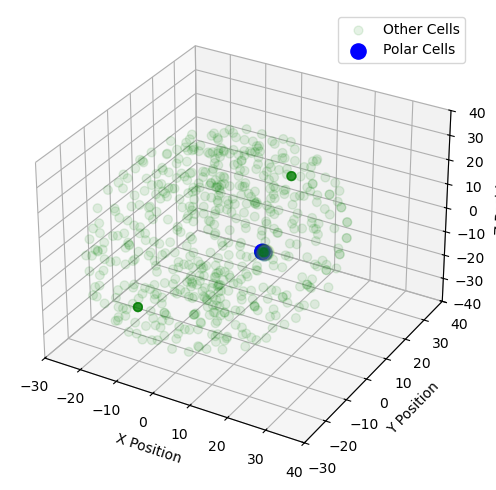

Processing timestep 86/100
Position for Border cell 360 is [12.30557069  0.01612351 -0.23313092]
Position for Border cell 361 is [12.25016851  0.15960462 -0.24909596]
Position for Border cell 362 is [12.41413561 -0.05075189 -0.26347267]
Position for Border cell 363 is [12.44686727  0.20547246 -0.32956262]
Position for Border cell 364 is [12.23765339  0.09169824 -0.3583678 ]
Position for Border cell 365 is [12.67741991  0.39024219 -0.157761  ]
[11.87137018  0.12243965 -0.270912  ]
Polar cell 366 position: [11.87137018  0.12243965 -0.270912  ]
Border centroid: [12.88571598  0.14285483 -0.26333097]
Distance to center: 1.014579549008283
Confinement force applied: [253.57395385   5.10354299   1.89516237]
F_total for 366th cell: [252.18340001   4.05150292   0.64649431]
[11.87500773  0.12604037 -0.26724639]
Polar cell 367 position: [11.87500773  0.12604037 -0.26724639]
Border centroid: [12.88571598  0.14285483 -0.26333097]
Distance to center: 1.0108556941360693
Confinement force applied: [252

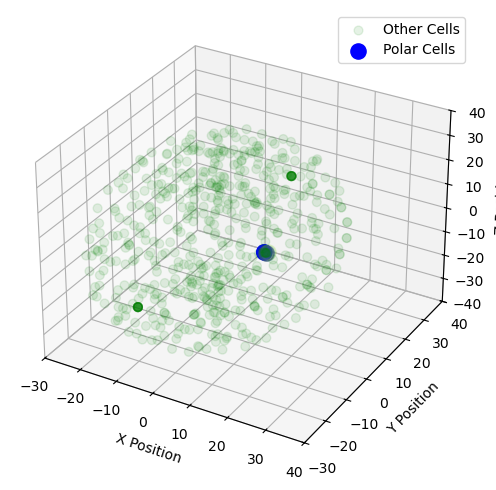

Processing timestep 87/100
Position for Border cell 360 is [12.80767481  0.02820219 -0.2283257 ]
Position for Border cell 361 is [12.75158068  0.16857572 -0.24527828]
Position for Border cell 362 is [12.91018799 -0.04284676 -0.26268   ]
Position for Border cell 363 is [12.94145831  0.211038   -0.32855865]
Position for Border cell 364 is [12.73816591  0.10277529 -0.3535718 ]
Position for Border cell 365 is [13.16522819  0.38938453 -0.16157141]
[12.37573698  0.13054265 -0.26961901]
Polar cell 366 position: [12.37573698  0.13054265 -0.26961901]
Border centroid: [13.37554184  0.15133818 -0.26104433]
Distance to center: 1.0000578657022619
Confinement force applied: [249.93871788   5.19862116   2.14356223]
F_total for 366th cell: [248.65461948   3.84601208   0.89410405]
[12.37915733  0.13363251 -0.26600606]
Polar cell 367 position: [12.37915733  0.13363251 -0.26600606]
Border centroid: [13.37554184  0.15133818 -0.26104433]
Distance to center: 0.9965541591324718
Confinement force applied: [24

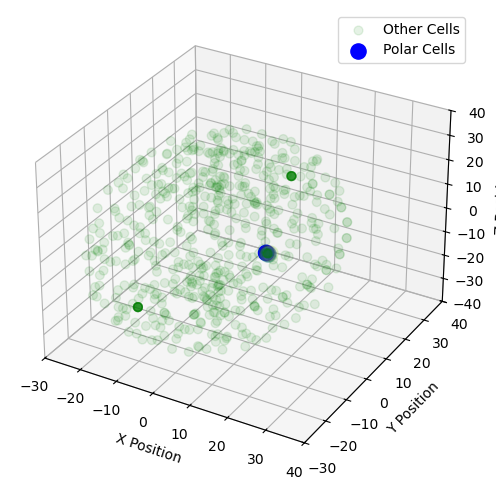

Processing timestep 88/100
Position for Border cell 360 is [13.30131837  0.04101534 -0.22315379]
Position for Border cell 361 is [13.2462728   0.1781013  -0.24107862]
Position for Border cell 362 is [13.39885887 -0.0331006  -0.26145004]
Position for Border cell 363 is [13.42901581  0.2174841  -0.32701468]
Position for Border cell 364 is [13.23257022  0.11461962 -0.34845675]
Position for Border cell 365 is [13.64521495  0.38990932 -0.16511209]
[12.87304622  0.13823468 -0.2678308 ]
Polar cell 366 position: [12.87304622  0.13823468 -0.2678308 ]
Border centroid: [13.85751613  0.1605172  -0.2585613 ]
Distance to center: 0.9847656810603737
Confinement force applied: [246.10498235   5.57034683   2.31725739]
F_total for 366th cell: [244.6644722    4.49107084   1.06769835]
[12.87678052  0.14088083 -0.26426723]
Polar cell 367 position: [12.87678052  0.14088083 -0.26426723]
Border centroid: [13.85751613  0.1605172  -0.2585613 ]
Distance to center: 0.9809487653434796
Confinement force applied: [24

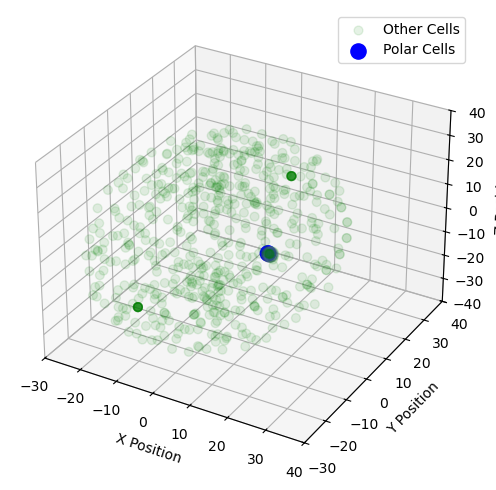

Processing timestep 89/100
Position for Border cell 360 is [13.78782673  0.05398849 -0.21772387]
Position for Border cell 361 is [13.73166616  0.18859558 -0.23666522]
Position for Border cell 362 is [13.87947981 -0.02229279 -0.25992235]
Position for Border cell 363 is [13.90952207  0.22528654 -0.32517532]
Position for Border cell 364 is [13.71982614  0.12643855 -0.34313801]
Position for Border cell 365 is [14.11677589  0.39108681 -0.16874302]
[13.36237516  0.14721682 -0.2656954 ]
Polar cell 366 position: [13.36237516  0.14721682 -0.2656954 ]
Border centroid: [14.33055636  0.16983638 -0.25605623]
Distance to center: 0.9684933565569999
Confinement force applied: [242.03280241   5.65459851   2.4096684 ]
F_total for 366th cell: [240.97193153   4.35275033   1.16032994]
[13.36617836  0.15009838 -0.26218611]
Polar cell 367 position: [13.36617836  0.15009838 -0.26218611]
Border centroid: [14.33055636  0.16983638 -0.25605623]
Distance to center: 0.9645994379187117
Confinement force applied: [24

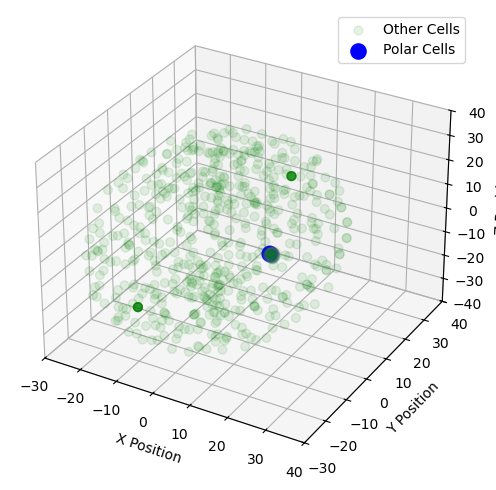

Processing timestep 90/100
Position for Border cell 360 is [14.2654241   0.0675907  -0.21222302]
Position for Border cell 361 is [14.20956892  0.19899015 -0.2322081 ]
Position for Border cell 362 is [ 1.43517982e+01 -1.14226228e-02 -2.58216212e-01]
Position for Border cell 363 is [14.38038411  0.23317262 -0.32317807]
Position for Border cell 364 is [14.19799089  0.13841679 -0.3378646 ]
Position for Border cell 365 is [14.57817188  0.39227066 -0.17264739]
[13.84431902  0.15592232 -0.26337474]
Polar cell 366 position: [13.84431902  0.15592232 -0.26337474]
Border centroid: [14.79422492  0.17855484 -0.25354585]
Distance to center: 0.9502263144358716
Confinement force applied: [237.46397812   5.65783281   2.45709285]
F_total for 366th cell: [236.17044993   3.65723157   1.20717747]
[13.8473304   0.1591448  -0.25991989]
Polar cell 367 position: [13.8473304   0.1591448  -0.25991989]
Border centroid: [14.79422492  0.17855484 -0.25354585]
Distance to center: 0.9471148888646129
Confinement force 

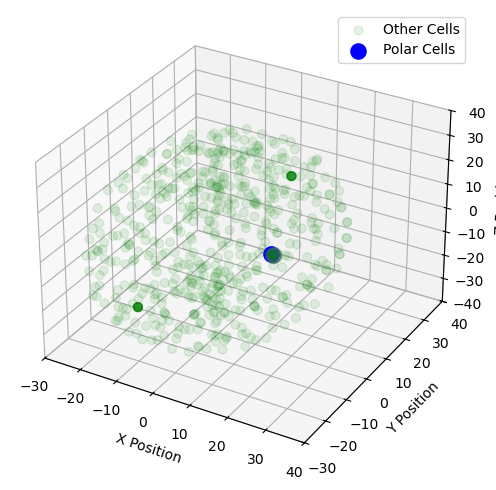

Processing timestep 91/100
Position for Border cell 360 is [14.73387299  0.07996745 -0.20673267]
Position for Border cell 361 is [14.67776873  0.2093765  -0.22785378]
Position for Border cell 362 is [ 1.48143151e+01 -1.70074899e-03 -2.56383784e-01]
Position for Border cell 363 is [14.84223893  0.24100164 -0.32094349]
Position for Border cell 364 is [14.66709742  0.15026437 -0.33256865]
Position for Border cell 365 is [15.03005637  0.39241985 -0.17679275]
[14.31665992  0.16323678 -0.26096039]
Polar cell 366 position: [14.31665992  0.16323678 -0.26096039]
Border centroid: [15.24825148  0.18607913 -0.25100798]
Distance to center: 0.9319247063641068
Confinement force applied: [232.88539453   5.71027997   2.4879688 ]
F_total for 366th cell: [231.23873417   4.39752756   1.23947055]
[14.31976993  0.16766608 -0.25756339]
Polar cell 367 position: [14.31976993  0.16766608 -0.25756339]
Border centroid: [15.24825148  0.18607913 -0.25100798]
Distance to center: 0.9286872524011304
Confinement force 

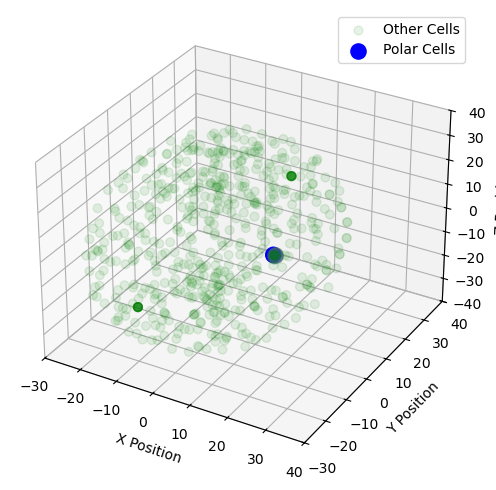

Processing timestep 92/100
Position for Border cell 360 is [15.19232063  0.09117154 -0.20126952]
Position for Border cell 361 is [15.13600066  0.2188204  -0.22358951]
Position for Border cell 362 is [ 1.52675199e+01  7.61009421e-03 -2.54389098e-01]
Position for Border cell 363 is [15.29457405  0.24771478 -0.31843732]
Position for Border cell 364 is [15.12649814  0.16047927 -0.32727313]
Position for Border cell 365 is [15.47259559  0.39067869 -0.18108929]
[14.77913739  0.17203184 -0.25848145]
Polar cell 366 position: [14.77913739  0.17203184 -0.25848145]
Border centroid: [15.69236048  0.19207681 -0.24846282]
Distance to center: 0.9134979892426175
Confinement force applied: [228.29327498   5.0109679    2.50451943]
F_total for 366th cell: [226.98388968   3.73662712   1.25654585]
[14.78347742  0.17586846 -0.25515206]
Polar cell 367 position: [14.78347742  0.17586846 -0.25515206]
Border centroid: [15.69236048  0.19207681 -0.24846282]
Distance to center: 0.9090521784610527
Confinement force 

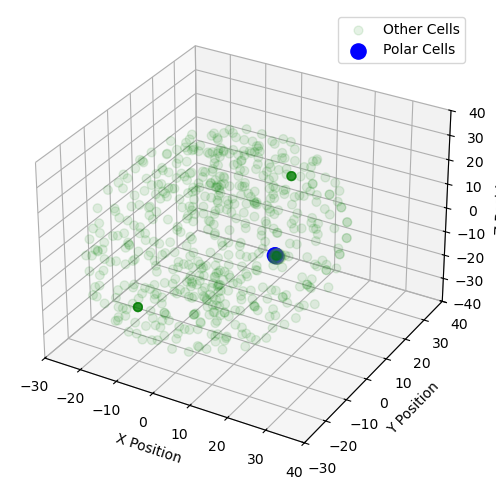

Processing timestep 93/100
Position for Border cell 360 is [15.64102941  0.10101148 -0.19579108]
Position for Border cell 361 is [15.58437939  0.22615428 -0.21934467]
Position for Border cell 362 is [ 1.57111575e+01  1.46060834e-02 -2.52219473e-01]
Position for Border cell 363 is [15.73685778  0.25298872 -0.31580915]
Position for Border cell 364 is [15.5750404   0.16972988 -0.32215506]
Position for Border cell 365 is [15.90569836  0.3879704  -0.18545749]
[15.23310517  0.17950509 -0.25596835]
Polar cell 366 position: [15.23310517  0.17950509 -0.25596835]
Border centroid: [16.12753833  0.19649536 -0.24594425]
Distance to center: 0.8946506732206753
Confinement force applied: [223.5957927    4.24732896   2.50588654]
F_total for 366th cell: [222.38010796   3.19269651   1.25800008]
[15.23760956  0.18329667 -0.25270891]
Polar cell 367 position: [15.23760956  0.18329667 -0.25270891]
Border centroid: [16.12753833  0.19649536 -0.24594425]
Distance to center: 0.8900523507489161
Confinement force 

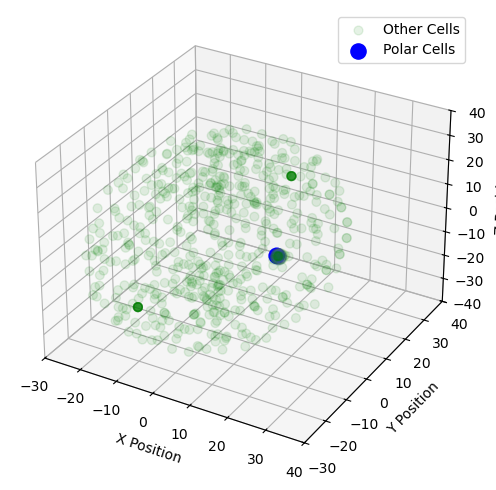

Processing timestep 94/100
Position for Border cell 360 is [16.08059329  0.11014447 -0.19026559]
Position for Border cell 361 is [16.02377269  0.23283621 -0.21506853]
Position for Border cell 362 is [16.14635748  0.02054473 -0.24991923]
Position for Border cell 363 is [16.17048156  0.25639516 -0.31322439]
Position for Border cell 364 is [16.0144135   0.17660655 -0.31733286]
Position for Border cell 365 is [16.32961146  0.38244503 -0.18985489]
[15.67786539  0.18589049 -0.25345235]
Polar cell 366 position: [15.67786539  0.18589049 -0.25345235]
Border centroid: [16.55341033  0.199395   -0.24349852]
Distance to center: 0.8757056572990306
Confinement force applied: [218.87373807   3.3759359    2.48831752]
F_total for 366th cell: [217.51228779   2.37967011   1.23867482]
[15.68146096  0.189053   -0.25026182]
Polar cell 367 position: [15.68146096  0.189053   -0.25026182]
Border centroid: [16.55341033  0.199395   -0.24349852]
Distance to center: 0.872036930121948
Confinement force applied: [217

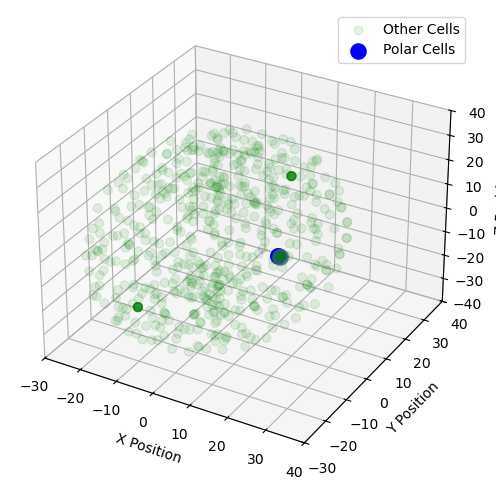

Processing timestep 95/100
Position for Border cell 360 is [16.51119728  0.11642038 -0.18474427]
Position for Border cell 361 is [16.45378977  0.23775732 -0.21082225]
Position for Border cell 362 is [16.57159251  0.02486361 -0.24765609]
Position for Border cell 363 is [16.59532084  0.25835187 -0.31078798]
Position for Border cell 364 is [16.44413447  0.18259059 -0.31289717]
Position for Border cell 365 is [16.74442713  0.37638624 -0.19408333]
[16.11288996  0.19064983 -0.250975  ]
Polar cell 366 position: [16.11288996  0.19064983 -0.250975  ]
Border centroid: [16.97041011  0.20086809 -0.24118446]
Distance to center: 0.8576369116002603
Confinement force applied: [214.36753875   2.55441586   2.44749346]
F_total for 366th cell: [213.0989548    1.20349738   1.19700642]
[16.1158986   0.19366578 -0.2478472 ]
Polar cell 367 position: [16.1158986   0.19366578 -0.2478472 ]
Border centroid: [16.97041011  0.20086809 -0.24118446]
Distance to center: 0.8545678412702488
Confinement force applied: [21

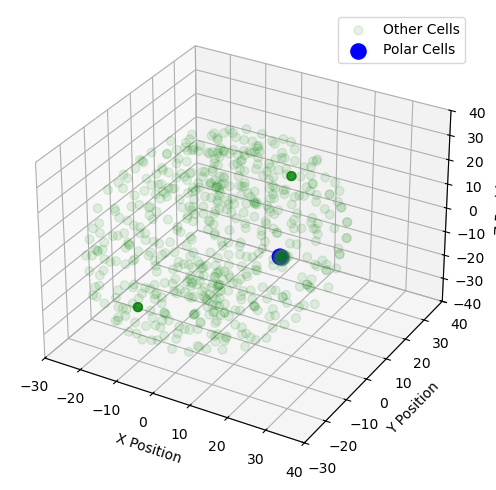

Processing timestep 96/100
Position for Border cell 360 is [16.93244315  0.12187953 -0.17933284]
Position for Border cell 361 is [16.87489125  0.24111087 -0.20670373]
Position for Border cell 362 is [16.98831752  0.02767224 -0.24553517]
Position for Border cell 363 is [17.01060944  0.25958732 -0.30851642]
Position for Border cell 364 is [16.86474095  0.18568648 -0.3088492 ]
Position for Border cell 365 is [17.15145837  0.36927207 -0.1981694 ]
[16.53908787  0.19305682 -0.24858099]
Polar cell 366 position: [16.53908787  0.19305682 -0.24858099]
Border centroid: [17.37892656  0.20152932 -0.2390341 ]
Distance to center: 0.8399356764522452
Confinement force applied: [209.9471723    2.11799793   2.38658165]
F_total for 366th cell: [208.82847211   0.81108441   1.13592516]
[16.54227934  0.1957668  -0.24551254]
Polar cell 367 position: [16.54227934  0.1957668  -0.24551254]
Border centroid: [17.37892656  0.20152932 -0.2390341 ]
Distance to center: 0.8366921426722368
Confinement force applied: [20

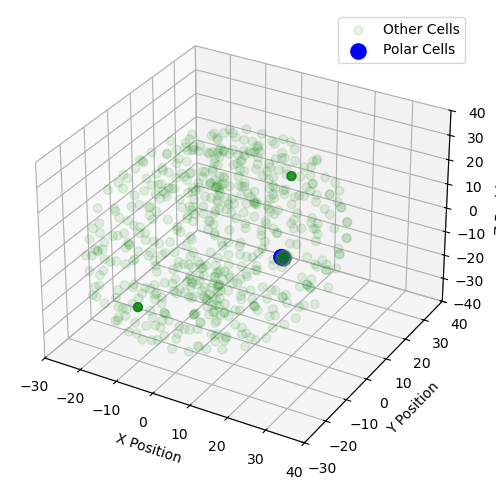

Processing timestep 97/100
Position for Border cell 360 is [17.34457581  0.12706899 -0.17408541]
Position for Border cell 361 is [17.28760181  0.2432073  -0.20279755]
Position for Border cell 362 is [17.39638263  0.03026848 -0.24359546]
Position for Border cell 363 is [17.41842522  0.25908214 -0.30636387]
Position for Border cell 364 is [17.27622556  0.1878375  -0.30515221]
Position for Border cell 365 is [17.55034831  0.3617115  -0.20221008]
[16.95674482  0.19467899 -0.24630914]
Polar cell 366 position: [16.95674482  0.19467899 -0.24630914]
Border centroid: [17.77936783  0.2016991  -0.23705199]
Distance to center: 0.8227050473385021
Confinement force applied: [205.64325398   1.75491948   2.31414785]
F_total for 366th cell: [204.5009909    0.5678083    1.06313144]
[16.95926179  0.19776564 -0.24330143]
Polar cell 367 position: [16.95926179  0.19776564 -0.24330143]
Border centroid: [17.77936783  0.2016991  -0.23705199]
Distance to center: 0.8201392808714465
Confinement force applied: [20

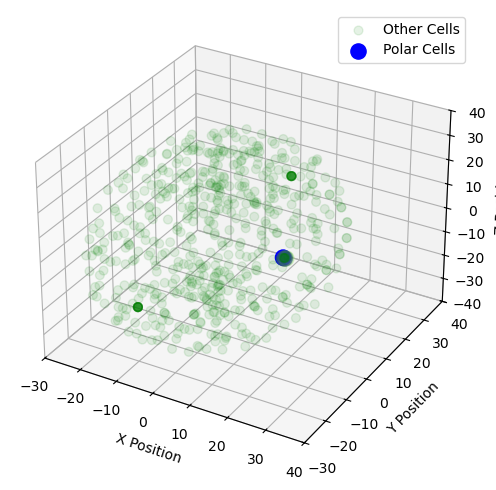

Processing timestep 98/100
Position for Border cell 360 is [17.74937041  0.13113168 -0.16903075]
Position for Border cell 361 is [17.69092898  0.24477302 -0.19914074]
Position for Border cell 362 is [17.79615724  0.03164144 -0.24183497]
Position for Border cell 363 is [17.8181497   0.2593812  -0.30432647]
Position for Border cell 364 is [17.68006245  0.18917735 -0.30175669]
Position for Border cell 365 is [17.9415382   0.35408988 -0.20622231]
[17.3657468   0.19581461 -0.24418288]
Polar cell 366 position: [17.3657468   0.19581461 -0.24418288]
Border centroid: [18.17211188  0.20172751 -0.23520433]
Distance to center: 0.8064367404072048
Confinement force applied: [201.57877069   1.47813487   2.24449734]
F_total for 366th cell: [2.00345924e+02 1.99711977e-01 9.94023823e-01]
[17.36879959  0.19897567 -0.24123353]
Polar cell 367 position: [17.36879959  0.19897567 -0.24123353]
Border centroid: [18.17211188  0.20172751 -0.23520433]
Distance to center: 0.8033396283777512
Confinement force applie

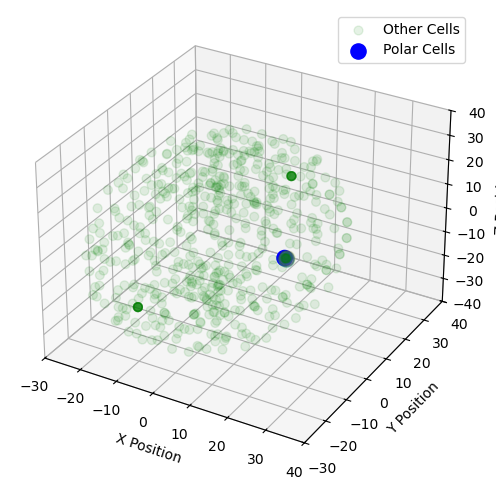

Processing timestep 99/100
Position for Border cell 360 is [18.14612411  0.13507891 -0.16417494]
Position for Border cell 361 is [18.08670297  0.2464222  -0.19568156]
Position for Border cell 362 is [18.18840612  0.03338104 -0.2401995 ]
Position for Border cell 363 is [18.20970959  0.25792605 -0.30235798]
Position for Border cell 364 is [18.07593029  0.19053228 -0.29863142]
Position for Border cell 365 is [18.32579818  0.3470246  -0.2101806 ]
[17.76643865  0.19621403 -0.24219483]
Polar cell 366 position: [17.76643865  0.19621403 -0.24219483]
Border centroid: [18.55850817  0.20149028 -0.23345605]
Distance to center: 0.7921353043497273
Confinement force applied: [198.00488275   1.31897868   2.18455639]
F_total for 366th cell: [ 1.97010993e+02 -3.44002363e-02  9.33550005e-01]
[17.7691704   0.19924154 -0.23930758]
Polar cell 367 position: [17.7691704   0.19924154 -0.23930758]
Border centroid: [18.55850817  0.20149028 -0.23345605]
Distance to center: 0.789362666498314
Confinement force appl

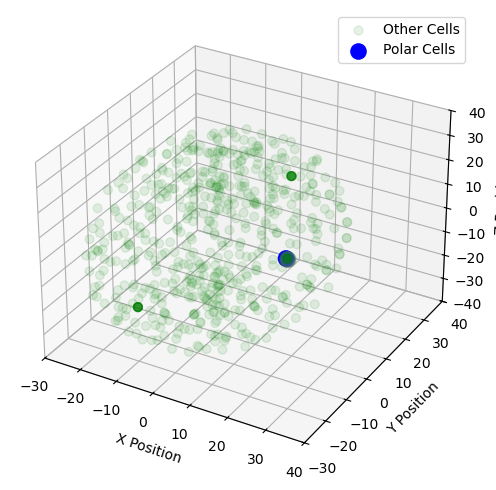

Processing timestep 100/100
Position for Border cell 360 is [18.536011    0.13869196 -0.15949623]
Position for Border cell 361 is [18.47639396  0.24750756 -0.19240275]
Position for Border cell 362 is [18.57456901  0.03440845 -0.23866005]
Position for Border cell 363 is [18.59547894  0.25688272 -0.30040623]
Position for Border cell 364 is [18.46520431  0.19189361 -0.29571971]
Position for Border cell 365 is [18.70339183  0.33955736 -0.21405135]
[18.16046063  0.19614523 -0.24032773]
Polar cell 366 position: [18.16046063  0.19614523 -0.24032773]
Border centroid: [18.93830788  0.20139602 -0.23177804]
Distance to center: 0.7779119501074264
Confinement force applied: [194.4493119    1.3126121    2.13728544]
F_total for 366th cell: [193.21174736   0.21302538   0.92611515]
[18.16242389  0.19959901 -0.23748146]
Polar cell 367 position: [18.16242389  0.19959901 -0.23748146]
Border centroid: [18.93830788  0.20139602 -0.23177804]
Distance to center: 0.7759070289061992
Confinement force applied: [1

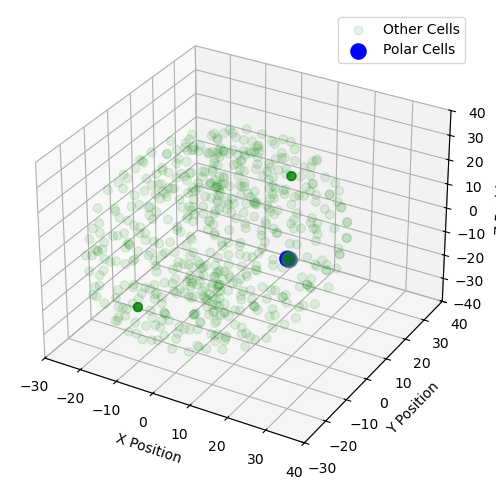

In [136]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from PIL import Image
import os
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.pyplot import cm

def plot_positions_3d(positions, border_cell_positions, polar_cell_positions, filename="frame.png", xlim=None, ylim=None, zlim=None):
    # Create a 3D plot showing the positions of all cells, with border and polar cells highlighted
    fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(111, projection='3d')

    # Plot all cells
    ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2], color='green', alpha=0.1, label="Other Cells", s=40)
    #ax.scatter(positions[3, 0], positions[3, 1], positions[3, 2], color='green', alpha=0.5, label="Other Cells")


    # Plot border cells
    border_cells = np.array(border_cell_positions)
    print(border_cells)
    colormap = plt.cm.viridis  # Use a colormap with a unique color for each border cell
    for i, border_cell in enumerate(border_cells):
        ax.scatter(border_cell[0], border_cell[1], border_cell[2], color=colormap(i/len(border_cells)), alpha = 0.2, marker="o", s=120)
    #ax.scatter(border_cells[:, 0], border_cells[:, 1], border_cells[:, 2], color='red', label="Border Cells", marker="o", s=240)

    # Plot polar cells
    polar_cells = np.array(polar_cell_positions)
    #print(polar_cells)
    ax.scatter(polar_cells[:,0], polar_cells[:,1], polar_cells[:,2], color='blue', label="Polar Cells", marker="o",s =120)
    #ax.quiver(
    #polar_cells[:,0], polar_cells[:,1], polar_cells[:,2],  # Start point of the arrow
    #grad_f[0], grad_f[1], grad_f[2],  # Vector components
    #color='cyan', length=1.0, normalize=True, arrow_length_ratio=0.2)


    # Set labels
    ax.set_xlabel('X Position')
    ax.set_ylabel('Y Position')
    ax.set_zlabel('Z Position')
    ax.legend()

    # Set custom axis limits if provided
    if xlim:
        ax.set_xlim(xlim)
    if ylim:
        ax.set_ylim(ylim)
    if zlim:
        ax.set_zlim(zlim)
    ax.set_xlim([-30, 40])
    ax.set_ylim([-30, 40])
    ax.set_zlim([-40, 40])

    # Save the current frame as an image
    plt.savefig(filename)
    plt.show()

def create_gif_3d(positions, cells, grad_f, D, mu, timesteps=50, gif_filename="cell_migration_3d.gif"):
    border_cell_positions = []  # List to store border cell positions at each timestep
    polar_cell_positions = []  # List to store polar cell positions at each timestep
    
    # Track the positions of border and polar cells over time
    for t in range(timesteps):
        print(f"Processing timestep {t+1}/{timesteps}")
        
        # Update the cell positions for this timestep
        positions, border_cells, polar_cells = evolve_system(positions, cells, grad_f, D, mu, 1)
        
        # Store the positions of the border and polar cells
        border_cell_positions.append(border_cells)
        polar_cell_positions.append(polar_cells)
        
        # Plot the current positions of the cells and save the frame
        #plot_positions_3d(positions, border_cell_positions[-1], polar_cell_positions[-1], filename=f"frame_{t}.png")
        plot_positions_3d(positions, border_cells, polar_cells, filename=f"frame_{t}.png" )

    # Create GIF from saved frames
    frames = []
    for t in range(timesteps):
        frame = Image.open(f"frame_{t}.png")
        frames.append(frame)
    
    # Save as a GIF
    frames[0].save(gif_filename, save_all=True, append_images=frames[1:], duration=200, loop=0)

    # Clean up individual frames
    for t in range(timesteps):
        os.remove(f"frame_{t}.png")

create_gif_3d(positions, cells, grad_f, D, mu, timesteps=100, gif_filename="cell_migration_3d.gif")
